# Pharmacokinetics and Pharmacodynamics of Myelotoxicity

### Contents
- [Introduction](1_introduction.ipynb)
- [The Forward Model](2_forward_model.ipynb)
- [Exploring Data](3_data_explore.ipynb)
- **Parameter Inference**
    - [Maximum Likelihood](#Maximum-Likelihood)
        - [Maximum Likelihood PK](#Maximum-Likelihood-PK)
        - [Maximum Likelihood PD](#Maximum-Likelihood-PD)
    - [Bayesian Inference](#Bayesian-Inference)
        - [Bayesian Inference Pk](#Bayesian-Inference-PK)
        - [Bayesian Inference PD](#Bayesian-Inference-PD)
- [Parameter Identifiability](5_profile_likelihoods.ipynb)
- [Model Selection](PD_naive_pooled_inference.ipynb)

In [1]:
import pandas
import pints
import pints.plot
import pints.io
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from Code.PK_model import PintsPKLinIV as Pints_PK_model
from Code.PD_model import PintsPDFribergLinE as Pints_PD_model
from Code.Likelihoods import MultiplicativeGaussianLogLikelihood, GaussianLogLikelihood, ConstantAndMultiplicativeGaussianLogLikelihood


image_file = "../Images/parameter_inference/"

## Parameter Inference

As seen in section \ref{section:forward-model}, the forward problem comes naturally: given a model and a set of parameters, $\theta = \left(CL, Q_d, K_\textrm{tr}, slope, \ldots\right)$, what is the resulting time-profiles of the variables. However, the model and parameters that best describe actuality are not known, but the resulting time-profiles (of particular variables, at certain time points, of a sample of individuals) are known. This describes the reverse problem: given a data-set, which model and set of parameters can best describe the observations. To solve this reverse problem, parameter inference and model selection needs to be carried out. Then, after the reverse problem has been solved, we can explore the forward problem to make predictions on the effects of differing doses.

In [2]:
drug = 'Docetaxel'
dose = 10.0
num_comp = 2
observation_name = 'Platelets '

### Maximum Likelihood

A common approach to parameter inference is to maximise the probability the data, $X^\textrm{obs}$, was generated by the model with parameters, $\theta \in \Theta$, over the parameter space $\Theta$. This probability, $P\left(X^\textrm{obs}|\theta\right)$, is called the likelihood and can be calculated as the product of point-wise likelihoods,
\begin{equation*}
P\left(X^\textrm{obs}|\theta\right) = \prod_{x^{obs}_i \in X^\textrm{obs}} P\left(x^{obs}_i|\theta\right).
\end{equation*}
Alternatively, a computationally easier but equivalent optimisation is the log-likelihood,
\begin{equation*}
\log\left(P\left(X^\textrm{obs}|\theta\right)\right) = \sum_{x^{obs}_i \in X^\textrm{obs}} \log\left(P\left(x^{obs}_i|\theta\right)\right).
\end{equation*}

There are 12 parameters to find in the Friberg PKPD model: $k_0$, $k_1$, $V_c$, $V_1$, $\sigma_\textrm{rel, PK}$, $C_{\textrm{cell,}0}$, MTT, $\gamma$, $s$, $\sigma_\textrm{base,PD}$, $\sigma_\textrm{rel,PD}$ and $\eta_\textrm{PD}$. This means there is a 12-dimensional parameter space to search. However to speed up the searching, I have split this into two problems, the PK problem and the PD problem. The PK problem optimises the likelihood $P\left(X^\textrm{obs}_\textrm{PK}|\theta_\textrm{PK}, \sigma_c\right)$, over the 5-dimensional parameter space $\Theta_\textrm{PK}$, with $\theta_\textrm{PK} = \left(k_0, k_1, V_c, V_1, \sigma_\textrm{rel,PK}\right) \in \Theta_\textrm{PK}$ and given the drug concentration over time data, $X^\textrm{obs}_\textrm{PK}$. The PD problem optimises the likelihood $P\left(X^\textrm{obs}_\textrm{PD}|\theta_\textrm{PD}, \sigma_c\right)$, over the 7-dimensional parameter space $\Theta_\textrm{PD}$, with $\theta_\textrm{PD} = \left(C_\textrm{cell, }0, \textrm{MTT}, \gamma, s, \sigma_\textrm{base,PD}, \sigma_\textrm{rel,PD}, \eta_\textrm{PD}\right) \in \Theta_\textrm{PD}$ and given the blood cell concentration over time data, $X^\textrm{obs}_\textrm{PD}$. The PD problem would use the PK parameters fixed to the optimum found.

#### Maximum Likelihood PK
To find the optimum of these likelihoods I used the CMA-ES (Covariance Matrix Adaptation Evolution Strategy) algorithm to search the parameter space, implemented by the PINTS package for python\cite{PINTS}. This searching algorithm works by having a population of points, $Y^{\left(g\right)} \subset \Theta$, and iteratively generating new populations based on the output of the objective function, the function to optimise, at the points in the previous population. This new population, $Y^{\left(g+1\right)}$, is selected using a normal distribution based on the covariance matrix: 
        \begin{equation*}
            \theta_k^{\left(g+1\right)} = \mathbf{m}^{\left(g\right)} + h^{\left(g\right)}\mathbf{\nu}_k, \hspace{20 mm} \forall \theta_k^{\left(g+1\right)} \in Y^{\left(g+1\right)},
        \end{equation*}
        where $\nu_k \sim \mathcal{N}\left(\mathbf{0},\,\mathbf{C}^{\left(g\right)}\right)$; $\mathbf{m}^{\left(g\right)} = \sum_{\theta_x \in B^{\left(g\right)}} w_x \theta_x$, a weighted average over the subset $B^{\left(g\right)} \subset Y^{\left(g\right)}$ of the best points in the sample according to our objective function. The weights are such that the points in the population are weighted more highly; $h^{\left(g\right)}$ is the step size that is adapted at each iteration; and $\mathbf{C}^{\left(g\right)}$ is an estimation of the covariance matrix using the $g$th and $\left(g-1\right)$th population. \cite{Hansen2016}

**Results on the Simulated data**

In [3]:
df = pandas.read_csv("../Data_and_parameters/PK_sim/sythesised_data_real_timepoints.csv")
df = df.loc[df['ID'] == 210.0]
dose_amount = df[['DOSE']].values[0, 0] # mg
dose_unit = "mg"
df = df.sort_values(['TIME'], ascending=True, ignore_index=True)[['TIME', 'OBS']]
print(df)

# Get actual dose amount
print("Average dose amount = " + str(dose_amount) +dose_unit)

    TIME       OBS
0  0.083  1.351712
1  0.333  0.315243
2  2.500  0.043798
3  4.666  0.026671
4  4.833  0.023257
5  5.000  0.024130
Average dose amount = 2.0mg


In [4]:
# Before starting the optimisation we should estimate the parameter Vol_C. We can do this by drawing a line 
# through the first 2 point and seeing where it crosses the y-axis
point_1 = (df['TIME'][0], df['OBS'][0])
point_2 = (df['TIME'][1], df['OBS'][1])
y_0 = point_1[1] - (point_1[1] - point_2[1])/(point_1[0] - point_2[0]) * point_1[0]
Vol_C_approx = dose_amount/y_0
print("Aproximate V_C:", Vol_C_approx)

Aproximate V_C: 1.1793709283205809


In [5]:
PK_param_names = ["V_c, L", "K_cl, L/hr", "V_1, L", "K_1, L/hr", "sigma_rel_PK"]

PK_actual_params = np.load("../Data_and_parameters/PK_sim/actual_params_dose_2.npy")

PK_model = Pints_PK_model(patient_info={'AMT':dose_amount}, num_comp=num_comp)
problem = pints.SingleOutputProblem(PK_model, df['TIME'], df['OBS'])
log_likelihood = MultiplicativeGaussianLogLikelihood(problem, fix_eta=1)
error_measure = pints.ProbabilityBasedError(log_likelihood)
lower_bound = [0.1*Vol_C_approx, 0.01, 0.01*Vol_C_approx, 0.01, 0.0001]
upper_bound = [10*Vol_C_approx, 100, 100*Vol_C_approx, 100, 1]
start_point = np.exp((np.log(lower_bound)+np.log(upper_bound))*0.5)

In [6]:
# Optimise the model with respect to the data
optimisation = pints.OptimisationController(
    error_measure, start_point, 
    method=pints.CMAES, 
    boundaries=pints.RectangularBoundaries(lower_bound, upper_bound)
)
optimisation.set_log_to_screen(False)
parameters, error = optimisation.run()
time = optimisation.time()

# print('\t\t Run 1 \t\t\t\t\t Run2')
print('Result:\t'+str(parameters))
print('Error: \t'+str(error))
print('Time Taken: \t'+str(int(time/60))+" minutes, "+str(int(time%60))+" seconds, ")

Result:	[0.87295863 3.02549968 5.47884241 2.59324932 0.02904063]
Error: 	-27.808965172744497
Time Taken: 	0 minutes, 22 seconds, 


In [6]:
# np.save('../Data_and_parameters/PK_sim/opt_'+str(drug)+'_'+str(dose), parameters)
parameters = np.load('../Data_and_parameters/PK_sim/opt_'+str(drug)+'_'+str(dose)+'.npy')

In [7]:
time_span = df["TIME"].max()
times = np.linspace(0,time_span,1000)

unit = "ng/mL"
x_label = "Time, hours"
y_label = "Drug concentration,<br> " + unit
df_graph = df.copy()
df_graph["mean"] = df_graph["OBS"]*1000

fig = px.scatter(
    df_graph,
    x="TIME",
    y="mean",
    width=500, 
    height=360,
)

fig.update_xaxes(title_text=x_label)
fig.update_yaxes(title_text=y_label)
fig.update_traces(mode='markers')
fig.update_layout(yaxis_type="log")

fig['data'][0]['showlegend']=True
fig['data'][0]['name']='Observed<br> Values'
fig.add_trace(go.Scatter(x=times, y=PK_model.simulate(parameters[:-1], times)*1000,
                    mode='lines',
                    name='Prediction'))
fig.add_trace(go.Scatter(x=times, y=PK_model.simulate(PK_actual_params[:-1], times)*1000,
                    mode='lines',
                    name='True'))

# fig.write_image(image_file + "PK_sim_opt_graph.svg")
fig.show()

In [8]:
summary_data = np.transpose(np.array([PK_param_names, np.round(parameters, 4), np.round(PK_actual_params, 4)]))
summary_df = pandas.DataFrame(summary_data, columns = ['Parameter', 'Optimised', 'True'])
summary_df.to_csv("../Data_and_parameters/PK_sim/opt_results.csv")

fig =  ff.create_table(summary_df)
fig.update_layout(
    width=250,
    height=175,
)
fig.write_image(image_file + "PK_sim_opt_table.svg")
fig.show()

**Results on Real Data**

In [3]:
df = pandas.read_csv("../Data_and_parameters/PK_real/data_refined_Docetaxel.csv")
df = df.sort_values(['DOSE', 'TIME'], ascending=True)
df = df.loc[(df['DOSE'] == dose)].reset_index()

unit = "ng/mL"
df_OBS = df[['TIME', 'DOSE', 'OBS']]
df_OBS = df_OBS.astype({'OBS': 'float64'})
df_OBS['OBS'] = df_OBS["OBS"]/1000  # Converting from ng/ml to mg/l
print(df_OBS)

# Get actual dose amount
dose_amount = df.astype({'AMT': 'float64'}).mean()['AMT']
dose_amount = dose_amount
print("Average dose amount = " + str(dose_amount))

    TIME  DOSE       OBS
0  0.083  10.0  1.580788
1  0.333  10.0  0.298965
2  2.500  10.0  0.044781
3  4.666  10.0  0.026286
4  4.833  10.0  0.028652
5  5.000  10.0  0.019924
Average dose amount = 1.9767777777777773


In [4]:
# Before starting the optimisation we should estimate the parameter Vol_C. We can do this by drawing a line 
# through the first 2 point and seeing where it crosses the y-axis
point_1 = (df_OBS['TIME'][0], df_OBS['OBS'][0])
point_2 = (df_OBS['TIME'][1], df_OBS['OBS'][1])
y_0 = point_1[1] - (point_1[1] - point_2[1])/(point_1[0] - point_2[0]) * point_1[0]
Vol_C_approx = dose_amount/y_0
print("Aproximate Vol_C:", Vol_C_approx)

Aproximate Vol_C: 0.9852588790714991


In [5]:
PK_param_names = ["V_c, L", "K_cl, L/hr", "V_1, L", "K_1, L/hr", "sigma_rel_PK"]

PK_model = Pints_PK_model(dose=dose_amount, num_comp=num_comp)
problem = pints.SingleOutputProblem(PK_model, df_OBS['TIME'], df_OBS['OBS'])
log_likelihood = MultiplicativeGaussianLogLikelihood(problem, fix_eta=1)
error_measure = pints.ProbabilityBasedError(log_likelihood)
lower_bound = [0.1*Vol_C_approx, 0.01, 0.01*Vol_C_approx, 0.01, 0.0001]
upper_bound = [10*Vol_C_approx, 100, 100*Vol_C_approx, 100, 1]
start_point = np.exp((np.log(lower_bound)+np.log(upper_bound))*0.5)

In [9]:
# Optimise the model with respect to the data
optimisation = pints.OptimisationController(error_measure, start_point, method=pints.CMAES, boundaries=pints.RectangularBoundaries(lower_bound, upper_bound))
optimisation.set_log_to_screen(False)
parameters, error = optimisation.run()
time = optimisation.time()

# print('\t\t Run 1 \t\t\t\t\t Run2')
print('Result:\t'+str(parameters))
print('Error: \t'+str(error))
print('Time Taken: \t'+str(int(time/60))+" minutes, "+str(int(time%60))+" seconds, ")

Result:	[0.68447731 2.81866848 4.87404359 2.27289305 0.09138239]
Error: 	-20.77918694048094
Time Taken: 	0 minutes, 9 seconds, 


In [10]:
np.save('../Data_and_parameters/PK_real/opt_'+str(drug)+'_'+str(dose), parameters)
# parameters = np.load('../Data_and_parameters/PK_real/opt_'+str(drug)+'_'+str(dose)+'.npy')

In [11]:
time_span = df_OBS["TIME"].max()
times = np.linspace(0,time_span,1000)

x_label = "Time, hours"
y_label = drug + " concentration,<br> " + unit
df_graph = df.copy()
df_graph["OBS"] = df_graph["OBS"]

fig = px.scatter(
    df_graph,
    x="TIME",
    y="OBS",
    error_y = "std",
    width=500, 
    height=360,
)

fig.update_xaxes(title_text=x_label)
fig.update_yaxes(title_text=y_label)
fig.update_traces(mode='markers')
fig.update_yaxes(type="log", dtick=1)

fig['data'][0]['showlegend']=True
fig['data'][0]['name']='Observed<br> Values'
fig.add_trace(go.Scatter(x=times, y=1000*PK_model.simulate(parameters[:-1], times),
                    mode='lines',
                    name='Prediction'))


fig.write_image(image_file + "PK_"+drug+"_"+str(dose)+"_opt_graph.svg")
fig.show()

In [13]:
summary_data = np.transpose(np.array([PK_param_names, np.round(parameters, 4)]))
summary_df = pandas.DataFrame(summary_data, columns = ['Parameter', 'Value'])
summary_df.to_csv("../Data_and_parameters/PK_real/opt_results.csv")

fig =  ff.create_table(summary_df)
fig.update_layout(
    width=150,
    height=175,
)
fig.write_image(image_file + "PK_"+drug+"_"+str(dose)+"_opt_table.svg")
fig.show()

#### Maximum Likelihood PD

As all of the noise models explored in this report are Gaussian, each of these observations are expected to be normally distributed around the simulation, i.e.  $x^{obs}_i \sim N\left(x^\textrm{sim}\left(t_i\right), \sigma_i^2\right)$ where $\sigma_i$ is the standard deviation of the observation at time $t=t_i$. Thus the pointwise likelihood can be formulated as a Gaussian distribution,
        \begin{align*}
            P\left(x^{obs}_i|\theta\right) &= P\left(x^{obs}_i|x^\textrm{sim}\left(t_i\right) = x^{\theta}\left(t_i\right), \sigma_i\right) \\
            &= \frac{1}{\sqrt{2\pi\sigma_i^2}}e^{-\frac{1}{2}\left(x^{obs}_i - x^\theta\left(t_i\right)\right)^2\sigma_i^{-2} },
        \end{align*}
        where $x^{\theta}$ is the simulated dynamical model under parameters $\theta$. The pointwise log-likelihood would then be
        \begin{align*}
            \log \left(P\left(x^{obs}_i|\theta\right)\right) = -\frac{1}{2}\log\left(2\pi\right) -\log\left(\sigma_i\right) -\frac{1}{2}\left(\frac{x^{obs}_i - x^\theta\left(t_i\right)}{\sigma_i}\right)^2,
        \end{align*}
        However, $\sigma_i$ differs depending on the noise model. If a constant noise is assumed, $\sigma_i = \sigma_c$ and the log-likelihood is 
        \begin{align*}
            \log \left(P\left(x^{obs}_i|\theta\right)\right) &= \sum_{x^{obs}_i \in X^\textrm{obs}} \left(-\frac{1}{2}\log\left(2\pi\right) -\log\left(\sigma_c\right) -\frac{1}{2}\left(\frac{x^{obs}_i - x^\theta\left(t_i\right)}{\sigma_c}\right)^2\right).
        \end{align*}
        For multiplicative noise, $\sigma_i = \sigma_m x^\textrm{sim}\left(t_i\right)^\eta$ and the log-likelihood is 
        \begin{align*}
            \log \left(P\left(x^{obs}_i|\theta\right)\right) &= \sum_{x^{obs}_i \in X^\textrm{obs}} \left(-\frac{1}{2}\log\left(2\pi\right) -\log\left(\sigma_m x^\textrm{sim}\left(t_i\right)^\eta\right) -\frac{1}{2}\left(\frac{x^{obs}_i - x^\theta\left(t_i\right)}{\sigma_m x^\textrm{sim}\left(t_i\right)^\eta}\right)^2\right).
        \end{align*}
       And in the case of combined multiplicative and constant noise, $\sigma_i = \sigma_c + \sigma_m x^\theta\left(t_i\right)^\eta$ and the log-likelihood is 
        \begin{align*}
            \log \left(P\left(x^{obs}_i|\theta\right)\right) &= \sum_{x^{obs}_i \in X^\textrm{obs}} \left(-\frac{1}{2}\log\left(2\pi\right) -\log\left(\sigma_c + \sigma_m x^\textrm{sim}\left(t_i\right)^\eta \right) -\frac{1}{2}\left(\frac{x^{obs}_i - x^\theta\left(t_i\right)}{\sigma_c + \sigma_m x^\theta\left(t_i\right)^\eta }\right)^2\right).
        \end{align*}
        
Maximising the likelihood with the constant Gaussian noise model, would also be equivalent to minimising the sum of squares error, 
\[ 
    f\left(\theta\right) = \sum_i \left(x^{\theta}\left(t_i\right) - x_i^\textrm{obs}\right)^2,
\] 
as
\[
    \log\left(P\left(X^\textrm{obs}|\theta\right)\right) = A - Bf\left(\theta\right),
\] 
for constants $A = n_\textrm{obs} \left(- 0.5 \log 2\pi -  \log\sigma_c\right)$ and $B =0.5\sigma_c^{-2}$, where $n_\textrm{obs}$ is the number of observations. However, this optimisation does not provide any information on $\sigma_c$.
        
**Results on the Simulated data**

In [3]:
PD_actual_params = np.load("../Data_and_parameters/PD_sim/actual_params_dose_2.npy")
PD_param_names = ["R_0", "MTT", "gamma", "s", "sigma_c", "eta", "sigma_m"]
print("Parameters used for simulated data:")
for i in range(0,len(PD_param_names)):
    print(PD_param_names[i] + " = " + str(PD_actual_params[i]))

Parameters used for simulated data:
R_0 = 983.1
MTT = 85.26
gamma = 0.44
s = 20.0
sigma_c = 42.43
eta = 1.0
sigma_m = 0.13


In [4]:
# Retrieve the parameters for the simulated data

PK_params=np.load("../Data_and_parameters/PK_sim/actual_params_dose_2.npy")[:-1]

df = pandas.read_csv("../Data_and_parameters/PD_sim/sythesised_data_real_timepoints.csv")
df = df.loc[df['ID'] == 210.0]
dose_amount = df[['DOSE']].values[0, 0]
dose_unit = "mg"
df = df.sort_values(['TIME'], ascending=True, ignore_index=True)[['TIME', 'OBS']]
print(df)


start_time = df['TIME'].min()
PD_model_simulated = Pints_PD_model(PK_params, patient_info={'AMT':dose_amount, 'start_time':start_time}, num_comp=2)

df_before_0 = df[df["TIME"] < 0]
times_before_dose = len(df_before_0["OBS"])
R_0_approx = np.mean(df_before_0["OBS"])
print("approximate R_0: ", R_0_approx)

    TIME          OBS
0  -48.0   861.340234
1   48.0   828.241563
2  120.0   482.736772
3  192.0   788.905363
4  264.0  1351.209679
5  336.0  1436.375643
6  432.0   613.274424
7  552.0   854.278527
approximate R_0:  861.3402342100585


Constant

In [5]:
# Optimise the model with respect to the data
problem = pints.SingleOutputProblem(PD_model_simulated, df['TIME'].to_numpy()-start_time, df['OBS'].to_numpy())
log_likelihood = GaussianLogLikelihood(problem)
error_measure = pints.ProbabilityBasedError(log_likelihood)

lower_bound = [0.1*R_0_approx, df['TIME'].max()*0.01, 0.005, 0.01,     0.001,      0.001, 0.001]
upper_bound = [10*R_0_approx,      df['TIME'].max(),     5,    100,   R_0_approx,   10,    1]

point = list(np.exp((np.log(np.asarray(lower_bound)) + np.log(np.asarray(upper_bound)))/2))
point[0] = R_0_approx
print(point)
unchanged_threshold = 1e-4

[861.3402342100585, 55.20000000000002, 0.158113883008419, 1.0000000000000004, 0.9280841740974032, 0.10000000000000002, 0.0316227766016838]


In [6]:
optimisation = pints.OptimisationController(error_measure, point[:5], method=pints.CMAES, boundaries=pints.RectangularBoundaries(lower_bound[:5], upper_bound[:5]))
optimisation.set_max_unchanged_iterations(threshold=unchanged_threshold)

optimisation.set_log_to_screen(True)
parametersadd, erroradd = optimisation.run()
actual_error = error_measure(PD_actual_params[:5])
resultsadd = (parametersadd, erroradd, actual_error)
print(resultsadd)

Minimising error measure
Using Covariance Matrix Adaptation Evolution Strategy (CMA-ES)
Running in sequential mode.
Population size: 8
Iter. Eval. Best      Time m:s
0     8      116952.2   0:00.3
1     16     52104.35   0:00.5
2     24     25544.66   0:00.8
3     32     7841.406   0:01.2
20    168    45.84153   0:07.5
40    328    39.30596   0:12.5
60    488    36.71675   0:16.4
80    648    35.76962   0:20.4
100   808    35.59524   0:24.4
120   968    35.56036   0:28.5
140   1128   35.56009   0:32.5
160   1288   35.56008   0:36.4
180   1448   35.56008   0:40.4
200   1608   35.56008   0:44.4
220   1768   35.56008   0:48.3
240   1928   35.56008   0:52.3
260   2088   35.56008   0:56.2
280   2248   35.56008   1:00.1
300   2408   35.56008   1:04.1
320   2568   35.56008   1:08.0
324   2592   35.56008   1:08.6
Halting: No significant change for 200 iterations.
(array([8.61406054e+02, 9.72628443e+01, 6.89887858e-01, 2.44658701e+01,
       4.60691251e+01]), 35.56008234359122, 61.1583918554332

Relative

In [7]:
# Optimise the model with respect to the data
log_likelihood = MultiplicativeGaussianLogLikelihood(problem)
error_measure = pints.ProbabilityBasedError(log_likelihood)

In [8]:
optimisation = pints.OptimisationController(error_measure, point[:4]+point[5:], method=pints.CMAES, boundaries=pints.RectangularBoundaries(lower_bound[:4]+lower_bound[5:], upper_bound[:4]+upper_bound[5:]))
optimisation.set_max_unchanged_iterations(threshold=unchanged_threshold)

optimisation.set_log_to_screen(True)
parametersmult, errormult = optimisation.run()
actual_error = error_measure(list(PD_actual_params[:4])+list(PD_actual_params[5:]))
parametersmult = (parametersmult, errormult, actual_error)
print(parametersmult)

Minimising error measure
Using Covariance Matrix Adaptation Evolution Strategy (CMA-ES)
Running in sequential mode.
Population size: 9
Iter. Eval. Best      Time m:s
0     9      4981997    0:01.5
1     18     796006.9   0:03.0
2     27     21454.58   0:04.2
3     36     256.7333   0:05.7
20    189    147.1604   0:38.9
40    369    147.1546   1:20.0
60    549    147.1333   2:01.7
80    729    147.1308   2:46.5
100   909    147.1003   3:30.9
120   1089   146.3855   4:14.8
140   1269   146.029    4:58.1
160   1449   146.0221   5:39.6
180   1629   145.9689   6:18.1
200   1809   145.9411   6:57.6
220   1989   145.9368   7:38.6
240   2169   145.936    8:20.1
260   2349   145.9344   9:01.6
280   2529   145.9295   9:43.1
300   2709   145.9225  10:24.5
320   2889   145.9151  11:06.2
340   3069   145.9114  11:48.5
360   3249   145.9027  12:30.8
380   3429   145.8913  13:13.2
400   3609   145.8855  13:55.4
420   3789   145.8786  14:37.8
440   3969   145.8716  15:20.0
460   4149   145.8566  16:02

In [9]:
# Optimise the model with respect to the data
log_likelihood = ConstantAndMultiplicativeGaussianLogLikelihood(problem)
error_measure = pints.ProbabilityBasedError(log_likelihood)

In [10]:
optimisation = pints.OptimisationController(error_measure, point, method=pints.CMAES, boundaries=pints.RectangularBoundaries(lower_bound, upper_bound))
optimisation.set_max_unchanged_iterations(threshold=unchanged_threshold)

optimisation.set_log_to_screen(True)
parameterscomb, errorcomb = optimisation.run()
actual_error = error_measure(PD_actual_params)
parameterscomb = (parameterscomb, errorcomb, actual_error)
print(parameterscomb)

Minimising error measure
Using Covariance Matrix Adaptation Evolution Strategy (CMA-ES)
Running in sequential mode.
Population size: 9
Iter. Eval. Best      Time m:s
0     9      249144     0:01.6
1     18     249144     0:03.1
2     27     196204.2   0:04.6
3     36     25621.78   0:05.9
20    189    147.2591   0:39.1
40    369    146.9141   1:09.0
60    549    146.8467   1:36.3
80    729    146.7738   2:04.5
100   909    146.7195   2:33.8
120   1089   146.6189   3:03.1
140   1269   146.3694   3:32.4
160   1449   145.0404   4:00.2
180   1629   141.4366   4:25.0
200   1809   134.0965   4:49.2
220   1989   133.0738   5:15.0
240   2169   132.9569   5:41.4
260   2349   132.8595   6:08.5
280   2529   132.6884   6:35.2
300   2709   132.1778   7:01.7
320   2889   128.492    7:28.6
340   3069   128.3379   7:56.3
360   3249   128.2817   8:24.3
380   3429   128.2287   8:52.1
400   3609   128.2222   9:20.0
420   3789   128.2198   9:48.0
440   3969   128.2159  10:15.8
460   4149   128.2133  10:43

In [11]:
# Optimise the model with respect to the data
log_likelihood = MultiplicativeGaussianLogLikelihood(problem, fix_eta=1)
error_measure = pints.ProbabilityBasedError(log_likelihood)

In [12]:
optimisation = pints.OptimisationController(error_measure, point[:4]+point[6:], method=pints.CMAES, boundaries=pints.RectangularBoundaries(lower_bound[:4]+lower_bound[6:], upper_bound[:4]+upper_bound[6:]))
optimisation.set_max_unchanged_iterations(threshold=unchanged_threshold)

optimisation.set_log_to_screen(True)
parametersmult_noeta, errormult_noeta = optimisation.run()
actual_error = error_measure(list(PD_actual_params[:4])+list(PD_actual_params[6:]))
parametersmult_noeta = (parametersmult_noeta, errormult_noeta, actual_error)
print(parametersmult_noeta)

Minimising error measure
Using Covariance Matrix Adaptation Evolution Strategy (CMA-ES)
Running in sequential mode.
Population size: 8
Iter. Eval. Best      Time m:s
0     8      148.6519   0:01.6
1     16     148.6519   0:03.2
2     24     148.3724   0:04.6
3     32     147.0012   0:06.0
20    168    146.845    0:28.8
40    328    146.8226   0:51.9
60    488    146.7685   1:16.1
80    648    146.7133   1:41.9
100   808    145.1973   2:07.9
120   968    130.8204   2:31.3
140   1128   130.3301   2:55.2
160   1288   130.0497   3:19.1
180   1448   128.7796   3:43.3
200   1608   128.7444   4:07.4
220   1768   128.7436   4:31.6
240   1928   128.7436   4:55.6
260   2088   128.7436   5:19.6
280   2248   128.7436   5:43.5
300   2408   128.7436   6:07.3
320   2568   128.7436   6:31.2
340   2728   128.7436   6:55.1
360   2888   128.7436   7:19.0
380   3048   128.7436   7:42.9
400   3208   128.7436   8:06.9
406   3248   128.7436   8:12.9
Halting: No significant change for 200 iterations.
(array([

In [13]:
# Optimise the model with respect to the data
log_likelihood = ConstantAndMultiplicativeGaussianLogLikelihood(problem, fix_noise=[None, 1, None])
error_measure = pints.ProbabilityBasedError(log_likelihood)

In [14]:
optimisation = pints.OptimisationController(error_measure, point[:5]+point[6:], method=pints.CMAES, boundaries=pints.RectangularBoundaries(lower_bound[:5]+lower_bound[6:], upper_bound[:5]+upper_bound[6:]))
optimisation.set_max_unchanged_iterations(threshold=unchanged_threshold)

optimisation.set_log_to_screen(True)
parameterscomb_noeta, errorcomb_noeta = optimisation.run()
actual_error = error_measure(list(PD_actual_params[:5])+list(PD_actual_params[6:]))
parameterscomb_noeta = (parameterscomb_noeta, errorcomb_noeta, actual_error)
print(parameterscomb_noeta)

Minimising error measure
Using Covariance Matrix Adaptation Evolution Strategy (CMA-ES)
Running in sequential mode.
Population size: 9
Iter. Eval. Best      Time m:s
0     9      311.9317   0:01.8
1     18     163.7804   0:03.1
2     27     147.9919   0:04.6
3     36     147.0696   0:06.0
20    189    147.0696   0:40.2
40    369    146.8074   1:07.6
60    549    146.777    1:35.4
80    729    146.7728   2:04.6
100   909    146.7604   2:33.7
120   1089   146.6227   3:03.0
140   1269   145.5057   3:32.4
160   1449   133.7197   3:59.8
180   1629   129.7765   4:27.3
200   1809   128.3565   4:55.5
220   1989   128.2744   5:23.8
240   2169   128.2222   5:51.9
260   2349   128.2198   6:20.1
280   2529   128.2198   6:48.0
300   2709   128.2198   7:16.1
320   2889   128.2198   7:44.3
340   3069   128.2198   8:12.6
360   3249   128.2198   8:40.7
380   3429   128.2198   9:08.9
400   3609   128.2198   9:37.0
420   3789   128.2198  10:05.1
440   3969   128.2198  10:33.2
453   4077   128.2198  10:50

In [45]:
df_param_names = pandas.DataFrame(
    np.asarray(PD_param_names + ['likelihood']).reshape((-1,1)), columns = ['']
)
df_param_names.columns = pandas.MultiIndex.from_product([["Parameter"], df_param_names.columns])
df_const = pandas.DataFrame(
    np.concatenate((parametersadd[0],np.asarray([None,None]+[parametersadd[1]]))).reshape((-1,1)), 
    columns = ['']
)
df_const.columns = pandas.MultiIndex.from_product([["Constant Noise"], df_const.columns])
df_mult = pandas.DataFrame(
    np.concatenate((
        np.concatenate((parametersmult[0][:4],[None], parametersmult[0][4:], [parametersmult[1]])).reshape((-1,1)), 
        np.concatenate((parametersmult_noeta[0][:4], [None, None], parametersmult_noeta[0][4:], [parametersmult_noeta[1]])).reshape((-1,1)),
    ), axis = 1),
    columns = ['Inferred Eta', 'Fixed Eta']
)
df_mult.columns = pandas.MultiIndex.from_product([["Relative Noise"], df_mult.columns])
df_comb = pandas.DataFrame(
    np.concatenate((
        np.concatenate((parameterscomb[0], [parameterscomb[1]])).reshape((-1,1)), 
        np.concatenate((parameterscomb_noeta[0][:5], [None], parameterscomb_noeta[0][5:], [parameterscomb_noeta[1]])).reshape((-1,1)),
    ), axis = 1),
    columns = ['Inferred Eta', 'Fixed Eta']
)
df_comb.columns = pandas.MultiIndex.from_product([["Combined Noise"], df_comb.columns])
df_actual = pandas.DataFrame(
    np.concatenate((PD_actual_params, [None])).reshape(-1,1), 
    columns = ['Parameters']
)
df_actual.columns = pandas.MultiIndex.from_product([["Actual"], df_actual.columns])

summary_df = pandas.concat([df_param_names, df_const, df_mult, df_comb, df_actual], axis=1)
summary_df.to_csv("../Data_and_parameters/PD_sim/opt_results.csv")

# error_actual_params = (np.round(parametersadd[2], 2),np.round(parametersmult[2], 2),np.round(parameterscomb[2], 2))
# np.save("../Data_and_parameters/PD_sim/error_actual", error_actual_params)
# error_actual_params = np.load("./Data_and_parameters/PD_sim/error_actual.npy")

# print("Objective function scores for the true parameters: ", error_actual_params)

ValueError: zero-dimensional arrays cannot be concatenated

In [46]:
summary_df = pandas.read_csv("../Data_and_parameters/PD_sim/opt_results.csv")
summary_df = summary_df.drop('Unnamed: 0', axis=1)
summary_df = summary_df.drop(0, axis=0)

summary_df["Parameter"] = PD_param_names +["Likelihood"]
summary_df = summary_df.astype(dict(zip(summary_df.columns[1:], [float]*len(summary_df.columns[1:]))))

parametersadd = np.asarray(summary_df['Constant Noise'][:5])
parametersmult = np.concatenate((
    np.asarray(summary_df[('Relative Noise')][:4]), np.asarray(summary_df[('Relative Noise')][5:-1])
))
# 
parametersmult_noeta = np.concatenate((
    np.asarray(summary_df[('Relative Noise.1')][:4]), np.asarray(summary_df[('Relative Noise.1')][6:-1])
))
parameterscomb = np.asarray(summary_df[('Combined Noise')][:-1])
parameterscomb_noeta = np.concatenate((
    np.asarray(summary_df[('Combined Noise.1')][:5]), np.asarray(summary_df[('Combined Noise.1')][6:-1])
))

print(parametersadd, parametersmult, parametersmult_noeta, parameterscomb, parameterscomb_noeta)

summary_df = summary_df.astype(dict(zip(summary_df.columns[1:], [float]*len(summary_df.columns[1:]))))
summary_df = summary_df.round(decimals=dict(zip(summary_df.columns[1:], [2]*len(summary_df.columns[1:]))))
summary_df = summary_df.replace(np.nan, '.')
summary_df['Parameter'] = np.asarray(PD_param_names + ['likelihood'])

header = [['Parameter', ''], ['Constant Noise',''], ['Relative Noise', 'Inferred Eta'],
 ['Relative Noise', 'Fixed Eta'], ['Combined Noise', 'Inferred Eta'],
 ['Combined Noise', 'Fixed Eta'], ['Actual Parameters','']]

fig = go.Figure(data=[go.Table(
    header=dict(values=header,
                align='left'),
    cells=dict(values=summary_df.transpose().values.tolist(),
               align='left'))
])
fig.update_layout(
    width=760,
    height=450,
)
fig.write_image(image_file + "PD_sim_opt_table.svg")
fig.show()

[9.75811985e+02 5.52000000e+02 5.00000485e-03 1.00000000e-02
 3.60777576e+02] [1.00024461e+03 2.44741752e+01 1.06783321e+00 1.00000000e-02
 1.85401261e+00 1.00000000e-03] [9.69936842e+02 8.04632250e+01 4.33736349e-01 2.30596247e+01
 1.63119569e-01] [9.67916419e+02 8.05001709e+01 4.33372613e-01 2.46763297e+01
 9.29590933e+01 1.58333031e+00 1.00000000e-03] [9.68510542e+02 8.06146186e+01 4.35675781e-01 2.47851693e+01
 7.15946343e+01 7.97470739e-02]


In [52]:
summary_df_reduced = summary_df.drop('Relative Noise.1', axis=1)
summary_df_reduced = summary_df_reduced.drop('Combined Noise.1', axis=1)
header = ['Parameter', 'Constant Noise', 'Relative Noise','Combined Noise', 'Actual']

fig = go.Figure(data=[go.Table(
    header=dict(values=header,
                align='left'),
    cells=dict(values=summary_df_reduced.transpose().values.tolist(),
               align='left'))
])
fig.update_layout(
    width=500,
    height=450,
)
fig.write_image(image_file + "PD_sim_opt_table_reduced.svg")
fig.show()

In [20]:
time_span = df["TIME"].max()
times = np.linspace(start_time,time_span,1000)

x_label = "Time, hours"
unit = "1000/L"
y_label = "Circulating blood cells,<br>" + unit

fig = px.scatter(
    df,
    x="TIME",
    y="OBS",
    width=500, 
    height=360,
)

fig.update_xaxes(title_text=x_label)
fig.update_yaxes(title_text=y_label)


fig['data'][0]['showlegend']=True
fig['data'][0]['name']='Simulated Data'
fig.add_trace(go.Scatter(x=times, y=PD_model_simulated.simulate(parametersadd[:-1], times-start_time),
                    mode='lines',
                    name='Prediction:<br>Constant Noise'))
# fig.add_trace(go.Scatter(x=times, y=PD_model_simulated.simulate(parametersmult[:-2], times-start_time),
#                     mode='lines',
#                     name='Prediction:<br>Relative Noise'))
# fig.add_trace(go.Scatter(x=times, y=PD_model_simulated.simulate(parameterscomb[:-3], times-start_time),
#                     mode='lines',
#                     name='Prediction:<br>Combined Noise'))
fig.add_trace(go.Scatter(x=times, y=PD_model_simulated.simulate(PD_actual_params[:-3], times-start_time),
                    mode='lines',
                    name='Actual Curve'))
fig.update_layout(yaxis_range=[400, 2000])
fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1
))

# fig.write_image(image_file + "PD_sim_opt_graph.svg")
fig.show()

fig = px.scatter(
    df,
    x="TIME",
    y="OBS",
    width=500, 
    height=360,
)

fig.update_xaxes(title_text=x_label)
fig.update_yaxes(title_text=y_label)


fig['data'][0]['showlegend']=True
fig['data'][0]['name']='Simulated Data'
fig.add_trace(go.Scatter(x=times, y=PD_model_simulated.simulate(parametersmult_noeta[:-1], times-start_time),
                    mode='lines',
                    line = dict(color=px.colors.qualitative.Plotly[2]),
                    name='Prediction:<br>Relative Noise'))
fig.add_trace(go.Scatter(x=times, y=PD_model_simulated.simulate(parameterscomb_noeta[:-2], times-start_time),
                    mode='lines',
                    line = dict(color=px.colors.qualitative.Plotly[3]),
                    name='Prediction:<br>Combined Noise'))
fig.add_trace(go.Scatter(x=times, y=PD_model_simulated.simulate(PD_actual_params[:-3], times-start_time),
                    mode='lines',
                    line = dict(color=px.colors.qualitative.Plotly[4]),
                    name='Actual Curve'))
fig.update_layout(yaxis_range=[400, 2000])

# fig.write_image(image_file + "PD_noeta_sim_opt_graph.svg")
fig.show()


NameError: name 'parametersmult_noeta' is not defined

**Results on the experimental data**

In [3]:
PD_param_names = ["R_0", "MTT", "gamma", "s", "sigma_c", "eta", "sigma_m"]

In [4]:
# Retrieve the PK parameters & PD data

PK_params=np.load("../Data_and_parameters/PK_real/opt_"+drug+"_"+str(dose)+".npy")[:4]
df = pandas.read_csv("../Data_and_parameters/PD_real/data_refined_"+drug+"_dose_"+str(dose))
df = df.drop('Unnamed: 0', axis=1)
start_time = df['TIME'].min()
print(df)

dose_amount = df['dose_amount'][0]
PD_model = Pints_PD_model(PK_params, dose=dose_amount, start_time=start_time)

df_before_0 = df[df["TIME"] < 0]
times_before_dose = len(df_before_0["OBS"])
R_0_approx = sum(df_before_0["OBS"])/times_before_dose
print("approximate R_0: ", R_0_approx)

     TIME  DOSE          OBS         std  dose_amount
0   -48.0  10.0   931.083333  122.426570     1.976778
1    24.0  10.0   773.750000  100.154464     1.976778
2    48.0  10.0   676.500000   69.173694     1.976778
3    72.0  10.0   711.750000  135.234056     1.976778
4    96.0  10.0   642.000000  119.635558     1.976778
5   120.0  10.0   808.000000   96.249675     1.976778
6   144.0  10.0   780.750000   90.973897     1.976778
7   168.0  10.0   711.250000  135.418795     1.976778
8   192.0  10.0   756.000000   51.961524     1.976778
9   216.0  10.0   997.500000  170.486559     1.976778
10  240.0  10.0  1122.500000  163.752863     1.976778
11  264.0  10.0  1570.333333  214.537487     1.976778
12  288.0  10.0  1092.500000  320.263954     1.976778
13  312.0  10.0  1443.666667  177.472064     1.976778
14  336.0  10.0  1407.000000  130.761870     1.976778
15  360.0  10.0  1050.333333  210.138843     1.976778
16  384.0  10.0  1090.750000   75.517658     1.976778
17  432.0  10.0  1047.250000

Constant

In [5]:
# Optimise the model with respect to the data
problem = pints.SingleOutputProblem(PD_model, df['TIME'].to_numpy()-start_time, df['OBS'].to_numpy())
log_likelihood = GaussianLogLikelihood(problem)
error_measure = pints.ProbabilityBasedError(log_likelihood)

lower_bound = [0.1*R_0_approx, df['TIME'].max()*0.001, 0.005, 0.01,     0.001,      0.001, 0.001]
upper_bound = [10*R_0_approx,      df['TIME'].max(),     5,    100,   R_0_approx,   10,    1]

point = list(np.exp((np.log(np.asarray(lower_bound)) + np.log(np.asarray(upper_bound)))/2))
unchanged_threshold = 1e-4

In [6]:
optimisation = pints.OptimisationController(error_measure, point[:5], method=pints.CMAES, boundaries=pints.RectangularBoundaries(lower_bound[:5], upper_bound[:5]))
optimisation.set_max_unchanged_iterations(threshold=unchanged_threshold)

optimisation.set_log_to_screen(False)
parametersadd, erroradd = optimisation.run()
time = optimisation.time()

print('Result:\t'+str(parametersadd))
print('Log-likelihood: \t'+str(-erroradd))
print('Time Taken: \t'+pints.Timer().format(time=time))
# parametersadd = (parametersadd, erroradd)

/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/venv/lib/python3.8/site-packages/scipy/integrate/odepack.py:247: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)


Result:	[9.21343099e+02 7.68582191e+01 4.13550724e-01 1.99692880e+01
 1.71310277e+02]
Log-likelihood: 	-114.06346619676316
Time Taken: 	2 minutes, 56 seconds


Relative

In [7]:
# Optimise the model with respect to the data
log_likelihood = MultiplicativeGaussianLogLikelihood(problem)
error_measure = pints.ProbabilityBasedError(log_likelihood)

In [8]:
optimisation = pints.OptimisationController(error_measure, point[:4]+point[5:], method=pints.CMAES, boundaries=pints.RectangularBoundaries(lower_bound[:4]+lower_bound[5:], upper_bound[:4]+upper_bound[5:]))
optimisation.set_max_unchanged_iterations(threshold=unchanged_threshold)

optimisation.set_log_to_screen(False)
parametersmult, errormult = optimisation.run()
time = optimisation.time()

print('Result:\t'+str(parametersmult))
print('Log-likelihood: \t'+str(-errormult))
print('Time Taken: \t'+pints.Timer().format(time=time))

Result:	[9.85143364e+02 8.49801647e+01 4.18223832e-01 1.63476421e+01
 1.26155372e+00 2.29896842e-02]
Log-likelihood: 	-125.82786709743652
Time Taken: 	8 minutes, 32 seconds


Combined Noise

In [9]:
# Optimise the model with respect to the data
log_likelihood = ConstantAndMultiplicativeGaussianLogLikelihood(problem)
error_measure = pints.ProbabilityBasedError(log_likelihood)

In [10]:
optimisation = pints.OptimisationController(error_measure, point, method=pints.CMAES, boundaries=pints.RectangularBoundaries(lower_bound, upper_bound))
optimisation.set_max_unchanged_iterations(threshold=unchanged_threshold)

optimisation.set_log_to_screen(False)
parameterscomb, errorcomb = optimisation.run()
time = optimisation.time()

print('Result:\t'+str(parameterscomb))
print('Log-likelihood: \t'+str(-errorcomb))
print('Time Taken: \t'+pints.Timer().format(time=time))

Result:	[9.85434944e+02 8.44173170e+01 4.11929799e-01 1.65617674e+01
 3.66956661e+01 1.66841803e+00 1.00000000e-03]
Log-likelihood: 	-125.79452627519669
Time Taken: 	13 minutes, 25 seconds


In [11]:
# Optimise the model with respect to the data
log_likelihood = MultiplicativeGaussianLogLikelihood(problem, fix_eta=1)
error_measure = pints.ProbabilityBasedError(log_likelihood)

In [12]:
optimisation = pints.OptimisationController(error_measure, point[:4]+point[6:], method=pints.CMAES, boundaries=pints.RectangularBoundaries(lower_bound[:4]+lower_bound[6:], upper_bound[:4]+upper_bound[6:]))
optimisation.set_max_unchanged_iterations(threshold=unchanged_threshold)

optimisation.set_log_to_screen(False)
parametersmult_noeta, errormult_noeta = optimisation.run()
time = optimisation.time()

print('Result:\t'+str(parametersmult_noeta))
print('Log-likelihood: \t'+str(-errormult_noeta))
print('Time Taken: \t'+pints.Timer().format(time=time))

Result:	[9.87154052e+02 8.44526003e+01 4.13793151e-01 1.68618470e+01
 1.38204780e-01]
Log-likelihood: 	-125.8612817455795
Time Taken: 	6 minutes, 18 seconds


In [13]:
# Optimise the model with respect to the data
log_likelihood = ConstantAndMultiplicativeGaussianLogLikelihood(problem, fix_noise=[None, 1, None])
error_measure = pints.ProbabilityBasedError(log_likelihood)

In [14]:
optimisation = pints.OptimisationController(error_measure, point[:5]+point[6:], method=pints.CMAES, boundaries=pints.RectangularBoundaries(lower_bound[:5]+lower_bound[6:], upper_bound[:5]+upper_bound[6:]))
optimisation.set_max_unchanged_iterations(threshold=unchanged_threshold)

optimisation.set_log_to_screen(False)
parameterscomb_noeta, errorcomb_noeta = optimisation.run()
time = optimisation.time()

print('Result:\t'+str(parameterscomb_noeta))
print('Log-likelihood: \t'+str(-errorcomb_noeta))
print('Time Taken: \t'+pints.Timer().format(time=time))

Result:	[9.87154121e+02 8.44525738e+01 4.13792880e-01 1.68618650e+01
 1.00000001e-03 1.38203703e-01]
Log-likelihood: 	-125.86128320511065
Time Taken: 	6 minutes, 39 seconds


In [15]:
data = np.asarray([
    PD_param_names + ['likelihood'], 
    np.concatenate((parametersadd,np.asarray([np.NaN,np.NaN]+[erroradd]))),
    np.concatenate((parametersmult[:4],[np.NaN], parametersmult[4:], [errormult])), 
    np.concatenate((parametersmult_noeta[:4], [np.NaN, np.NaN], parametersmult_noeta[4:], [errormult_noeta])),
    np.concatenate((parameterscomb, [errorcomb])),
    np.concatenate((parameterscomb_noeta[:5], [np.NaN], parameterscomb_noeta[5:], [errorcomb_noeta]))
])
summary_df = pandas.DataFrame(
    data.transpose(), 
    columns=[
        "Parameter", 
        "Constant Noise", 
        "Multiplicative Noise", 
        "Multiplicative Noise-FE", 
        "Combined Noise",
        "Combined Noise-FE"
    ]
)

summary_df = summary_df.astype(dict(zip(summary_df.columns[1:], [float]*len(summary_df.columns[1:]))))
summary_df.to_csv("../Data_and_parameters/PD_real/"+drug+"_"+str(dose)+"_opt_results.csv")

In [16]:
summary_df = pandas.read_csv("../Data_and_parameters/PD_real/"+drug+"_"+str(dose)+"_opt_results.csv")
summary_df = summary_df.drop('Unnamed: 0', axis=1)
summary_df = summary_df.astype(dict(zip(summary_df.columns[1:], [float]*len(summary_df.columns[1:]))))
summary_df = summary_df.round(decimals=dict(zip(summary_df.columns[1:], [2]*len(summary_df.columns[1:]))))
summary_df = summary_df.replace(np.nan, '.')

header = [['Parameter', ''], ['Constant Noise',''], ['Multiplicative Noise', 'Inferred Eta'],
 ['Multiplicative Noise', 'Fixed Eta'], ['Combined Noise', 'Inferred Eta'],
 ['Combined Noise', 'Fixed Eta']]

fig = go.Figure(data=[go.Table(
    header=dict(values=header,
                align='left'),
    cells=dict(values=summary_df.transpose().values.tolist(),
               align='left'))
])
fig.update_layout(
    width=670,
    height=450,
)
fig.show()


summary_df_reduced = summary_df.drop('Multiplicative Noise-FE', axis=1)
summary_df_reduced = summary_df_reduced.drop('Combined Noise-FE', axis=1)
header = ['Parameter', 'Constant', 'Multiplicative', 'Combined']

fig = go.Figure(data=[go.Table(
    header=dict(values=header,
                align='left'),
    cells=dict(values=summary_df_reduced.transpose().values.tolist(),
               align='left'))
])
fig.update_layout(
    width=500,
    height=400,
)

fig.write_image(image_file + "PD_"+drug+"_"+str(dose)+"_opt_table.svg")
fig.show()

In [17]:
parametersadd = np.asarray(summary_df['Constant Noise'][:5])
parametersmult = np.concatenate((summary_df['Multiplicative Noise'][:4], summary_df[('Multiplicative Noise')][5:-1]))
parametersmult_noeta = np.concatenate((
    summary_df['Multiplicative Noise-FE'][:4], 
    summary_df['Multiplicative Noise-FE'][6:-1]
))
parameterscomb = np.asarray(summary_df['Combined Noise'][:-1])
parameterscomb_noeta = np.concatenate((
    summary_df['Combined Noise-FE'][:5], 
    summary_df['Combined Noise-FE'][6:-1]
))

In [18]:
time_span = df["TIME"].max()
times = np.linspace(start_time,time_span,1000)

x_label = "Time, hours"
unit = "1000/L"
y_label = observation_name+ " concentration,<br>" + unit

fig = px.scatter(
    df,
    x="TIME",
    y="OBS",
    width=500, 
    height=360,
)

fig.update_xaxes(title_text=x_label)
fig.update_yaxes(title_text=y_label)


fig['data'][0]['showlegend']=True
fig['data'][0]['name']='Simulated Data'
fig.add_trace(go.Scatter(x=times, y=PD_model.simulate(parametersadd[:-1], times-start_time),
                    mode='lines',
                    name='Prediction:<br>Constant Noise'))
fig.add_trace(go.Scatter(x=times, y=PD_model.simulate(parametersmult[:-2], times-start_time),
                    mode='lines',
                    name='Prediction:<br>Relative Noise'))
fig.add_trace(go.Scatter(x=times, y=PD_model.simulate(parameterscomb[:-3], times-start_time),
                    mode='lines',
                    name='Prediction:<br>Combined Noise'))
# fig.update_layout(yaxis_range=[400, 2000])
fig.write_image(image_file + "PD_"+drug+"_"+str(dose)+"_opt_graph.svg")
fig.show()

fig = px.scatter(
    df,
    x="TIME",
    y="OBS",
    width=500, 
    height=360,
)

fig.update_xaxes(title_text=x_label)
fig.update_yaxes(title_text=y_label)


fig['data'][0]['showlegend']=True
fig['data'][0]['name']='Simulated Data'
fig.add_trace(go.Scatter(x=times, y=PD_model.simulate(parametersmult_noeta[:-1], times-start_time),
                    mode='lines',
                    line = dict(color=px.colors.qualitative.Plotly[2]),
                    name='Prediction:<br>Relative Noise'))
fig.add_trace(go.Scatter(x=times, y=PD_model.simulate(parameterscomb_noeta[:-2], times-start_time),
                    mode='lines',
                    line = dict(color=px.colors.qualitative.Plotly[3]),
                    name='Prediction:<br>Combined Noise'))
# fig.update_layout(yaxis_range=[400, 2000])

fig.write_image(image_file + "PD_noeta_"+drug+"_"+str(dose)+"_opt_graph.svg")
fig.show()

### Bayesian Inference

In [3]:
def MCMC_run(log_likelihood, log_prior, startpoints, max_iterations, num_samples, save_point_like=None):
    hb_acmc = []
    
    for point in startpoints:
        hb_acmc.append(pints.HaarioBardenetACMC(point))
        hb_acmc[-1].set_initial_phase(True)
    num_initial = 0.1*num_samples
    list_sample = [[]]*len(startpoints)
    if save_point_like is not None:
        list_pointwise = [[]]*len(startpoints)
    final_iteration = max_iterations
    timer = pints.Timer()
    
    print("iter", end=' ')
    for chain in range(len(hb_acmc)):
        print('\t', "chain "+str(chain), end=' ')
    print('\t', "R_hat", '\t\t', "Time")

    i = 0
    x=-9
    r_hat = np.NaN
    
    while i<final_iteration:
        # update each chain using ask/tell and determine pointwise log_likelihoods
        for chain, alg in enumerate(hb_acmc):
            if i == num_initial:
                alg.set_initial_phase(False)
            x_propose = alg.ask()
            pointwise = log_likelihood.create_pointwise_loglikelihoods(x_propose)
            lp = np.sum(pointwise) + log_prior(x_propose)
            list_sample[chain] = list_sample[chain]+[alg.tell(lp)]
            if save_point_like is not None:
                accept = x_propose == list_sample[chain][-1]
                if np.all(accept):
                    list_pointwise[chain]=list_pointwise[chain]+[pointwise]
                else:
                    list_pointwise[chain] = list_pointwise[chain] +[list_pointwise[chain][-1]]
        
        if i == num_initial:
            print("...........................")
            print("End of Initial Phase")
            print("...........................")
        if i == num_initial+num_samples:
            print("...........................")
            print("Sart of Convergence Testing")
            print("...........................")
        
        # Have the chains converged?
        if i>=num_initial+num_samples:
            r_hat = pints.rhat(np.asarray(list_sample)[:, -num_samples:, :])
            if np.all(r_hat<=1.1):
                final_iteration=i
                print("complete")
        i+=1
        # Print Output
        if (i<=num_initial and i%20==0) or (100*i/num_samples >= x):
            x = int(100*i/num_samples)+1
            print(str(i), end=' ')
            for alg in hb_acmc:
                print('\t',round(float(alg.acceptance_rate()),4),end='     ')
            print('\t', round(np.average(r_hat),4),end='     ')
            print('\t', timer.format(timer.time()))
    
    if save_point_like is not None:
        for chain, pointwise in enumerate(list_pointwise):
            pints.io.save_samples(save_point_like+"_"+str(chain), pointwise)
    return list_sample

### PK: Simulated Data

In [22]:
df = pandas.read_csv("../Data_and_parameters/PK_sim/sythesised_data_real_timepoints.csv")
df = df.sort_values(['TIME'], ascending=True)
print(df)

# Get actual dose amount
dose_amount = 2.0 # mg
print("Average dose amount = " + str(dose_amount))

    TIME       OBS
0  0.083  1.809812
1  0.333  0.299631
2  2.500  0.049036
3  4.666  0.028139
4  4.833  0.023306
5  5.000  0.025232
Average dose amount = 2.0


In [24]:
# Before starting the optimisation we should estimate the parameter Vol_C. We can do this by drawing a line 
# through the first 2 point and seeing where it crosses the y-axis
point_1 = (df['TIME'][0], df['OBS'][0])
point_2 = (df['TIME'][1], df['OBS'][1])
y_0 = point_1[1] - (point_1[1] - point_2[1])/(point_1[0] - point_2[0]) * point_1[0]
Vol_C_approx = dose_amount/y_0
print("Aproximate V_C:", Vol_C_approx)

Aproximate V_C: 0.8653544965203505


In [25]:
PK_param_names = ["V_c, L", "K_cl, L/hr", "V_1, L", "K_1, L/hr", "sigma_rel_PK"]
PK_actual_params = np.load("../Data_and_parameters/PK_sim/actual_params_dose_2.npy")

PK_model = Pints_PK_model(dose=dose_amount, num_comp=num_comp)
problem = pints.SingleOutputProblem(PK_model, df['TIME'], df['OBS'])
log_likelihood = MultiplicativeGaussianLogLikelihood(problem, fix_eta=1)
opt_params = np.load('../Data_and_parameters/PK_sim/opt_'+str(drug)+'_'+str(dose)+'.npy')

lower_bound = [0.1*Vol_C_approx, 0.01, 0.01*Vol_C_approx, 0.01, 0.0001]
upper_bound = [10*Vol_C_approx, 100, 100*Vol_C_approx, 100, 1]

start_points = [np.exp((np.log(lower_bound)+np.log(opt_params))*0.5), opt_params, np.exp((np.log(upper_bound)+np.log(opt_params))*0.5)]
print(start_points)

[array([0.22133365, 0.16203671, 0.18522075, 0.14149416, 0.00209367]), array([0.56611003, 2.62558946, 3.96447079, 2.00205986, 0.04383455]), array([ 2.21333653, 16.20367075, 18.52207501, 14.14941646,  0.20936701])]


In [49]:
log_prior = pints.UniformLogPrior(lower_bound, upper_bound)
# log_posterior = pints.LogPosterior(log_likelihood, log_prior)

num_iterations = len(opt_params)*10000  # 5000 iterations per parameter
num_samples = len(opt_params)*2250  # 2250 final samples per parameter

samples = MCMC_run(log_likelihood, log_prior, start_points, num_iterations, num_samples)
# mcmc = pints.MCMCController(log_posterior, 3, startpoints, method=pints.HaarioBardenetACMC)
# mcmc.set_max_iterations(num_iterations)
# mcmc.set_log_to_screen(True)
# samples = mcmc.run()

0 	 0 	 0 	 0 


/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/Likelihoods.py:117: RuntimeWarning:

invalid value encountered in log



100 	 0.3366 	 0.0792 	 0.4653 
200 	 0.1841 	 0.0746 	 0.5274 


/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/venv/lib/python3.8/site-packages/scipy/integrate/odepack.py:247: ODEintWarning:

Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.



300 	 0.2558 	 0.1528 	 0.4751 
400 	 0.2394 	 0.1621 	 0.4015 
500 	 0.2655 	 0.1537 	 0.3513 
600 	 0.2529 	 0.1514 	 0.3161 
700 	 0.2382 	 0.1669 	 0.2996 
800 	 0.2335 	 0.171 	 0.2859 
900 	 0.2309 	 0.1676 	 0.2786 
1000 	 0.2348 	 0.1688 	 0.2677 
1100 	 0.2334 	 0.1717 	 0.257 
1200 	 0.2306 	 0.1649 	 0.2573 
1300 	 0.226 	 0.1737 	 0.2537 
1400 	 0.2163 	 0.1756 	 0.2477 
1500 	 0.2052 	 0.1772 	 0.2385 
1600 	 0.2067 	 0.1793 	 0.2336 
1700 	 0.2069 	 0.1805 	 0.2346 
1800 	 0.2099 	 0.1843 	 0.2399 
1900 	 0.2099 	 0.1883 	 0.2393 
2000 	 0.2064 	 0.1814 	 0.2349 
2100 	 0.2032 	 0.1785 	 0.2347 
2200 	 0.2072 	 0.1804 	 0.2353 
2300 	 0.2099 	 0.1738 	 0.2329 
2400 	 0.2157 	 0.1733 	 0.2282 
2500 	 0.2095 	 0.1795 	 0.2303 
2600 	 0.2149 	 0.1792 	 0.2314 
2700 	 0.2155 	 0.1847 	 0.2251 
2800 	 0.2117 	 0.1889 	 0.2189 
2900 	 0.2141 	 0.1975 	 0.2203 
3000 	 0.2143 	 0.2003 	 0.2173 
3100 	 0.2096 	 0.2025 	 0.2199 
3200 	 0.2037 	 0.2052 	 0.2218 
3300 	 0.1987 	 0.20

25000 	 0.22 	 0.216 	 0.2278 
25100 	 0.2194 	 0.2157 	 0.2284 
25200 	 0.2187 	 0.2154 	 0.2289 
25300 	 0.2179 	 0.2152 	 0.2291 
25400 	 0.2171 	 0.2152 	 0.2294 
25500 	 0.2165 	 0.2156 	 0.2292 
25600 	 0.2176 	 0.2161 	 0.2289 
25700 	 0.2189 	 0.2164 	 0.2281 
25800 	 0.2191 	 0.2165 	 0.2272 
25900 	 0.2201 	 0.2166 	 0.2264 
26000 	 0.2194 	 0.2161 	 0.2256 
26100 	 0.2186 	 0.2168 	 0.2252 
26200 	 0.218 	 0.2174 	 0.2254 
26300 	 0.2181 	 0.2175 	 0.2263 
26400 	 0.219 	 0.2168 	 0.2258 
26500 	 0.2194 	 0.216 	 0.2254 
26600 	 0.2193 	 0.216 	 0.225 
26700 	 0.2186 	 0.2156 	 0.2242 
26800 	 0.2178 	 0.2156 	 0.2235 
26900 	 0.2172 	 0.2155 	 0.2228 
27000 	 0.2173 	 0.2159 	 0.2221 
27100 	 0.2177 	 0.216 	 0.2213 
27200 	 0.2182 	 0.2162 	 0.2213 
27300 	 0.2184 	 0.2169 	 0.2225 
27400 	 0.2177 	 0.2179 	 0.2228 
27500 	 0.2172 	 0.2187 	 0.2232 
27600 	 0.2176 	 0.2205 	 0.2231 
27700 	 0.2184 	 0.221 	 0.2233 
27800 	 0.2187 	 0.2219 	 0.2235 
27900 	 0.2187 	 0.2223 

49400 	 0.2277 	 0.2278 	 0.2269 
49500 	 0.2272 	 0.228 	 0.2271 
49600 	 0.2271 	 0.228 	 0.228 
49700 	 0.227 	 0.2282 	 0.2282 
49800 	 0.2274 	 0.2282 	 0.2284 
49900 	 0.2276 	 0.2282 	 0.2288 


In [50]:
samples = np.asarray(samples)
print(num_samples, num_iterations, samples.shape)
print(pints.MCMCSummary(samples[:,-num_samples:], parameter_names=PK_param_names))

11250 50000 (3, 50000, 5)
param         mean    std.    2.5%    25%    50%    75%    97.5%    rhat    ess
------------  ------  ------  ------  -----  -----  -----  -------  ------  ------
V_c, L        0.94    0.44    0.42    0.62   0.83   1.15   2.09     1.11    398.82
K_cl, L/hr    2.15    0.98    0.16    1.40   2.48   2.78   3.79     1.06    462.86
V_1, L        21.75   21.21   2.96    4.71   11.44  35.45  73.28    1.15    371.82
K_1, L/hr     3.52    1.78    1.41    2.18   2.95   4.44   8.08     1.12    417.97
sigma_rel_PK  0.40    0.25    0.07    0.18   0.35   0.57   0.94     1.26    245.80


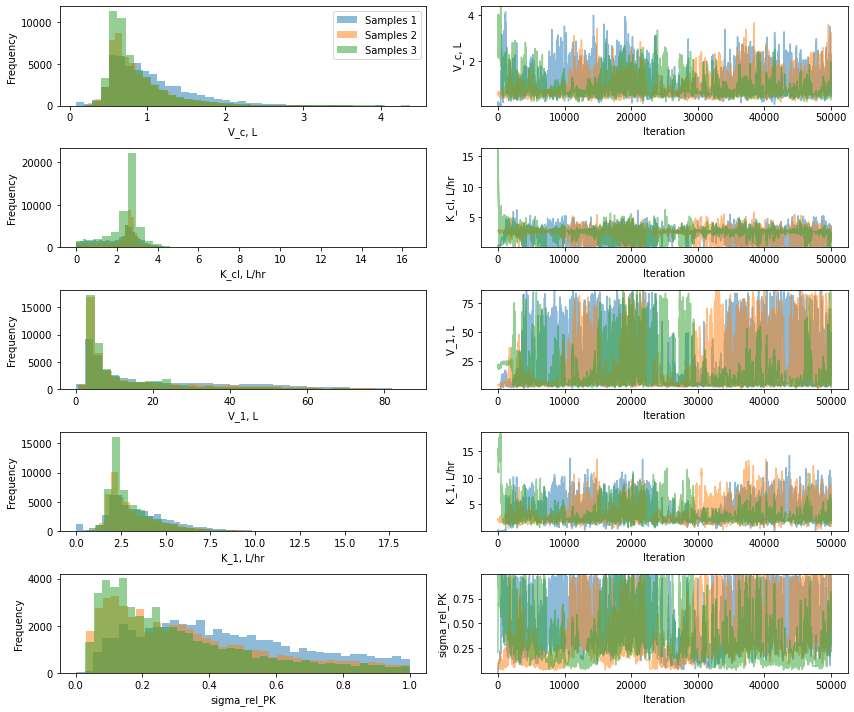

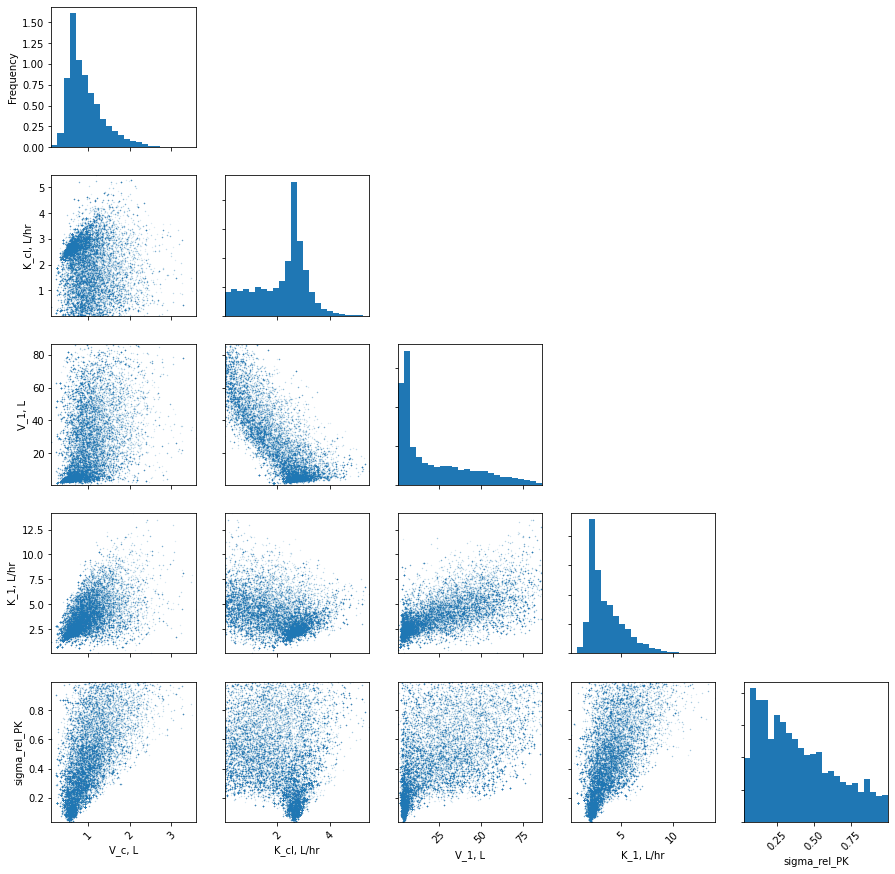

In [51]:
pints.plot.trace(samples, parameter_names=PK_param_names)
plt.show()
pints.plot.pairwise(np.vstack(samples[:,-num_samples:]), parameter_names=PK_param_names)
plt.show()

### PK: Real Data

In [52]:
df = pandas.read_csv("../Data_and_parameters/PK_real/data_refined_Docetaxel.csv")
df = df.sort_values(['DOSE', 'TIME'], ascending=True)
df = df.loc[(df['DOSE'] == dose)].reset_index()

unit = "ng/mL"
df_OBS = df[['TIME', 'DOSE', 'OBS']]
df_OBS = df_OBS.astype({'OBS': 'float64'})
df_OBS['OBS'] = df_OBS["OBS"]/1000  # Converting from ng/ml to mg/l
print(df_OBS)

# Get actual dose amount
dose_amount = df.astype({'AMT': 'float64'}).mean()['AMT']
dose_amount = dose_amount
print("Average dose amount = " + str(dose_amount))

    TIME  DOSE       OBS
0  0.083  10.0  1.580788
1  0.333  10.0  0.298965
2  2.500  10.0  0.044781
3  4.666  10.0  0.026286
4  4.833  10.0  0.028652
5  5.000  10.0  0.019924
Average dose amount = 1.9767777777777773


In [53]:
# Before starting the optimisation we should estimate the parameter Vol_C. We can do this by drawing a line 
# through the first 2 point and seeing where it crosses the y-axis
point_1 = (df_OBS['TIME'][0], df_OBS['OBS'][0])
point_2 = (df_OBS['TIME'][1], df_OBS['OBS'][1])
y_0 = point_1[1] - (point_1[1] - point_2[1])/(point_1[0] - point_2[0]) * point_1[0]
Vol_C_approx = dose_amount/y_0
print("Aproximate Vol_C:", Vol_C_approx)

Aproximate Vol_C: 0.9852588790714991


In [55]:
PK_model = Pints_PK_model(dose=dose_amount, num_comp=num_comp)
problem = pints.SingleOutputProblem(PK_model, df_OBS['TIME'], df_OBS['OBS'])
PK_param_names = ["V_c, L", "K_cl, L/hr", "V_1, L", "K_1, L/hr", "sigma_rel_PK"]

log_likelihood = MultiplicativeGaussianLogLikelihood(problem, fix_eta=1)
opt_params = np.load('../Data_and_parameters/PK_real/opt_'+str(drug)+'_'+str(dose)+'.npy')


lower_bound = [0.1*Vol_C_approx, 0.01, 0.01*Vol_C_approx, 0.01, 0.0001]
upper_bound = [10*Vol_C_approx, 100, 100*Vol_C_approx, 100, 1]

start_points = [np.exp((np.log(lower_bound)+np.log(opt_params))*0.5), opt_params, np.exp((np.log(upper_bound)+np.log(opt_params))*0.5)]
print(np.asarray(start_points))

[array([0.25968969, 0.16788891, 0.21913911, 0.15076117, 0.00302295]), array([0.68447729, 2.81866869, 4.87404363, 2.27289304, 0.09138236]), array([ 2.59689686, 16.78889125, 21.91391057, 15.076117  ,  0.30229515])]


In [56]:
log_prior = pints.UniformLogPrior(lower_bound, upper_bound)
# log_posterior = pints.LogPosterior(log_likelihood, log_prior)

num_iterations = len(opt_params)*10000  # 10000 iterations per parameter
num_samples = len(opt_params)*3000 # 3000 final samples per parameter

samples = MCMC_run(log_likelihood, log_prior, start_points, num_iterations, num_samples)
# mcmc = pints.MCMCController(log_posterior, 3, startpoints, method=pints.HaarioBardenetACMC)
# mcmc.set_max_iterations(num_iterations)
# mcmc.set_log_to_screen(True)
# samples = mcmc.run()

0 	 0 	 0 	 0 


/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/Likelihoods.py:117: RuntimeWarning:

invalid value encountered in log



100 	 0.4158 	 0.6337 	 0.505 
200 	 0.403 	 0.6169 	 0.4826 
300 	 0.3821 	 0.5116 	 0.4618 


/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/venv/lib/python3.8/site-packages/scipy/integrate/odepack.py:247: ODEintWarning:

Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.



400 	 0.3242 	 0.4289 	 0.4065 
500 	 0.2914 	 0.3752 	 0.3553 
600 	 0.2779 	 0.3478 	 0.3195 
700 	 0.2668 	 0.321 	 0.3039 
800 	 0.2572 	 0.3021 	 0.2934 
900 	 0.2375 	 0.293 	 0.2775 
1000 	 0.2348 	 0.2917 	 0.2647 
1100 	 0.2307 	 0.2797 	 0.2598 
1200 	 0.2306 	 0.2631 	 0.2548 
1300 	 0.2329 	 0.2552 	 0.2513 
1400 	 0.2327 	 0.2541 	 0.247 
1500 	 0.2365 	 0.2538 	 0.2345 
1600 	 0.2349 	 0.2492 	 0.2286 
1700 	 0.2363 	 0.2481 	 0.2299 
1800 	 0.231 	 0.2482 	 0.2277 
1900 	 0.2309 	 0.2467 	 0.2299 
2000 	 0.2289 	 0.2444 	 0.2264 
2100 	 0.227 	 0.2408 	 0.2208 
2200 	 0.2249 	 0.2376 	 0.214 
2300 	 0.2251 	 0.2382 	 0.2125 
2400 	 0.2178 	 0.232 	 0.2078 
2500 	 0.2215 	 0.2283 	 0.2107 
2600 	 0.2207 	 0.2207 	 0.2153 
2700 	 0.2173 	 0.2218 	 0.2099 
2800 	 0.2171 	 0.2238 	 0.2178 
2900 	 0.2213 	 0.2265 	 0.222 
3000 	 0.2223 	 0.2303 	 0.2226 
3100 	 0.2219 	 0.2306 	 0.2264 
3200 	 0.2187 	 0.2327 	 0.2221 
3300 	 0.2151 	 0.233 	 0.2287 
3400 	 0.2138 	 0.2326 	 

In [ ]:
# log_prior = pints.UniformLogPrior(lower_bound, upper_bound)
# log_posterior = pints.LogPosterior(log_likelihood, log_prior)

# startpoints = [opt_params, opt_params*0.5, opt_params*1.5]
# num_iterations = len(lower_bound)*3000  # 3000 iterations per parameter

# mcmc = pints.MCMCController(log_posterior, 3, startpoints, method=pints.HaarioBardenetACMC)
# mcmc.set_max_iterations(num_iterations)
# mcmc.set_log_to_screen(True)
# samples = mcmc.run()

In [58]:
samples = np.asarray(samples)
print(num_samples, num_iterations, samples.shape)
print(pints.MCMCSummary(samples[:,-num_samples:], parameter_names=PK_param_names))

15000 50000 (3, 19016, 5)
param         mean    std.    2.5%    25%    50%    75%    97.5%    rhat    ess
------------  ------  ------  ------  -----  -----  -----  -------  ------  ------
V_c, L        1.16    0.48    0.51    0.82   1.06   1.40   2.31     1.01    516.04
K_cl, L/hr    1.98    1.11    0.11    1.05   2.06   2.78   4.12     1.01    679.11
V_1, L        29.86   22.09   3.44    10.34  25.08  45.12  80.57    1.01    412.60
K_1, L/hr     4.24    1.83    1.65    2.87   3.94   5.30   8.68     1.00    620.29
sigma_rel_PK  0.45    0.21    0.14    0.29   0.41   0.59   0.93     1.01    400.89


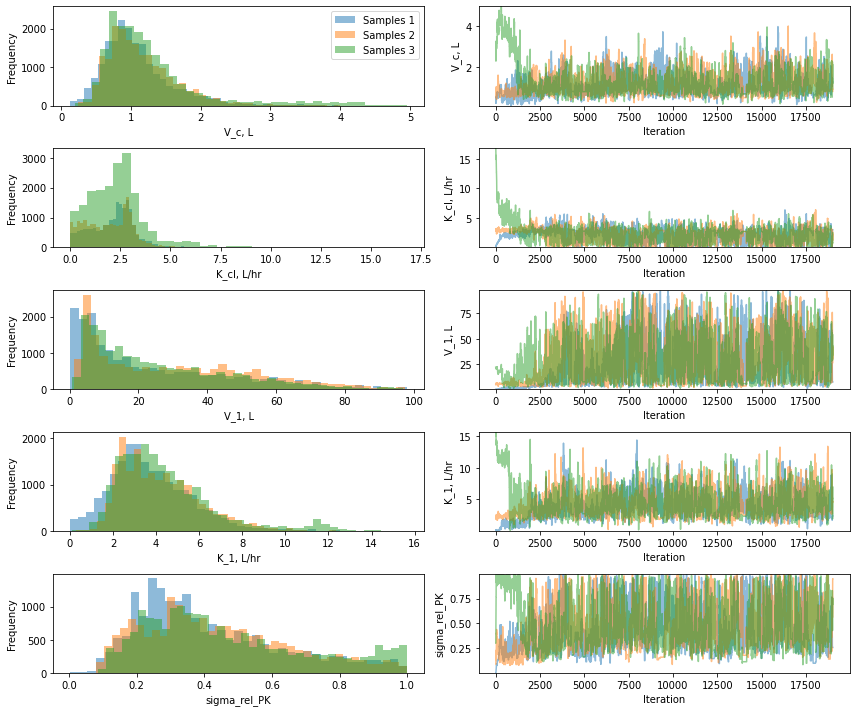

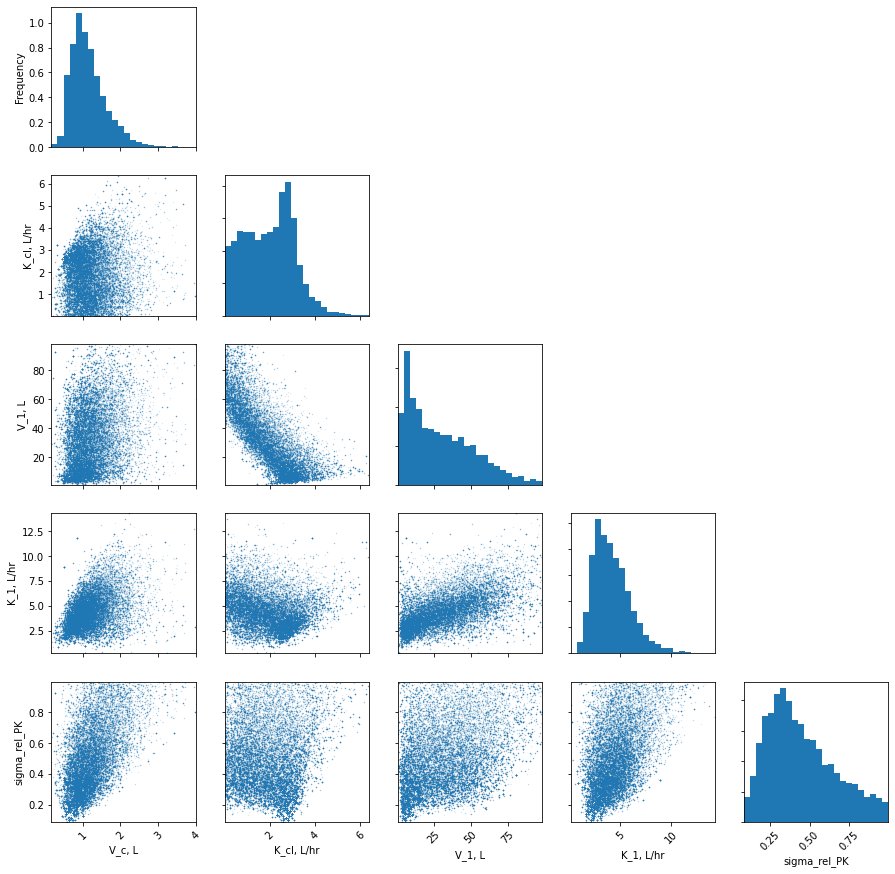

In [59]:
pints.plot.trace(samples, parameter_names=PK_param_names)
plt.show()
pints.plot.pairwise(np.vstack(samples[:,-num_samples:]), parameter_names=PK_param_names)
plt.show()

### PD - Simulated Data

In [4]:
PD_actual_params = np.load("../Data_and_parameters/PD_sim/actual_params_dose_2.npy")
PD_param_names = ["C_cell_0", "MTT", "gamma", "s", "sigma_base", "eta", "sigma_rel"]
print("Parameters used for simulated data:")
for i in range(0,len(PD_param_names)):
    print(PD_param_names[i] + " = " + str(PD_actual_params[i]))

Parameters used for simulated data:
C_cell_0 = 983.1
MTT = 85.26
gamma = 0.44
s = 20.0
sigma_base = 42.43
eta = 1.0
sigma_rel = 0.13


In [5]:
PK_params=np.load("../Data_and_parameters/PK_sim/actual_params_dose_2.npy")[:-1]

dose_amount = 2.0
df = pandas.read_csv("../Data_and_parameters/PD_sim/sythesised_data_real_timepoints.csv")
start_time = df['TIME'].min()
PD_model = Pints_PD_model(PK_params, dose_amount, start_time=start_time)
problem = pints.SingleOutputProblem(PD_model, df['TIME'].to_numpy()-start_time, df['OBS'].to_numpy())

print(df)

df_before_0 = df[df["TIME"] < 0]
times_before_dose = len(df_before_0["OBS"])
R_0_approx = np.mean(df_before_0["OBS"])
print("approximate R_0: ", R_0_approx)

     TIME          OBS
0   -48.0   855.328230
1    24.0  1026.264581
2    48.0   871.865095
3    72.0   660.206610
4    96.0   581.442512
5   120.0   475.124656
6   144.0   796.647858
7   168.0   513.728347
8   192.0   997.665363
9   216.0   959.121053
10  240.0  1402.868099
11  264.0  1472.195855
12  288.0  1873.293319
13  312.0  1357.996620
14  336.0  1523.421688
15  360.0   785.629870
16  384.0   855.026692
17  432.0   870.378293
18  480.0   692.746295
19  552.0   945.146789
approximate Circ_0:  855.328230384973


In [6]:
opt_df = pandas.read_csv("../Data_and_parameters/PD_sim/opt_results.csv")
opt_add = np.asarray(opt_df['Constant Noise'][1:6])
opt_mult = np.concatenate((
    np.asarray(opt_df['Relative Noise'][1:5]),
    np.asarray(opt_df['Relative Noise'][6:-1])
)) 
opt_mult_noeta = np.concatenate((
    np.asarray(opt_df['Relative Noise.1'][1:5]),
    np.asarray(opt_df['Relative Noise.1'][7:-1])
))
opt_comb = np.asarray(opt_df['Combined Noise'][1:-1])
opt_comb_noeta = np.concatenate((
    np.asarray(opt_df['Combined Noise.1'][1:6]),
    np.asarray(opt_df['Combined Noise.1'][7:-1])
))

lower_bound = [0.1*R_0_approx, df['TIME'].max()*0.001, 0.005, 0.01,     0.001,      0.001, 0.001]
upper_bound = [10*R_0_approx,      df['TIME'].max(),     5,    100,   R_0_approx,   10,    0.9]

opt_df

,Unnamed: 0,Parameter,Constant Noise,Relative Noise,Relative Noise.1,Combined Noise,Combined Noise.1,Actual
0,NaN,NaN,NaN,Inferred Eta,Fixed Eta,Inferred Eta,Fixed Eta,Parameters
1,0.0,C_cell_0,975.811985,1000.2446053644796,969.9368417050653,967.9164190565756,968.5105415294565,983.1
2,1.0,MTT,552.000000,24.474175220883595,80.46322502823784,80.50017091539418,80.6146185630562,85.26
3,2.0,gamma,0.005000,1.0678332067572156,0.43373634923839144,0.43337261276858063,0.4356757806663113,0.44
4,3.0,s,0.010000,0.01000000000003233,23.05962470095194,24.676329686612924,24.785169316677703,20.0
5,4.0,sigma_base,360.777576,NaN,NaN,92.95909333203048,71.5946342800862,42.43
6,5.0,eta,NaN,1.8540126128789505,NaN,1.5833303067488664,NaN,1.0
7,6.0,sigma_rel,NaN,0.0010000000001915833,0.1631195690819837,0.0010000000000487134,0.07974707391073427,0.13
8,7.0,likelihood,128.684171,145.67904646243116,128.74357680847893,128.15379952343483,128.21980707570842,NaN


Constant

In [82]:
log_likelihood = GaussianLogLikelihood(problem)
log_prior = pints.UniformLogPrior(lower_bound[:5], upper_bound[:5])
start_points = [np.exp((np.log(lower_bound[:5])+np.log(opt_add))*0.5), opt_add, np.exp((np.log(upper_bound[:5])+np.log(opt_add))*0.5)]

In [100]:
num_iterations = len(opt_add)*10000  # 10000 iterations per parameter
num_samples = len(opt_add)*3000 # 3000 final samples per parameter

samples = MCMC_run(
    log_likelihood, 
    log_prior, 
    start_points, 
    num_iterations, 
    num_samples, 
    save_point_like='../Data_and_parameters/PD_sim/MCMC_add_pointloglike_chain'
)

iter 	 chain 0 	 chain 1 	 chain 2 	 R_hat 		 Time
1 	 0.0     	 0.0     	 0.0     	 nan     	 0.37 seconds
20 	 0.25     	 0.65     	 0.75     	 nan     	 6.15 seconds
40 	 0.25     	 0.525     	 0.825     	 nan     	 11.97 seconds
60 	 0.35     	 0.6667     	 0.7167     	 nan     	 17.21 seconds
80 	 0.4     	 0.725     	 0.7     	 nan     	 23.03 seconds
100 	 0.42     	 0.78     	 0.69     	 nan     	 31.22 seconds
120 	 0.425     	 0.8167     	 0.6833     	 nan     	 37.51 seconds
140 	 0.45     	 0.8357     	 0.7143     	 nan     	 44.15 seconds
150 	 0.44     	 0.8333     	 0.7067     	 nan     	 48.53 seconds
160 	 0.4562     	 0.8313     	 0.7063     	 nan     	 52.13 seconds
180 	 0.4333     	 0.8333     	 0.7278     	 nan     	 57.92 seconds
200 	 0.425     	 0.82     	 0.75     	 nan     	 1 minute, 4 seconds
........................
End of Initial Phase
........................
300 	 0.35     	 0.6467     	 0.6133     	 nan     	 1 minute, 44 seconds
450 	 0.2422     	 0.4

13500 	 0.2001     	 0.2359     	 0.2359     	 nan     	 2 hours, 49 minutes, 50 seconds
13650 	 0.1979     	 0.2356     	 0.2354     	 nan     	 2 hours, 51 minutes, 14 seconds
13800 	 0.1964     	 0.2362     	 0.2357     	 nan     	 2 hours, 52 minutes, 40 seconds
13950 	 0.1956     	 0.236     	 0.236     	 nan     	 2 hours, 54 minutes, 5 seconds
14100 	 0.1957     	 0.2362     	 0.2366     	 nan     	 2 hours, 55 minutes, 31 seconds
14250 	 0.1951     	 0.2368     	 0.2361     	 nan     	 2 hours, 56 minutes, 55 seconds
14400 	 0.1943     	 0.2368     	 0.2367     	 nan     	 2 hours, 58 minutes, 22 seconds
14550 	 0.1935     	 0.2364     	 0.2367     	 nan     	 2 hours, 59 minutes, 48 seconds
14700 	 0.193     	 0.2363     	 0.2363     	 nan     	 3 hours, 1 minute, 13 seconds
14850 	 0.1916     	 0.2364     	 0.2371     	 nan     	 3 hours, 2 minutes, 38 seconds
15000 	 0.1901     	 0.2366     	 0.2375     	 nan     	 3 hours, 4 minutes, 3 seconds
15150 	 0.1888     	 0.2373   

27000 	 0.141     	 0.2338     	 0.2344     	 4.7829     	 5 hours, 33 minutes, 8 seconds
27150 	 0.1407     	 0.2338     	 0.2343     	 4.8005     	 5 hours, 35 minutes, 4 seconds
27300 	 0.1407     	 0.2339     	 0.2342     	 4.8029     	 5 hours, 37 minutes, 2 seconds
27450 	 0.1403     	 0.2344     	 0.234     	 4.8152     	 5 hours, 39 minutes, 3 seconds
27600 	 0.1401     	 0.2348     	 0.2343     	 4.8201     	 5 hours, 41 minutes, 4 seconds
27750 	 0.1399     	 0.2351     	 0.234     	 4.8285     	 5 hours, 43 minutes, 3 seconds
27900 	 0.1396     	 0.2354     	 0.2339     	 4.8195     	 5 hours, 45 minutes, 4 seconds
28050 	 0.1393     	 0.235     	 0.2341     	 4.8404     	 5 hours, 47 minutes, 4 seconds
28200 	 0.1395     	 0.2353     	 0.2338     	 4.8414     	 5 hours, 49 minutes, 5 seconds
28350 	 0.1395     	 0.2353     	 0.234     	 4.8399     	 5 hours, 51 minutes, 5 seconds
28500 	 0.1396     	 0.2356     	 0.2341     	 4.8408     	 5 hours, 53 minutes, 6 seconds
2865

40500 	 0.1232     	 0.2338     	 0.2346     	 4.7268     	 8 hours, 42 minutes, 26 seconds
40650 	 0.123     	 0.2335     	 0.2347     	 4.7346     	 8 hours, 44 minutes, 42 seconds
40800 	 0.1228     	 0.2334     	 0.2347     	 4.7407     	 8 hours, 46 minutes, 59 seconds
40950 	 0.1224     	 0.2335     	 0.235     	 4.738     	 8 hours, 49 minutes, 16 seconds
41100 	 0.122     	 0.2335     	 0.2351     	 4.7442     	 8 hours, 51 minutes, 28 seconds
41250 	 0.1219     	 0.2336     	 0.235     	 4.7321     	 8 hours, 53 minutes, 43 seconds
41400 	 0.122     	 0.2336     	 0.235     	 4.7381     	 8 hours, 56 minutes, 3 seconds
41550 	 0.1218     	 0.2336     	 0.2349     	 4.7353     	 8 hours, 58 minutes, 18 seconds
41700 	 0.1215     	 0.2335     	 0.2349     	 4.7367     	 9 hours, 0 minutes, 31 seconds
41850 	 0.1214     	 0.2336     	 0.2349     	 4.7354     	 9 hours, 2 minutes, 48 seconds
42000 	 0.1212     	 0.2335     	 0.2348     	 4.7555     	 9 hours, 5 minutes, 3 seconds


In [101]:
for chain, sample_chain in enumerate(samples):
    pints.io.save_samples('../Data_and_parameters/PD_sim/MCMC_add_samples_chain'+"_"+str(chain), sample_chain)

samples = np.asarray(pints.io.load_samples('../Data_and_parameters/PD_sim/MCMC_add_samples_chain', n=3))

In [102]:
df_summary = pandas.DataFrame(
    pints.MCMCSummary(samples[:,-num_samples:], parameter_names=PD_param_names[:5]).summary(), 
    columns = [
        'parameter',
        'mean',
        'std deviation',
        '2.5% quantile',
        '25% quantile',
        '50% quantile', 
        '75% quantile', 
        '97.5% quantile', 
        'rhat', 
        'ess',
    ]
)

df_summary = df_summary.round(decimals=4)
df_summary = pandas.DataFrame(np.insert(df_summary.values, 5, values=[PD_param_names[6]] + ['.']*9, axis=0), columns = df_summary.columns)
df_summary['actual value'] = np.concatenate((PD_actual_params[:5],PD_actual_params[6:]))

In [103]:
fig =  ff.create_table(df_summary)
fig.update_layout(
    width=1000,
    height=200,
)
fig.show()

df_summary_reduced = df_summary.drop(columns=[
    '2.5% quantile',
    '25% quantile',
    '50% quantile', 
    '75% quantile', 
    '97.5% quantile', 
    'actual value'
])

fig =  ff.create_table(df_summary_reduced)
fig.update_layout(
    width=500*5/6.0,
    height=200,
)
fig.write_image(image_file + "sim_MCMC_add_table.svg")

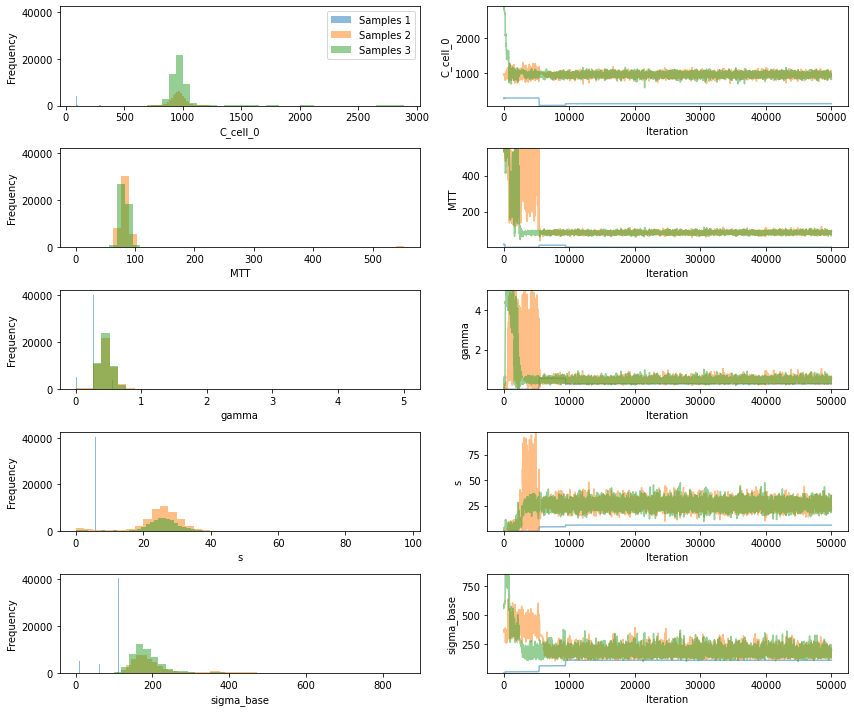

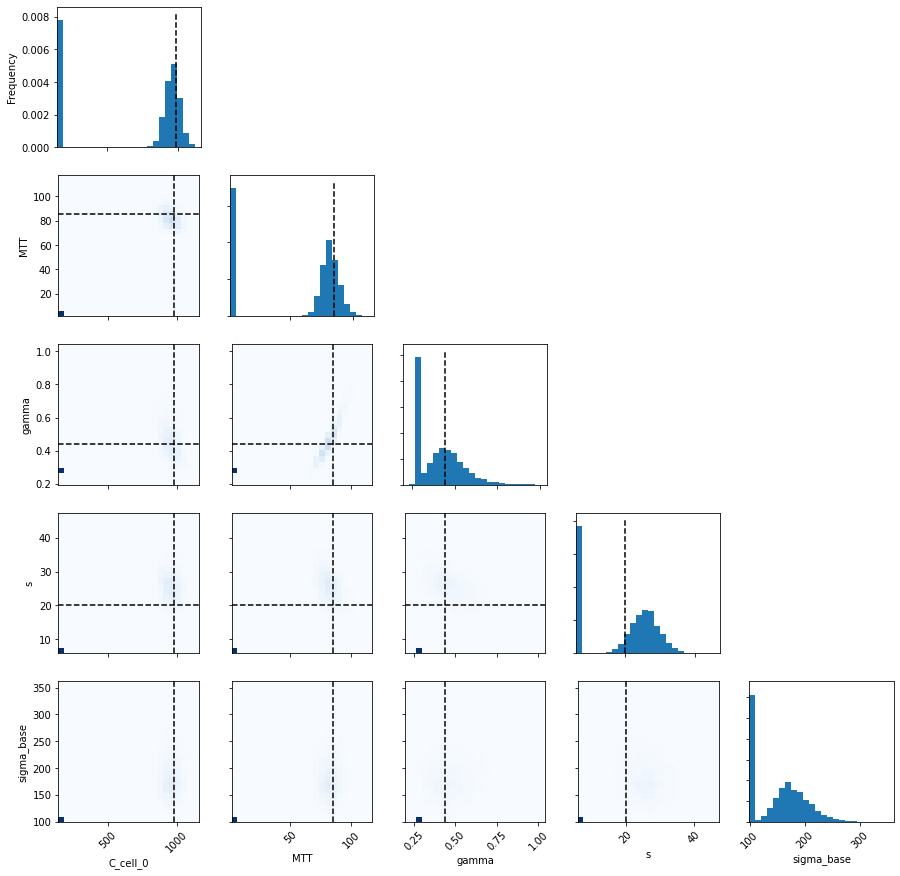

In [108]:
pints.plot.trace(samples, parameter_names=PD_param_names[:5])
# plt.savefig(image_file + "sim_MCMC_add_trace.svg")
plt.show()
pints.plot.pairwise(
    np.vstack(samples[:,-num_samples:]), 
    heatmap=True,
    ref_parameters=PD_actual_params[:5],
    parameter_names=PD_param_names[:5],
)
# plt.savefig(image_file + "sim_MCMC_add_pairs.svg")
plt.show()

/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/venv/lib/python3.8/site-packages/scipy/integrate/odepack.py:247: ODEintWarning:

Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.



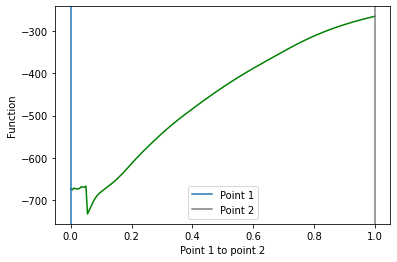

In [133]:
chain_1_mean = np.mean(samples[0,-num_samples:], axis=0)
chain_2_mean = np.mean(samples[1,-num_samples:], axis=0)

pints.plot.function_between_points(log_likelihood, chain_1_mean, (50*chain_1_mean+50*chain_2_mean)/100, padding=0, evaluations=200)
plt.show()

Relative with no eta

In [16]:
log_likelihood =  MultiplicativeGaussianLogLikelihood(problem, fix_eta=1.0)
mult_lb = np.asarray(lower_bound[:4]+lower_bound[6:])
mult_ub = np.asarray(upper_bound[:4]+upper_bound[6:])
log_prior = pints.UniformLogPrior(mult_lb, mult_ub)
opt_mult_noeta = opt_mult_noeta.astype(float)
point_1 = 0.5*opt_mult_noeta
if any(point_1 <= mult_lb):
    for point_index in range(len(point_1)):
        point_1[point_index] = max(point_1[point_index], 1.0001*mult_lb[point_index])
point_3 = 1.5*opt_mult_noeta
if any(point_3 >= mult_ub):
    for point_index in range(len(point_3)):
        point_3[point_index] = min(point_3[point_index], 0.9999*mult_ub[point_index])
start_points = [point_1, opt_mult_noeta, point_3]

In [17]:
num_iterations = len(opt_mult_noeta)*10000  # 10000 iterations per parameter
num_samples = len(opt_mult_noeta)*3000 # 3000 final samples per parameter

samples = MCMC_run(
    log_likelihood, 
    log_prior, 
    start_points, 
    num_iterations, 
    num_samples, 
    save_point_like='../Data_and_parameters/PD_sim/MCMC_mult_noeta_pointloglike_chain'
)

iter 	 chain 0 	 chain 1 	 chain 2 	 R_hat 		 Time
1 	 0.0     	 0.0     	 0.0     	 nan     	 0.42 seconds
20 	 0.35     	 0.2     	 0.7     	 nan     	 7.25 seconds
40 	 0.4     	 0.35     	 0.7     	 nan     	 14.24 seconds
60 	 0.35     	 0.35     	 0.7     	 nan     	 20.91 seconds
80 	 0.3375     	 0.3125     	 0.7     	 nan     	 27.54 seconds
100 	 0.42     	 0.31     	 0.71     	 nan     	 34.09 seconds
120 	 0.475     	 0.3     	 0.7083     	 nan     	 40.59 seconds
140 	 0.4786     	 0.3     	 0.7     	 nan     	 47.14 seconds
150 	 0.4733     	 0.3067     	 0.68     	 nan     	 50.4 seconds
160 	 0.5     	 0.3125     	 0.6813     	 nan     	 53.68 seconds
180 	 0.4778     	 0.3167     	 0.7056     	 nan     	 1 minute, 0 seconds
200 	 0.47     	 0.33     	 0.69     	 nan     	 1 minute, 7 seconds
...........................
End of Initial Phase
...........................
300 	 0.4467     	 0.3367     	 0.5633     	 nan     	 1 minute, 39 seconds


/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/Likelihoods.py:117: RuntimeWarning: invalid value encountered in log
  np.log(noise_term) -


450 	 0.3756     	 0.2867     	 0.4244     	 nan     	 2 minutes, 24 seconds


/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/venv/lib/python3.8/site-packages/scipy/integrate/odepack.py:247: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)


600 	 0.325     	 0.2617     	 0.3517     	 nan     	 3 minutes, 11 seconds
750 	 0.292     	 0.2387     	 0.32     	 nan     	 4 minutes, 3 seconds


/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/PD_model.py:40: RuntimeWarning: invalid value encountered in power
  feedback = np.power(


900 	 0.2633     	 0.23     	 0.3     	 nan     	 4 minutes, 51 seconds
1050 	 0.2562     	 0.2257     	 0.2743     	 nan     	 5 minutes, 40 seconds
1200 	 0.25     	 0.215     	 0.2533     	 nan     	 6 minutes, 30 seconds
1350 	 0.2504     	 0.2163     	 0.2578     	 nan     	 7 minutes, 18 seconds
1500 	 0.2307     	 0.2127     	 0.2413     	 nan     	 8 minutes, 13 seconds
1650 	 0.2206     	 0.2103     	 0.237     	 nan     	 9 minutes, 6 seconds
1800 	 0.2156     	 0.215     	 0.2394     	 nan     	 9 minutes, 56 seconds
1950 	 0.2215     	 0.2133     	 0.241     	 nan     	 10 minutes, 48 seconds
2100 	 0.2176     	 0.2148     	 0.2467     	 nan     	 11 minutes, 39 seconds
2250 	 0.2222     	 0.2156     	 0.2436     	 nan     	 12 minutes, 30 seconds
2400 	 0.2246     	 0.2192     	 0.2433     	 nan     	 13 minutes, 22 seconds
2550 	 0.222     	 0.2176     	 0.2435     	 nan     	 14 minutes, 11 seconds
2700 	 0.2204     	 0.2152     	 0.2374     	 nan     	 14 minutes, 57 se

/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/Likelihoods.py:118: RuntimeWarning: overflow encountered in square
  error**2 / (2 * noise_term**2)
/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/Likelihoods.py:118: RuntimeWarning: invalid value encountered in true_divide
  error**2 / (2 * noise_term**2)


6600 	 0.2371     	 0.2208     	 0.2032     	 nan     	 36 minutes, 48 seconds
6750 	 0.2364     	 0.2222     	 0.2007     	 nan     	 38 minutes, 0 seconds
6900 	 0.2367     	 0.223     	 0.1983     	 nan     	 39 minutes, 2 seconds
7050 	 0.238     	 0.2238     	 0.197     	 nan     	 40 minutes, 3 seconds
7200 	 0.2381     	 0.2239     	 0.195     	 nan     	 41 minutes, 0 seconds
7350 	 0.2384     	 0.2253     	 0.1927     	 nan     	 41 minutes, 55 seconds
7500 	 0.2385     	 0.2251     	 0.1929     	 nan     	 42 minutes, 48 seconds
7650 	 0.2363     	 0.2246     	 0.1923     	 nan     	 43 minutes, 42 seconds
7800 	 0.2351     	 0.2251     	 0.1917     	 nan     	 44 minutes, 37 seconds
7950 	 0.2341     	 0.2245     	 0.1931     	 nan     	 45 minutes, 30 seconds
8100 	 0.2342     	 0.2237     	 0.1958     	 nan     	 46 minutes, 22 seconds
8250 	 0.2345     	 0.223     	 0.1981     	 nan     	 47 minutes, 14 seconds
8400 	 0.2338     	 0.2235     	 0.1985     	 nan     	 48 mi

20850 	 0.2348     	 0.227     	 0.1867     	 2.9897     	 1 hour, 59 minutes, 43 seconds
21000 	 0.2348     	 0.2268     	 0.1862     	 2.9891     	 2 hours, 0 minutes, 36 seconds
21150 	 0.2345     	 0.2266     	 0.1859     	 2.9881     	 2 hours, 1 minute, 28 seconds
21300 	 0.2346     	 0.2273     	 0.1853     	 2.9971     	 2 hours, 2 minutes, 20 seconds
21450 	 0.2348     	 0.2272     	 0.1848     	 3.027     	 2 hours, 3 minutes, 13 seconds
21600 	 0.2348     	 0.228     	 0.184     	 3.015     	 2 hours, 4 minutes, 6 seconds
21750 	 0.2344     	 0.2279     	 0.184     	 3.0058     	 2 hours, 4 minutes, 59 seconds
21900 	 0.2342     	 0.2275     	 0.1839     	 2.9895     	 2 hours, 5 minutes, 51 seconds
22050 	 0.2338     	 0.228     	 0.1839     	 2.969     	 2 hours, 6 minutes, 43 seconds
22200 	 0.2341     	 0.2281     	 0.1847     	 2.9572     	 2 hours, 7 minutes, 36 seconds
22350 	 0.2344     	 0.2277     	 0.1848     	 2.9535     	 2 hours, 8 minutes, 29 seconds
22500 	 0

34350 	 0.2332     	 0.2302     	 0.2061     	 4.3314     	 3 hours, 19 minutes, 47 seconds
34500 	 0.233     	 0.2297     	 0.2059     	 4.3295     	 3 hours, 20 minutes, 41 seconds
34650 	 0.2323     	 0.2296     	 0.2061     	 4.3434     	 3 hours, 21 minutes, 36 seconds
34800 	 0.2321     	 0.2298     	 0.2061     	 4.3453     	 3 hours, 22 minutes, 31 seconds
34950 	 0.2323     	 0.23     	 0.2057     	 4.3297     	 3 hours, 23 minutes, 25 seconds
35100 	 0.2328     	 0.2296     	 0.2057     	 4.332     	 3 hours, 24 minutes, 19 seconds
35250 	 0.2328     	 0.2293     	 0.2056     	 4.336     	 3 hours, 25 minutes, 13 seconds
35400 	 0.2325     	 0.2293     	 0.2053     	 4.3378     	 3 hours, 26 minutes, 8 seconds
35550 	 0.2324     	 0.2292     	 0.2054     	 4.3484     	 3 hours, 27 minutes, 3 seconds
35700 	 0.2325     	 0.229     	 0.2053     	 4.371     	 3 hours, 27 minutes, 58 seconds
35850 	 0.2322     	 0.2288     	 0.2054     	 4.4041     	 3 hours, 28 minutes, 52 secon

47850 	 0.2335     	 0.23     	 0.1962     	 4.4792     	 4 hours, 43 minutes, 19 seconds
48000 	 0.2335     	 0.2301     	 0.1964     	 4.4593     	 4 hours, 44 minutes, 16 seconds
48150 	 0.2334     	 0.2301     	 0.1965     	 4.4394     	 4 hours, 45 minutes, 14 seconds
48300 	 0.2335     	 0.2302     	 0.1967     	 4.4339     	 4 hours, 46 minutes, 10 seconds
48450 	 0.2334     	 0.23     	 0.1966     	 4.4342     	 4 hours, 47 minutes, 6 seconds
48600 	 0.2331     	 0.23     	 0.1963     	 4.4578     	 4 hours, 48 minutes, 3 seconds
48750 	 0.233     	 0.2301     	 0.1961     	 4.4551     	 4 hours, 49 minutes, 0 seconds
48900 	 0.2329     	 0.2303     	 0.1961     	 4.4467     	 4 hours, 49 minutes, 56 seconds
49050 	 0.233     	 0.2301     	 0.1961     	 4.4532     	 4 hours, 50 minutes, 52 seconds
49200 	 0.233     	 0.2301     	 0.196     	 4.4608     	 4 hours, 51 minutes, 48 seconds
49350 	 0.2329     	 0.2303     	 0.196     	 4.4548     	 4 hours, 52 minutes, 45 seconds
49

In [143]:
for chain, sample_chain in enumerate(samples):
    pints.io.save_samples('../Data_and_parameters/PD_sim/MCMC_mult_noeta_samples_chain'+"_"+str(chain), sample_chain)

samples = np.asarray(pints.io.load_samples('../Data_and_parameters/PD_sim/MCMC_mult_noeta_samples_chain', n=3))

In [144]:
df_summary = pandas.DataFrame(
    pints.MCMCSummary(samples[:,-num_samples:], parameter_names=PD_param_names[:4]+PD_param_names[5:]).summary(), 
    columns = [
        'parameter',
        'mean',
        'std deviation',
        '2.5% quantile',
        '25% quantile',
        '50% quantile', 
        '75% quantile', 
        '97.5% quantile', 
        'rhat', 
        'ess',
    ]
)

df_summary = df_summary.round(decimals=4)
df_summary = pandas.DataFrame(np.insert(df_summary.values, 4, values=[PD_param_names[4]] + ['.']*9, axis=0), columns = df_summary.columns)
df_summary['actual value'] = PD_actual_params # np.concatenate((PD_actual_params[:5],PD_actual_params[6:]))

In [145]:
fig =  ff.create_table(df_summary)
fig.update_layout(
    width=1000,
    height=200,
)
fig.show()

df_summary_reduced = df_summary.drop(columns=[
    '2.5% quantile',
    '25% quantile',
    '50% quantile', 
    '75% quantile', 
    '97.5% quantile', 
    'actual value'
])

fig =  ff.create_table(df_summary_reduced)
fig.update_layout(
    width=500*5/6.0,
    height=200,
)
fig.write_image(image_file + "sim_MCMC_mult_noeta_table.svg")

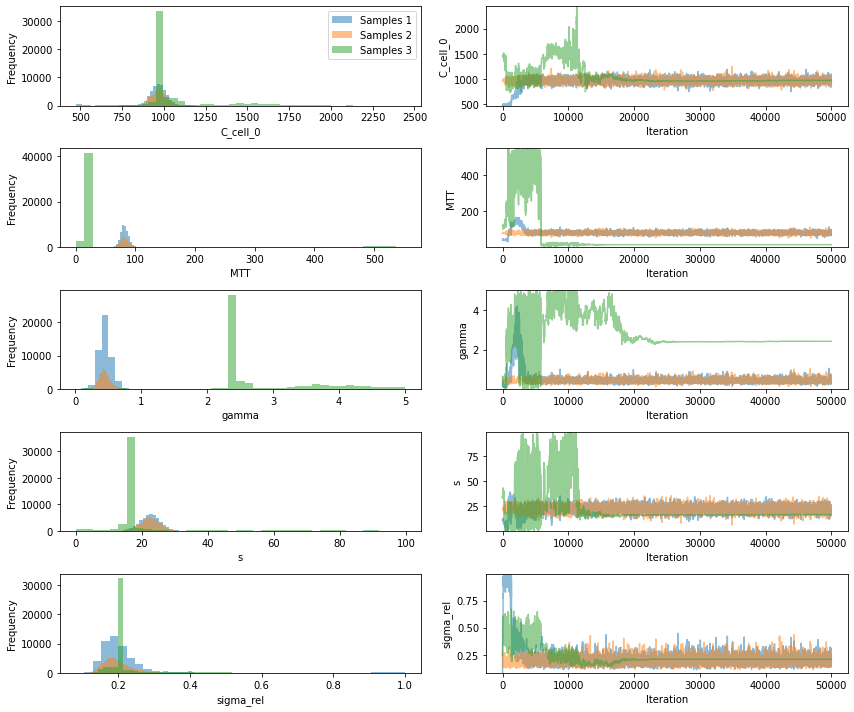

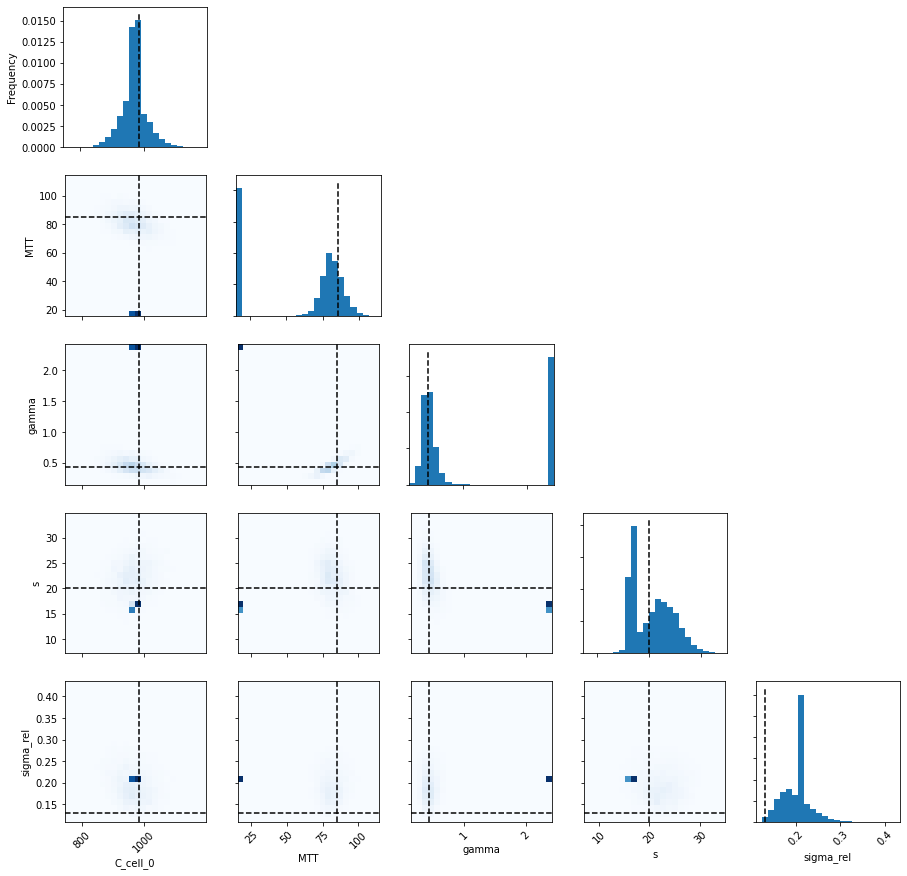

In [18]:
pints.plot.trace(np.asarray(samples), parameter_names=PD_param_names[:4]+PD_param_names[6:])
plt.savefig(image_file + "sim_MCMC_mult_noeta_trace.svg")
plt.show()
pints.plot.pairwise(
    np.vstack(np.asarray(samples)[:,-num_samples:]), 
    heatmap=True,
    ref_parameters=np.concatenate((PD_actual_params[:4],PD_actual_params[6:])),
    parameter_names=PD_param_names[:4]+PD_param_names[6:],
)
plt.savefig(image_file + "sim_MCMC_mult_noeta_pairs.svg")
plt.show()

/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/venv/lib/python3.8/site-packages/scipy/integrate/odepack.py:247: ODEintWarning:

Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.

/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/Likelihoods.py:114: RuntimeWarning:

invalid value encountered in power



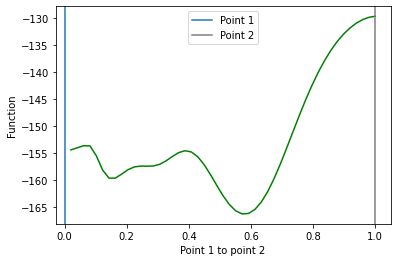

/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/venv/lib/python3.8/site-packages/scipy/integrate/odepack.py:247: ODEintWarning:

Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.



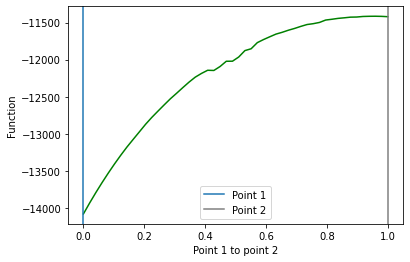

/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/venv/lib/python3.8/site-packages/scipy/integrate/odepack.py:247: ODEintWarning:

Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.



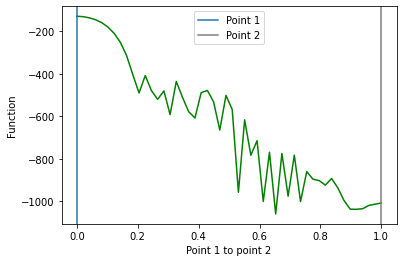

In [148]:
chain_1_mean = np.mean(samples[0,-num_samples:], axis=0)
chain_2_mean = np.mean(samples[1,-num_samples:], axis=0)
chain_3_mean = np.mean(samples[2,-num_samples:], axis=0)

# (50*chain_1_mean+50*chain_2_mean)/100

pints.plot.function_between_points(log_likelihood, chain_1_mean, chain_2_mean, padding=0, evaluations=50)
plt.show()
pints.plot.function_between_points(log_likelihood, chain_1_mean, chain_3_mean, padding=0, evaluations=50)
plt.show()
pints.plot.function_between_points(log_likelihood, chain_2_mean, chain_3_mean, padding=0, evaluations=50)
plt.show()

Combined Noise with eta

In [163]:
log_likelihood =  ConstantAndMultiplicativeGaussianLogLikelihood(problem)
# comb_lb = np.asarray(lower_bound[:4]+lower_bound[5:])
# comb_ub = np.asarray(upper_bound[:4]+upper_bound[5:])
log_prior = pints.UniformLogPrior(lower_bound, upper_bound)
opt_comb = opt_comb.astype(float)
start_points = [
    np.exp((np.log(lower_bound)+3*np.log(opt_comb))/4), 
    opt_comb, 
    np.exp((np.log(upper_bound)+3*np.log(opt_comb))/4)]
print(start_points)

[array([5.27729770e+02, 2.31650036e+01, 1.42032783e-01, 3.50114762e+00,
       5.32376540e+00, 2.51002845e-01, 1.00000000e-03]), array([9.67916419e+02, 8.05001709e+01, 4.33372613e-01, 2.46763297e+01,
       9.29590933e+01, 1.58333031e+00, 1.00000000e-03]), array([1.66882806e+03, 1.30266388e+02, 7.98709036e-01, 3.50114762e+01,
       1.61901962e+02, 2.51002845e+00, 5.62341325e-03])]


In [164]:
num_iterations = len(opt_mult)*5000  # 10000 iterations per parameter
num_samples = len(opt_mult)*3000 # 3000 final samples per parameter

samples = MCMC_run(
    log_likelihood, 
    log_prior, 
    start_points, 
    num_iterations, 
    num_samples, 
    save_point_like='../Data_and_parameters/PD_sim/MCMC_comb_pointloglike_chain'
)

iter 	 chain 0 	 chain 1 	 chain 2 	 R_hat 		 Time
1 	 0.0     	 0.0     	 0.0     	 nan     	 0.47 seconds


/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/Likelihoods.py:267: RuntimeWarning:

invalid value encountered in log



20 	 0.15     	 0.0     	 0.25     	 nan     	 7.73 seconds
40 	 0.3     	 0.025     	 0.15     	 nan     	 15.21 seconds
60 	 0.3333     	 0.0833     	 0.15     	 nan     	 23.25 seconds
80 	 0.3375     	 0.125     	 0.175     	 nan     	 31.71 seconds
100 	 0.35     	 0.14     	 0.16     	 nan     	 40.06 seconds
120 	 0.375     	 0.175     	 0.1583     	 nan     	 49.12 seconds


KeyboardInterrupt: 

In [157]:
for chain, sample_chain in enumerate(samples):
    pints.io.save_samples('../Data_and_parameters/PD_sim/MCMC_comb_samples_chain'+"_"+str(chain), sample_chain)

samples = np.asarray(pints.io.load_samples('../Data_and_parameters/PD_sim/MCMC_comb_samples_chain', n=3))

In [158]:
df_summary = pandas.DataFrame(
    pints.MCMCSummary(samples[:,-num_samples:], parameter_names=PD_param_names).summary(), 
    columns = [
        'parameter',
        'mean',
        'std deviation',
        '2.5% quantile',
        '25% quantile',
        '50% quantile', 
        '75% quantile', 
        '97.5% quantile', 
        'rhat', 
        'ess',
    ]
)

df_summary = df_summary.round(decimals=4)
df_summary['actual value'] = PD_actual_params # np.concatenate((PD_actual_params[:5],PD_actual_params[6:]))

In [159]:
fig =  ff.create_table(df_summary)
fig.update_layout(
    width=1000,
    height=200,
)
fig.show()

df_summary_reduced = df_summary.drop(columns=[
    '2.5% quantile',
    '25% quantile',
    '50% quantile', 
    '75% quantile', 
    '97.5% quantile', 
    'actual value'
])

fig =  ff.create_table(df_summary_reduced)
fig.update_layout(
    width=500*5/6.0,
    height=200,
)
fig.write_image(image_file + "sim_MCMC_comb_table.svg")

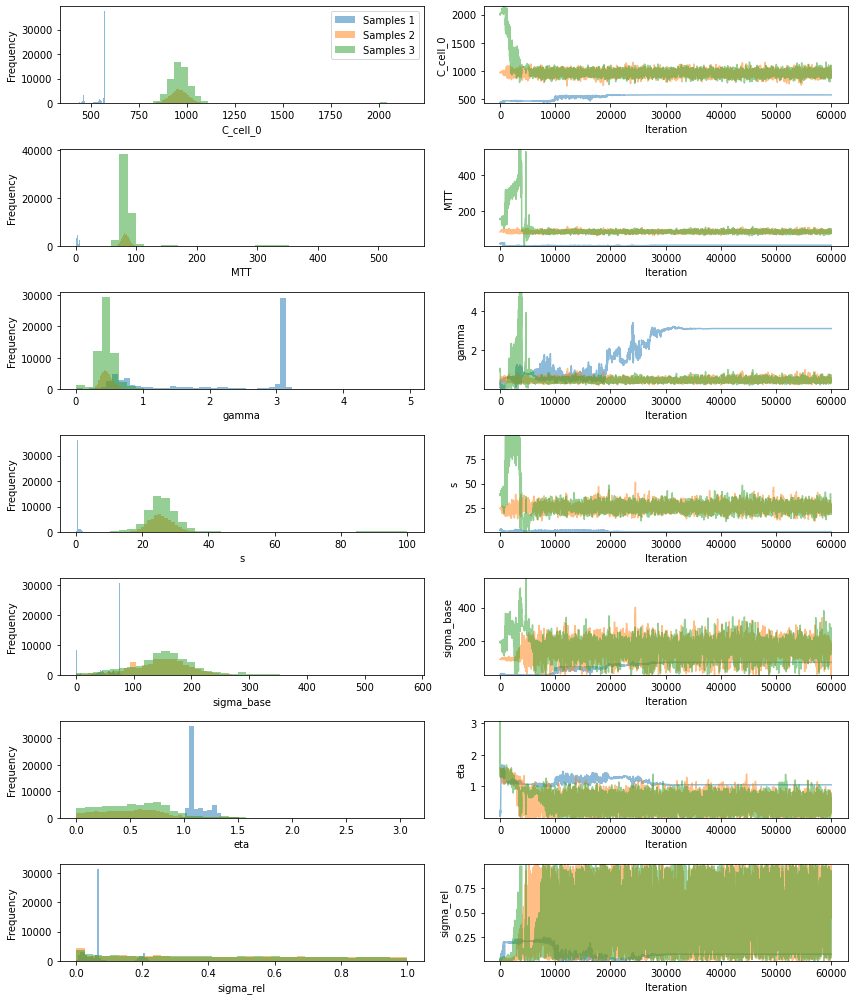

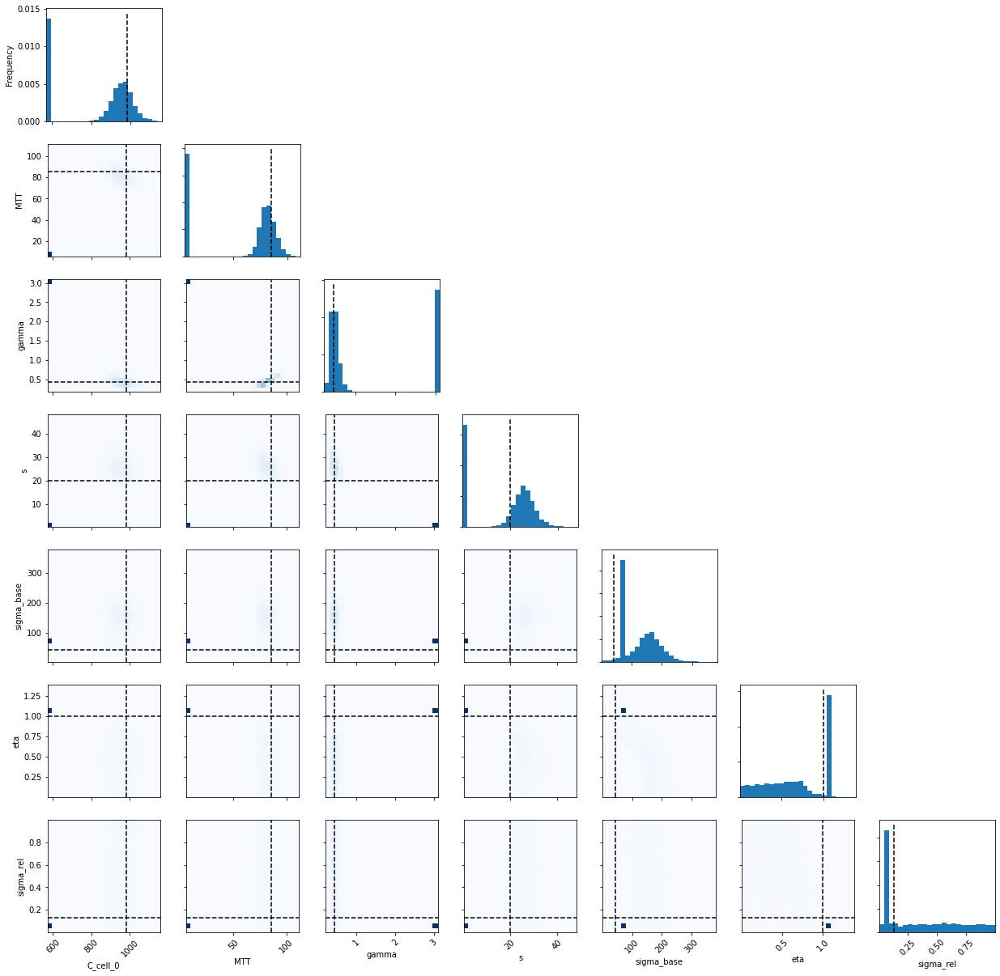

In [161]:
pints.plot.trace(samples, parameter_names=PD_param_names)
plt.savefig(image_file + "sim_MCMC_comb_trace.svg")
plt.show()
pints.plot.pairwise(
    np.vstack(samples[:,-num_samples:]), 
    heatmap=True,
    ref_parameters=PD_actual_params,
    parameter_names=PD_param_names,
)
plt.savefig(image_file + "sim_MCMC_comb_pairs.svg")
plt.show()

/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/venv/lib/python3.8/site-packages/scipy/integrate/odepack.py:247: ODEintWarning:

Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.

/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/Likelihoods.py:264: RuntimeWarning:

invalid value encountered in power



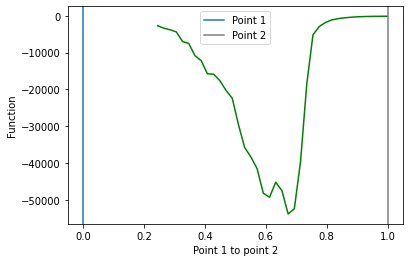

/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/venv/lib/python3.8/site-packages/scipy/integrate/odepack.py:247: ODEintWarning:

Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.

/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/Likelihoods.py:264: RuntimeWarning:

invalid value encountered in power



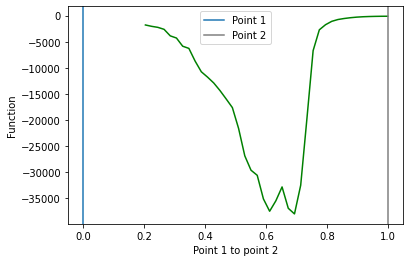

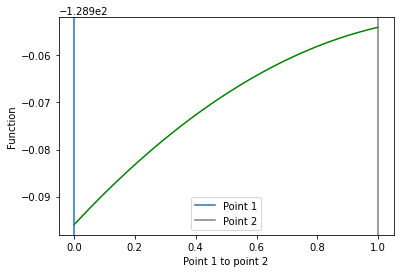

In [162]:
chain_1_mean = np.mean(samples[0,-num_samples:], axis=0)
chain_2_mean = np.mean(samples[1,-num_samples:], axis=0)
chain_3_mean = np.mean(samples[2,-num_samples:], axis=0)

# (50*chain_1_mean+50*chain_2_mean)/100

pints.plot.function_between_points(log_likelihood, chain_1_mean, chain_2_mean, padding=0, evaluations=50)
plt.show()
pints.plot.function_between_points(log_likelihood, chain_1_mean, chain_3_mean, padding=0, evaluations=50)
plt.show()
pints.plot.function_between_points(log_likelihood, chain_2_mean, chain_3_mean, padding=0, evaluations=50)
plt.show()

### PD - Pharmaceutical Data

In [4]:
PD_param_names = ["R_0", "MTT", "gamma", "s", "sigma_c", "eta", "sigma_m"]

In [5]:
PK_params=np.load('../Data_and_parameters/PK_real/opt_'+drug+'_'+str(dose)+'.npy')[0:4]
df = pandas.read_csv("../Data_and_parameters/PD_real/pd_real_data_refined_" + drug+ "_dose_" + str(dose))
start_time = df['TIME'].min()

dose_amount = df['dose_amount'][0]
PD_model = Pints_PD_model(PK_params, dose=dose_amount, start_time=start_time)
problem = pints.SingleOutputProblem(PD_model, df['TIME'].to_numpy()-start_time, df['OBS'].to_numpy())
print(df)

df_before_0 = df[df["TIME"] < 0]
times_before_dose = len(df_before_0["OBS"])
R_0_approx = sum(df_before_0["OBS"])/times_before_dose
print("approximate R_0: ", R_0_approx)

    Unnamed: 0   TIME  DOSE          OBS         std  dose_amount
0            2  -48.0  10.0   931.083333  122.426570     1.976778
1            6   24.0  10.0   773.750000  100.154464     1.976778
2           10   48.0  10.0   676.500000   69.173694     1.976778
3           14   72.0  10.0   711.750000  135.234056     1.976778
4           18   96.0  10.0   642.000000  119.635558     1.976778
5           22  120.0  10.0   808.000000   96.249675     1.976778
6           26  144.0  10.0   780.750000   90.973897     1.976778
7           30  168.0  10.0   711.250000  135.418795     1.976778
8           34  192.0  10.0   756.000000   51.961524     1.976778
9           38  216.0  10.0   997.500000  170.486559     1.976778
10          42  240.0  10.0  1122.500000  163.752863     1.976778
11          46  264.0  10.0  1570.333333  214.537487     1.976778
12          50  288.0  10.0  1092.500000  320.263954     1.976778
13          54  312.0  10.0  1443.666667  177.472064     1.976778
14        

In [6]:
opt_df = pandas.read_csv("../Data_and_parameters/PD_real/"+drug+"_"+str(dose)+"_opt_results.csv")
opt_add = np.asarray(opt_df['Constant Noise'][:6])
opt_mult = np.concatenate((
    np.asarray(opt_df['Multiplicative Noise'][:5]),
    np.asarray(opt_df['Multiplicative Noise'][6:-1])
)) 
opt_mult_noeta = np.concatenate((
    np.asarray(opt_df['Multiplicative Noise-FE'][:5]),
    np.asarray(opt_df['Multiplicative Noise-FE'][7:-1])
))
opt_comb = np.asarray(opt_df['Combined Noise'][:-1])
opt_comb_noeta = np.concatenate((
    np.asarray(opt_df['Combined Noise-FE'][:6]),
    np.asarray(opt_df['Combined Noise-FE'][7:-1])
))

lower_bound = [0.1*R_0_approx, df['TIME'].max()*0.001, 0.005, 0.01,     0.001,      0.001, 0.001]
upper_bound = [10*R_0_approx,      df['TIME'].max(),     5,    100,   R_0_approx,   10,    0.9]

opt_df

,Unnamed: 0,Parameter,Constant Noise,Multiplicative Noise,Multiplicative Noise-FE,Combined Noise,Combined Noise-FE
0,0,R_0,921.343099,985.143364,987.154052,985.434944,987.154121
1,1,MTT,76.858219,84.980165,84.452600,84.417317,84.452574
2,2,gamma,0.413551,0.418224,0.413793,0.411930,0.413793
3,3,s,19.969288,16.347642,16.861847,16.561767,16.861865
4,4,sigma_c,171.310277,NaN,NaN,36.695666,0.001000
5,5,eta,NaN,1.261554,NaN,1.668418,NaN
6,6,sigma_m,NaN,0.022990,0.138205,0.001000,0.138204
7,7,likelihood,114.063466,125.827867,125.861282,125.794526,125.861283


Combined Noise with eta

In [7]:
log_likelihood =  ConstantAndMultiplicativeGaussianLogLikelihood(problem)
# comb_lb = np.asarray(lower_bound[:4]+lower_bound[5:])
# comb_ub = np.asarray(upper_bound[:4]+upper_bound[5:])
log_prior = pints.UniformLogPrior(lower_bound, upper_bound)
opt_comb = opt_comb.astype(float)
start_points = [
    np.exp((np.log(lower_bound)+3*np.log(opt_comb))/4), 
    opt_comb, 
    np.exp((np.log(upper_bound)+3*np.log(opt_comb))/4)]
print(start_points)

[array([5.46346427e+02, 2.40053713e+01, 1.36728770e-01, 2.59615137e+00,
       2.65131349e+00, 2.61052980e-01, 1.00000000e-03]), array([9.85434944e+02, 8.44173170e+01, 4.11929799e-01, 1.65617674e+01,
       3.66956661e+01, 1.66841803e+00, 1.00000000e-03]), array([1.72769910e+03, 1.34992123e+02, 7.68882379e-01, 2.59615137e+01,
       8.23584605e+01, 2.61052980e+00, 5.47722558e-03])]


In [10]:
num_iterations = len(opt_comb)*10000  # 10000 iterations per parameter
num_samples = len(opt_comb)*3000 # 3000 final samples per parameter

samples = MCMC_run(
    log_likelihood, 
    log_prior, 
    start_points, 
    num_iterations, 
    num_samples, 
    save_point_like='../Data_and_parameters/PD_real/MCMC_comb_pointloglike_chain'
)

iter 	 chain 0 	 chain 1 	 chain 2 	 R_hat 		 Time
1 	 0.0     	 0.0     	 0.0     	 nan     	 0.4 seconds
20 	 0.45     	 0.05     	 0.35     	 nan     	 7.79 seconds
40 	 0.425     	 0.1     	 0.225     	 nan     	 14.68 seconds
60 	 0.4167     	 0.0833     	 0.2167     	 nan     	 22.19 seconds
80 	 0.4     	 0.0875     	 0.2     	 nan     	 29.95 seconds
100 	 0.41     	 0.09     	 0.2     	 nan     	 37.79 seconds
120 	 0.4167     	 0.1167     	 0.1917     	 nan     	 45.19 seconds
140 	 0.4     	 0.1357     	 0.1786     	 nan     	 53.23 seconds
160 	 0.4188     	 0.15     	 0.1812     	 nan     	 1 minute, 1 second
180 	 0.4333     	 0.15     	 0.1833     	 nan     	 1 minute, 8 seconds
200 	 0.415     	 0.155     	 0.17     	 nan     	 1 minute, 15 seconds
210 	 0.4333     	 0.1571     	 0.1762     	 nan     	 1 minute, 18 seconds
220 	 0.4455     	 0.1682     	 0.1773     	 nan     	 1 minute, 22 seconds
240 	 0.4375     	 0.1583     	 0.175     	 nan     	 1 minute, 28 second

/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/venv/lib/python3.8/site-packages/scipy/integrate/odepack.py:247: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)


630 	 0.4429     	 0.1825     	 0.1714     	 nan     	 4 minutes, 24 seconds
640 	 0.4406     	 0.1859     	 0.1688     	 nan     	 4 minutes, 28 seconds
660 	 0.4318     	 0.1864     	 0.1667     	 nan     	 4 minutes, 36 seconds
680 	 0.4324     	 0.1868     	 0.1618     	 nan     	 4 minutes, 44 seconds
700 	 0.43     	 0.19     	 0.1571     	 nan     	 4 minutes, 53 seconds
720 	 0.425     	 0.1889     	 0.1542     	 nan     	 5 minutes, 2 seconds
740 	 0.4243     	 0.1892     	 0.1541     	 nan     	 5 minutes, 11 seconds
760 	 0.4211     	 0.1868     	 0.1513     	 nan     	 5 minutes, 19 seconds
780 	 0.4179     	 0.191     	 0.15     	 nan     	 5 minutes, 26 seconds
800 	 0.415     	 0.19     	 0.15     	 nan     	 5 minutes, 35 seconds
820 	 0.4134     	 0.1866     	 0.1512     	 nan     	 5 minutes, 45 seconds
840 	 0.4071     	 0.1905     	 0.1476     	 nan     	 5 minutes, 54 seconds
860 	 0.4047     	 0.1884     	 0.1488     	 nan     	 6 minutes, 0 seconds
880 	 0.3989  

/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/PD_model.py:40: RuntimeWarning: invalid value encountered in power
  feedback = np.power(


1020 	 0.3706     	 0.1902     	 0.1412     	 nan     	 6 minutes, 56 seconds
1040 	 0.3683     	 0.1894     	 0.1404     	 nan     	 7 minutes, 3 seconds
1050 	 0.3667     	 0.1895     	 0.14     	 nan     	 7 minutes, 7 seconds
1060 	 0.3651     	 0.1896     	 0.1396     	 nan     	 7 minutes, 10 seconds
1080 	 0.3611     	 0.188     	 0.137     	 nan     	 7 minutes, 17 seconds
1100 	 0.3591     	 0.19     	 0.1382     	 nan     	 7 minutes, 23 seconds
1120 	 0.3527     	 0.1884     	 0.1375     	 nan     	 7 minutes, 29 seconds
1140 	 0.3465     	 0.1868     	 0.1386     	 nan     	 7 minutes, 36 seconds
1160 	 0.3431     	 0.1879     	 0.1371     	 nan     	 7 minutes, 42 seconds
1180 	 0.3381     	 0.189     	 0.1373     	 nan     	 7 minutes, 48 seconds
1200 	 0.3342     	 0.19     	 0.1375     	 nan     	 7 minutes, 54 seconds
1220 	 0.3328     	 0.191     	 0.1352     	 nan     	 8 minutes, 0 seconds
1240 	 0.3298     	 0.1903     	 0.1347     	 nan     	 8 minutes, 6 seconds


/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/Likelihoods.py:264: RuntimeWarning: invalid value encountered in power
  sigma_tot = sigma_base + sigma_rel * function_values**eta


3990 	 0.194     	 0.1957     	 0.1526     	 nan     	 23 minutes, 12 seconds
4200 	 0.1931     	 0.1974     	 0.1555     	 nan     	 24 minutes, 14 seconds
4410 	 0.2011     	 0.2007     	 0.1542     	 nan     	 25 minutes, 14 seconds
4620 	 0.2128     	 0.1989     	 0.1589     	 nan     	 26 minutes, 12 seconds
4830 	 0.2219     	 0.2     	 0.164     	 nan     	 27 minutes, 10 seconds
5040 	 0.2246     	 0.201     	 0.1661     	 nan     	 28 minutes, 12 seconds
5250 	 0.2301     	 0.2025     	 0.1676     	 nan     	 29 minutes, 12 seconds
5460 	 0.2344     	 0.2015     	 0.1703     	 nan     	 30 minutes, 11 seconds
5670 	 0.2365     	 0.2005     	 0.172     	 nan     	 31 minutes, 10 seconds
5880 	 0.2398     	 0.1988     	 0.1735     	 nan     	 32 minutes, 10 seconds
6090 	 0.2397     	 0.1995     	 0.176     	 nan     	 33 minutes, 9 seconds
6300 	 0.2408     	 0.1984     	 0.1789     	 nan     	 34 minutes, 22 seconds
6510 	 0.243     	 0.2011     	 0.1786     	 nan     	 35 min

/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/Likelihoods.py:268: RuntimeWarning: overflow encountered in square
  0.5 * error**2 / (sigma_tot**2)
/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/Likelihoods.py:268: RuntimeWarning: invalid value encountered in true_divide
  0.5 * error**2 / (sigma_tot**2)


9450 	 0.2226     	 0.2059     	 0.1833     	 nan     	 53 minutes, 8 seconds
9660 	 0.2182     	 0.2054     	 0.1803     	 nan     	 54 minutes, 32 seconds
9870 	 0.2139     	 0.2084     	 0.177     	 nan     	 55 minutes, 44 seconds
10080 	 0.2101     	 0.208     	 0.1764     	 nan     	 56 minutes, 53 seconds
10290 	 0.2068     	 0.2096     	 0.1755     	 nan     	 57 minutes, 59 seconds
10500 	 0.2078     	 0.2114     	 0.1763     	 nan     	 59 minutes, 4 seconds
10710 	 0.2057     	 0.2119     	 0.178     	 nan     	 1 hour, 0 minutes, 11 seconds
10920 	 0.2052     	 0.2124     	 0.1791     	 nan     	 1 hour, 1 minute, 20 seconds
11130 	 0.2038     	 0.2119     	 0.1792     	 nan     	 1 hour, 2 minutes, 33 seconds
11340 	 0.2065     	 0.2128     	 0.1831     	 nan     	 1 hour, 3 minutes, 40 seconds
11550 	 0.2062     	 0.2125     	 0.187     	 nan     	 1 hour, 4 minutes, 52 seconds
11760 	 0.2065     	 0.2122     	 0.1894     	 nan     	 1 hour, 6 minutes, 4 seconds
11970 	 0

28980 	 0.1866     	 0.222     	 0.2181     	 1.6306     	 2 hours, 41 minutes, 50 seconds
29190 	 0.1869     	 0.2219     	 0.2185     	 1.6409     	 2 hours, 43 minutes, 3 seconds
29400 	 0.1863     	 0.2218     	 0.2193     	 1.6607     	 2 hours, 44 minutes, 16 seconds
29610 	 0.1871     	 0.2212     	 0.2195     	 1.6815     	 2 hours, 45 minutes, 29 seconds
29820 	 0.1871     	 0.2209     	 0.2191     	 1.7309     	 2 hours, 46 minutes, 42 seconds
30030 	 0.1872     	 0.2211     	 0.2193     	 1.8223     	 2 hours, 47 minutes, 55 seconds
30240 	 0.187     	 0.2214     	 0.2191     	 2.1362     	 2 hours, 49 minutes, 8 seconds
30450 	 0.1866     	 0.2216     	 0.2193     	 2.1641     	 2 hours, 50 minutes, 21 seconds
30660 	 0.1859     	 0.2217     	 0.2197     	 2.2262     	 2 hours, 51 minutes, 35 seconds
30870 	 0.1856     	 0.2221     	 0.2194     	 2.2488     	 2 hours, 52 minutes, 49 seconds
31080 	 0.1851     	 0.2225     	 0.2188     	 2.3004     	 2 hours, 54 minutes, 3 s

47880 	 0.1687     	 0.2266     	 0.2231     	 2.2322     	 4 hours, 32 minutes, 30 seconds
48090 	 0.1683     	 0.2268     	 0.223     	 2.2333     	 4 hours, 33 minutes, 45 seconds
48300 	 0.168     	 0.227     	 0.223     	 2.2351     	 4 hours, 35 minutes, 2 seconds
48510 	 0.1685     	 0.2275     	 0.2229     	 2.2347     	 4 hours, 36 minutes, 19 seconds
48720 	 0.1681     	 0.2275     	 0.2232     	 2.2367     	 4 hours, 37 minutes, 34 seconds
48930 	 0.1682     	 0.2277     	 0.2235     	 2.2365     	 4 hours, 38 minutes, 49 seconds
49140 	 0.1683     	 0.228     	 0.2235     	 2.2358     	 4 hours, 40 minutes, 6 seconds
49350 	 0.1683     	 0.2283     	 0.2233     	 2.2342     	 4 hours, 41 minutes, 22 seconds
49560 	 0.1684     	 0.2283     	 0.2234     	 2.2363     	 4 hours, 42 minutes, 38 seconds
49770 	 0.1679     	 0.2282     	 0.2235     	 2.2539     	 4 hours, 43 minutes, 53 seconds
49980 	 0.1673     	 0.2283     	 0.2239     	 2.2546     	 4 hours, 45 minutes, 7 seco

66780 	 0.1629     	 0.2273     	 0.2269     	 2.2417     	 6 hours, 26 minutes, 58 seconds
66990 	 0.1631     	 0.2276     	 0.2268     	 2.2411     	 6 hours, 28 minutes, 16 seconds
67200 	 0.1631     	 0.2278     	 0.2267     	 2.2405     	 6 hours, 29 minutes, 34 seconds
67410 	 0.1632     	 0.2277     	 0.2265     	 2.236     	 6 hours, 30 minutes, 52 seconds
67620 	 0.1636     	 0.2276     	 0.2262     	 2.2408     	 6 hours, 32 minutes, 9 seconds
67830 	 0.1633     	 0.2276     	 0.2266     	 2.2356     	 6 hours, 33 minutes, 27 seconds
68040 	 0.1632     	 0.2277     	 0.2266     	 2.2366     	 6 hours, 34 minutes, 46 seconds
68250 	 0.1632     	 0.2274     	 0.2264     	 2.2312     	 6 hours, 36 minutes, 4 seconds
68460 	 0.1636     	 0.2275     	 0.2264     	 2.2332     	 6 hours, 37 minutes, 22 seconds
68670 	 0.1639     	 0.2274     	 0.2264     	 2.2339     	 6 hours, 38 minutes, 39 seconds
68880 	 0.1637     	 0.2273     	 0.2264     	 2.2287     	 6 hours, 39 minutes, 57

In [11]:
for chain, sample_chain in enumerate(samples):
    pints.io.save_samples('../Data_and_parameters/PD_real/MCMC_comb_samples_chain'+"_"+str(chain), sample_chain)

samples = np.asarray(pints.io.load_samples('../Data_and_parameters/PD_real/MCMC_comb_samples_chain', n=3))

In [12]:
df_summary = pandas.DataFrame(
    pints.MCMCSummary(samples[:,-num_samples:], parameter_names=PD_param_names).summary(), 
    columns = [
        'parameter',
        'mean',
        'std deviation',
        '2.5% quantile',
        '25% quantile',
        '50% quantile', 
        '75% quantile', 
        '97.5% quantile', 
        'rhat', 
        'ess',
    ]
)

df_summary = df_summary.round(decimals=4)

In [13]:
fig =  ff.create_table(df_summary)
fig.update_layout(
    width=1000,
    height=200,
)
fig.show()

df_summary_reduced = df_summary.drop(columns=[
    '2.5% quantile',
    '25% quantile',
    '50% quantile', 
    '75% quantile', 
    '97.5% quantile'
])

fig =  ff.create_table(df_summary_reduced)
fig.update_layout(
    width=500*5/6.0,
    height=200,
)
fig.write_image(image_file + "real_MCMC_comb_table.svg")

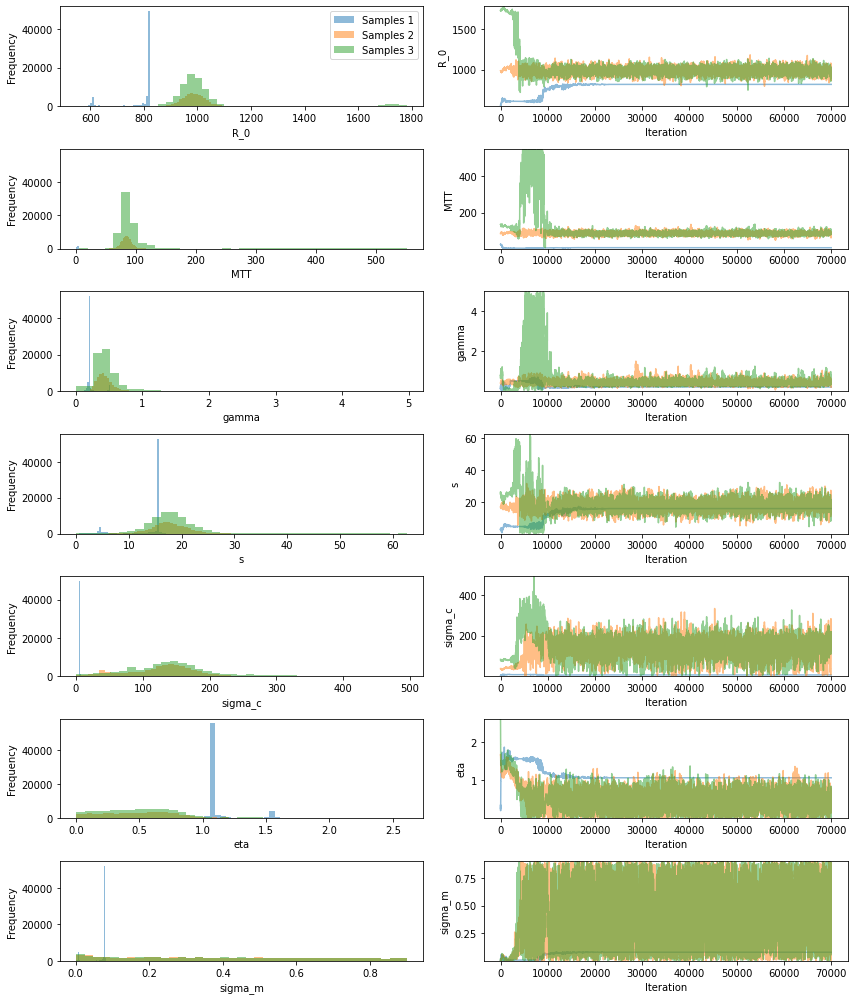

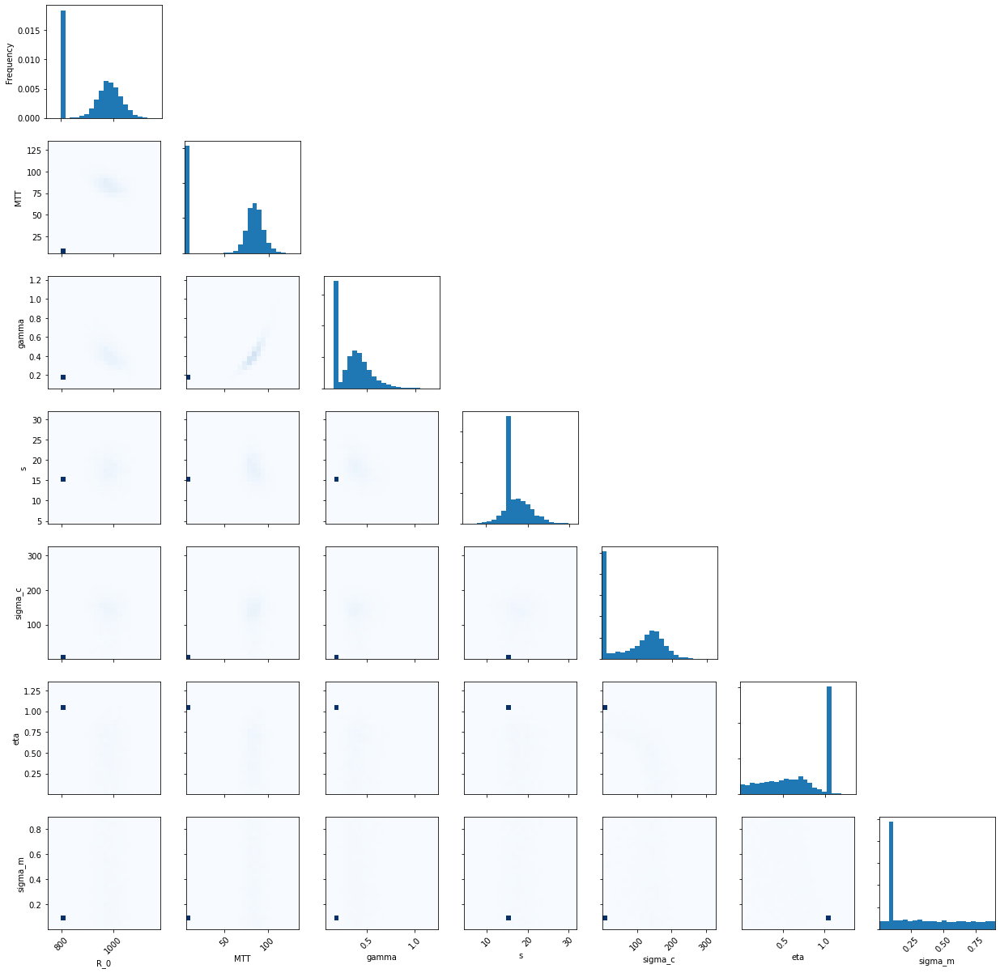

In [15]:
pints.plot.trace(samples, parameter_names=PD_param_names)
plt.savefig(image_file + "real_MCMC_comb_trace.svg")
plt.show()
pints.plot.pairwise(
    np.vstack(samples[:,-num_samples:]), 
    heatmap=True,
    parameter_names=PD_param_names,
)
plt.savefig(image_file + "sim_MCMC_comb_pairs.svg")
plt.show()

Fixed sigma_c and eta (i.e. mult fixed eta)

In [16]:
log_likelihood = ConstantAndMultiplicativeGaussianLogLikelihood(problem, fix_noise=[0, 1, None])
fix_lb = np.asarray(lower_bound[:4]+lower_bound[-1:])
fix_ub = np.asarray(upper_bound[:4]+upper_bound[-1:])
log_prior = pints.UniformLogPrior(fix_lb, fix_ub)
opt_fix = opt_comb.astype(float).copy()
opt_fix = np.concatenate((opt_fix[:4], opt_fix[-1:]))
start_points = [
    np.exp((np.log(fix_lb)+3*np.log(opt_fix))/4), 
    opt_fix , 
    np.exp((np.log(fix_ub)+3*np.log(opt_fix))/4)]
print(start_points)

[array([5.46346427e+02, 2.40053713e+01, 1.36728770e-01, 2.59615137e+00,
       1.00000000e-03]), array([9.85434944e+02, 8.44173170e+01, 4.11929799e-01, 1.65617674e+01,
       1.00000000e-03]), array([1.72769910e+03, 1.34992123e+02, 7.68882379e-01, 2.59615137e+01,
       5.47722558e-03])]


In [17]:
num_iterations = len(opt_fix)*10000  # 10000 iterations per parameter
num_samples = len(opt_fix)*3000 # 3000 final samples per parameter

samples = MCMC_run(
    log_likelihood, 
    log_prior, 
    start_points, 
    num_iterations, 
    num_samples, 
    save_point_like='../Data_and_parameters/PD_real/MCMC_fix12_pointloglike_chain'
)

iter 	 chain 0 	 chain 1 	 chain 2 	 R_hat 		 Time
1 	 0.0     	 0.0     	 0.0     	 nan     	 0.54 seconds


/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/Likelihoods.py:267: RuntimeWarning:

invalid value encountered in log



20 	 0.5     	 0.45     	 0.5     	 nan     	 8.85 seconds
40 	 0.425     	 0.325     	 0.525     	 nan     	 17.96 seconds
60 	 0.5167     	 0.2833     	 0.5333     	 nan     	 27.27 seconds
80 	 0.525     	 0.2625     	 0.5375     	 nan     	 35.87 seconds
100 	 0.5     	 0.25     	 0.56     	 nan     	 43.56 seconds
120 	 0.4833     	 0.275     	 0.575     	 nan     	 51.83 seconds
140 	 0.4929     	 0.2571     	 0.5714     	 nan     	 1 minute, 0 seconds
150 	 0.5     	 0.2533     	 0.5667     	 nan     	 1 minute, 4 seconds
160 	 0.5062     	 0.275     	 0.55     	 nan     	 1 minute, 8 seconds
180 	 0.5     	 0.2722     	 0.5389     	 nan     	 1 minute, 16 seconds
200 	 0.5     	 0.265     	 0.54     	 nan     	 1 minute, 25 seconds
220 	 0.5091     	 0.2636     	 0.5273     	 nan     	 1 minute, 33 seconds
240 	 0.525     	 0.2833     	 0.525     	 nan     	 1 minute, 42 seconds
260 	 0.5308     	 0.2962     	 0.5077     	 nan     	 1 minute, 50 seconds
280 	 0.5464     	 0.292

/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/venv/lib/python3.8/site-packages/scipy/integrate/odepack.py:247: ODEintWarning:

Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.



580 	 0.6345     	 0.4086     	 0.4603     	 nan     	 4 minutes, 22 seconds
600 	 0.6183     	 0.415     	 0.4583     	 nan     	 4 minutes, 44 seconds
620 	 0.5984     	 0.4161     	 0.4597     	 nan     	 5 minutes, 6 seconds
640 	 0.5813     	 0.4219     	 0.4578     	 nan     	 5 minutes, 29 seconds
660 	 0.5667     	 0.4288     	 0.4576     	 nan     	 5 minutes, 50 seconds
680 	 0.5515     	 0.4309     	 0.4603     	 nan     	 6 minutes, 14 seconds
700 	 0.5371     	 0.4329     	 0.4657     	 nan     	 6 minutes, 34 seconds
720 	 0.5236     	 0.4306     	 0.4639     	 nan     	 6 minutes, 55 seconds
740 	 0.5122     	 0.4365     	 0.4662     	 nan     	 7 minutes, 16 seconds
750 	 0.5067     	 0.4387     	 0.4707     	 nan     	 7 minutes, 25 seconds
760 	 0.5039     	 0.4434     	 0.475     	 nan     	 7 minutes, 35 seconds
780 	 0.5154     	 0.4474     	 0.4782     	 nan     	 7 minutes, 48 seconds
800 	 0.5238     	 0.4512     	 0.4738     	 nan     	 7 minutes, 58 seconds
82

/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/PD_model.py:40: RuntimeWarning:

invalid value encountered in power



1800 	 0.5517     	 0.4533     	 0.4372     	 nan     	 16 minutes, 38 seconds
1950 	 0.5221     	 0.4349     	 0.4154     	 nan     	 17 minutes, 54 seconds
2100 	 0.4943     	 0.4133     	 0.4067     	 nan     	 18 minutes, 59 seconds


/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/Likelihoods.py:268: RuntimeWarning:

overflow encountered in square

/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/Likelihoods.py:268: RuntimeWarning:

invalid value encountered in true_divide



2250 	 0.4733     	 0.4004     	 0.3916     	 nan     	 20 minutes, 15 seconds
2400 	 0.4571     	 0.3871     	 0.3796     	 nan     	 21 minutes, 21 seconds
2550 	 0.4388     	 0.3765     	 0.3659     	 nan     	 22 minutes, 26 seconds
2700 	 0.4204     	 0.363     	 0.3544     	 nan     	 23 minutes, 27 seconds
2850 	 0.406     	 0.3544     	 0.3491     	 nan     	 24 minutes, 29 seconds
3000 	 0.3963     	 0.3497     	 0.3427     	 nan     	 25 minutes, 34 seconds
3150 	 0.3902     	 0.3419     	 0.34     	 nan     	 26 minutes, 39 seconds
3300 	 0.3852     	 0.3361     	 0.3345     	 nan     	 27 minutes, 43 seconds
3450 	 0.382     	 0.3296     	 0.3296     	 nan     	 28 minutes, 34 seconds
3600 	 0.3764     	 0.3275     	 0.3206     	 nan     	 29 minutes, 24 seconds
3750 	 0.3677     	 0.3213     	 0.3149     	 nan     	 30 minutes, 16 seconds
3900 	 0.3623     	 0.3187     	 0.3115     	 nan     	 31 minutes, 7 seconds
4050 	 0.3578     	 0.3165     	 0.3099     	 nan     	 31

16950 	 0.2608     	 0.2492     	 0.2503     	 1.0778     	 1 hour, 43 minutes, 26 seconds
17100 	 0.2604     	 0.2495     	 0.2505     	 1.0718     	 1 hour, 44 minutes, 20 seconds
17250 	 0.2601     	 0.2492     	 0.2504     	 1.0648     	 1 hour, 45 minutes, 10 seconds
complete


In [18]:
for chain, sample_chain in enumerate(samples):
    pints.io.save_samples('../Data_and_parameters/PD_real/MCMC_fix12_samples_chain'+"_"+str(chain), sample_chain)

samples = np.asarray(pints.io.load_samples('../Data_and_parameters/PD_real/MCMC_fix12_samples_chain', n=3))

In [19]:
fix_names = PD_param_names.copy()
fix_names = fix_names[:4]+fix_names[-1:]
df_summary = pandas.DataFrame(
    pints.MCMCSummary(samples[:,-num_samples:], parameter_names=fix_names).summary(), 
    columns = [
        'parameter',
        'mean',
        'std deviation',
        '2.5% quantile',
        '25% quantile',
        '50% quantile', 
        '75% quantile', 
        '97.5% quantile', 
        'rhat', 
        'ess',
    ]
)

df_summary = df_summary.round(decimals=4)

In [20]:
fig =  ff.create_table(df_summary)
fig.update_layout(
    width=1000,
    height=200,
)
fig.show()

df_summary_reduced = df_summary.drop(columns=[
    '2.5% quantile',
    '25% quantile',
    '50% quantile', 
    '75% quantile', 
    '97.5% quantile'
])

fig =  ff.create_table(df_summary_reduced)
fig.update_layout(
    width=500*5/6.0,
    height=200,
)
fig.write_image(image_file + "real_MCMC_fix12_table.svg")

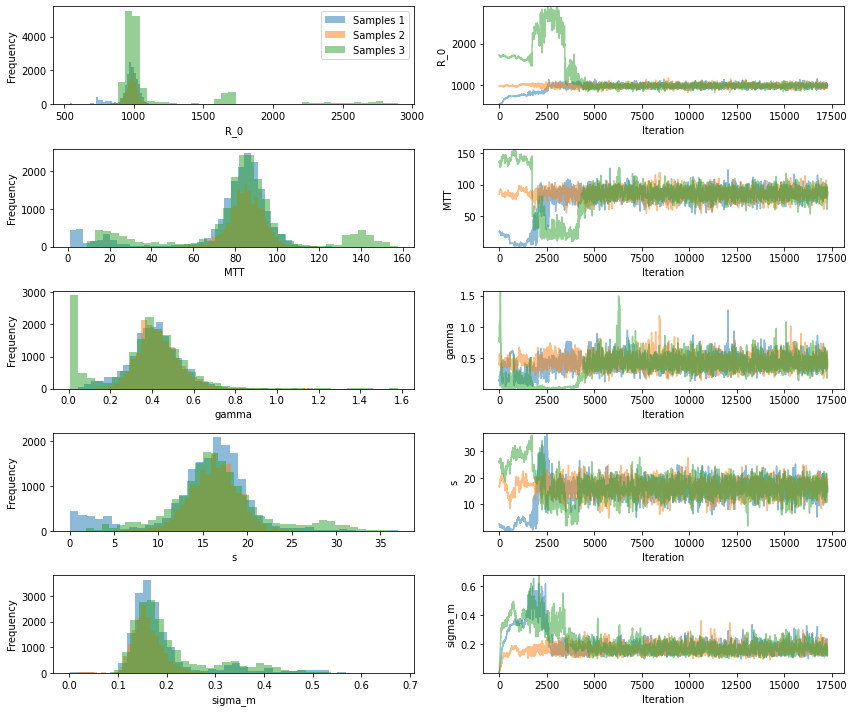

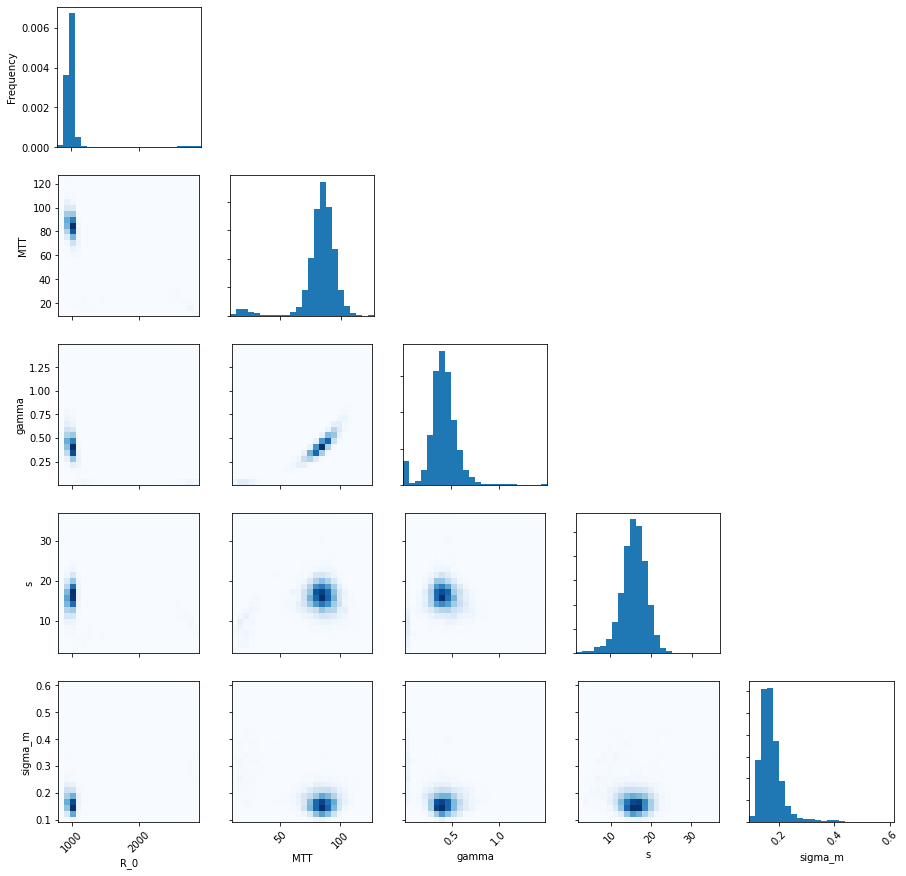

In [21]:
pints.plot.trace(samples, parameter_names=fix_names)
plt.savefig(image_file + "real_MCMC_fix12_trace.svg")
plt.show()
pints.plot.pairwise(
    np.vstack(samples[:,-num_samples:]), 
    heatmap=True,
    parameter_names=fix_names,
)
plt.savefig(image_file + "sim_MCMC_fix12_pairs.svg")
plt.show()

In [22]:
# chain_1_mean = np.mean(samples[0,-num_samples:], axis=0)
# chain_2_mean = np.mean(samples[1,-num_samples:], axis=0)
# chain_3_mean = np.mean(samples[2,-num_samples:], axis=0)

# # (50*chain_1_mean+50*chain_2_mean)/100

# pints.plot.function_between_points(log_likelihood, chain_1_mean, chain_2_mean, padding=0, evaluations=50)
# plt.show()
# pints.plot.function_between_points(log_likelihood, chain_1_mean, chain_3_mean, padding=0, evaluations=50)
# plt.show()
# pints.plot.function_between_points(log_likelihood, chain_2_mean, chain_3_mean, padding=0, evaluations=50)
# plt.show()

Fixed eta and sigms_m (i.e. constant noise)

In [23]:
log_likelihood = ConstantAndMultiplicativeGaussianLogLikelihood(problem, fix_noise=[None, 1, 0])
fix_lb = lower_bound.copy()[:5]
fix_ub = upper_bound.copy()[:5]
log_prior = pints.UniformLogPrior(fix_lb, fix_ub)
opt_fix = opt_comb.astype(float).copy()
opt_fix = opt_fix[:5]
start_points = [
    np.exp((np.log(fix_lb)+3*np.log(opt_fix))/4), 
    opt_fix , 
    np.exp((np.log(fix_ub)+3*np.log(opt_fix))/4)]
print(start_points)

[array([5.46346427e+02, 2.40053713e+01, 1.36728770e-01, 2.59615137e+00,
       2.65131349e+00]), array([9.85434944e+02, 8.44173170e+01, 4.11929799e-01, 1.65617674e+01,
       3.66956661e+01]), array([1.72769910e+03, 1.34992123e+02, 7.68882379e-01, 2.59615137e+01,
       8.23584605e+01])]


In [24]:
num_iterations = len(opt_fix)*10000  # 10000 iterations per parameter
num_samples = len(opt_fix)*3000 # 3000 final samples per parameter

samples = MCMC_run(
    log_likelihood, 
    log_prior, 
    start_points, 
    num_iterations, 
    num_samples, 
    save_point_like='../Data_and_parameters/PD_real/MCMC_fix23_pointloglike_chain'
)

iter 	 chain 0 	 chain 1 	 chain 2 	 R_hat 		 Time
1 	 0.0     	 0.0     	 0.0     	 nan     	 0.37 seconds
20 	 0.3     	 0.05     	 0.5     	 nan     	 7.25 seconds
40 	 0.475     	 0.15     	 0.425     	 nan     	 14.08 seconds
60 	 0.4833     	 0.2     	 0.35     	 nan     	 21.3 seconds
80 	 0.4875     	 0.2375     	 0.3     	 nan     	 28.49 seconds
100 	 0.49     	 0.23     	 0.25     	 nan     	 35.42 seconds
120 	 0.5083     	 0.2333     	 0.2333     	 nan     	 42.48 seconds
140 	 0.5143     	 0.2429     	 0.2143     	 nan     	 49.62 seconds
150 	 0.52     	 0.2467     	 0.2067     	 nan     	 53.31 seconds
160 	 0.5     	 0.2313     	 0.2125     	 nan     	 56.78 seconds
180 	 0.4833     	 0.2278     	 0.1944     	 nan     	 1 minute, 4 seconds
200 	 0.465     	 0.215     	 0.2     	 nan     	 1 minute, 12 seconds
220 	 0.4318     	 0.2227     	 0.1955     	 nan     	 1 minute, 20 seconds
240 	 0.425     	 0.2292     	 0.1958     	 nan     	 1 minute, 28 seconds
260 	 0.411

/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/venv/lib/python3.8/site-packages/scipy/integrate/odepack.py:247: ODEintWarning:

Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.



1650 	 0.1648     	 0.277     	 0.2291     	 nan     	 10 minutes, 50 seconds
1800 	 0.1822     	 0.2717     	 0.2394     	 nan     	 11 minutes, 40 seconds


/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/Likelihoods.py:267: RuntimeWarning:

invalid value encountered in log



1950 	 0.1938     	 0.2605     	 0.2338     	 nan     	 12 minutes, 29 seconds


/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/PD_model.py:40: RuntimeWarning:

invalid value encountered in power



2100 	 0.1919     	 0.2514     	 0.2295     	 nan     	 13 minutes, 23 seconds
2250 	 0.184     	 0.2476     	 0.2302     	 nan     	 14 minutes, 11 seconds
2400 	 0.1833     	 0.2458     	 0.2254     	 nan     	 14 minutes, 59 seconds
2550 	 0.1898     	 0.2404     	 0.2251     	 nan     	 15 minutes, 49 seconds
2700 	 0.1915     	 0.2374     	 0.2263     	 nan     	 16 minutes, 37 seconds
2850 	 0.1954     	 0.2344     	 0.2207     	 nan     	 17 minutes, 23 seconds
3000 	 0.1943     	 0.2357     	 0.215     	 nan     	 18 minutes, 9 seconds
3150 	 0.1959     	 0.2375     	 0.2171     	 nan     	 18 minutes, 58 seconds
3300 	 0.1958     	 0.2345     	 0.2191     	 nan     	 19 minutes, 44 seconds
3450 	 0.1962     	 0.2307     	 0.2209     	 nan     	 20 minutes, 31 seconds
3600 	 0.1967     	 0.2278     	 0.2194     	 nan     	 21 minutes, 14 seconds
3750 	 0.1992     	 0.2283     	 0.2245     	 nan     	 21 minutes, 59 seconds
3900 	 0.1995     	 0.2285     	 0.2233     	 nan     	

/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/Likelihoods.py:268: RuntimeWarning:

overflow encountered in square



4500 	 0.1824     	 0.2287     	 0.2202     	 nan     	 26 minutes, 29 seconds
4650 	 0.1826     	 0.229     	 0.2198     	 nan     	 27 minutes, 21 seconds
4800 	 0.1821     	 0.2302     	 0.22     	 nan     	 28 minutes, 8 seconds
4950 	 0.1846     	 0.2303     	 0.2196     	 nan     	 28 minutes, 55 seconds
5100 	 0.1859     	 0.231     	 0.2204     	 nan     	 29 minutes, 45 seconds
5250 	 0.189     	 0.2301     	 0.2179     	 nan     	 30 minutes, 37 seconds
5400 	 0.1943     	 0.2307     	 0.2181     	 nan     	 31 minutes, 25 seconds
5550 	 0.1989     	 0.2312     	 0.2214     	 nan     	 32 minutes, 13 seconds
5700 	 0.2026     	 0.2288     	 0.2216     	 nan     	 33 minutes, 2 seconds
5850 	 0.2046     	 0.2285     	 0.2227     	 nan     	 33 minutes, 52 seconds
6000 	 0.2058     	 0.229     	 0.2218     	 nan     	 34 minutes, 45 seconds
6150 	 0.2091     	 0.2299     	 0.2228     	 nan     	 35 minutes, 33 seconds
6300 	 0.2102     	 0.23     	 0.2213     	 nan     	 36 min

In [25]:
for chain, sample_chain in enumerate(samples):
    pints.io.save_samples('../Data_and_parameters/PD_real/MCMC_fix23_samples_chain'+"_"+str(chain), sample_chain)

samples = np.asarray(pints.io.load_samples('../Data_and_parameters/PD_real/MCMC_fix23_samples_chain', n=3))

In [26]:
fix_names = PD_param_names.copy()
fix_names = fix_names[:5]
df_summary = pandas.DataFrame(
    pints.MCMCSummary(samples[:,-num_samples:], parameter_names=fix_names).summary(), 
    columns = [
        'parameter',
        'mean',
        'std deviation',
        '2.5% quantile',
        '25% quantile',
        '50% quantile', 
        '75% quantile', 
        '97.5% quantile', 
        'rhat', 
        'ess',
    ]
)

df_summary = df_summary.round(decimals=4)

In [27]:
fig =  ff.create_table(df_summary)
fig.update_layout(
    width=1000,
    height=200,
)
fig.show()

df_summary_reduced = df_summary.drop(columns=[
    '2.5% quantile',
    '25% quantile',
    '50% quantile', 
    '75% quantile', 
    '97.5% quantile'
])

fig =  ff.create_table(df_summary_reduced)
fig.update_layout(
    width=500*5/6.0,
    height=200,
)
fig.write_image(image_file + "real_MCMC_fix23_table.svg")

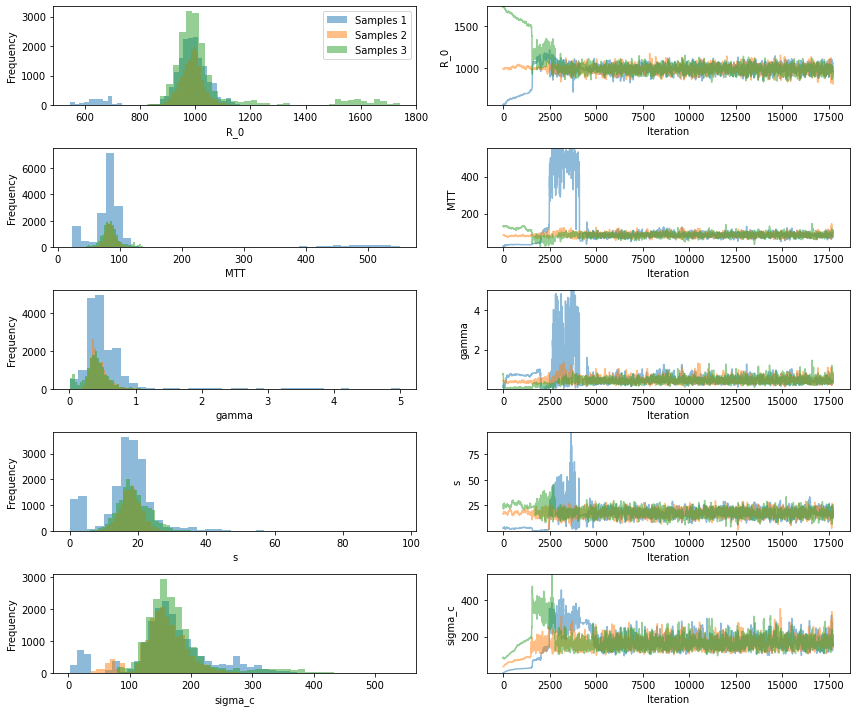

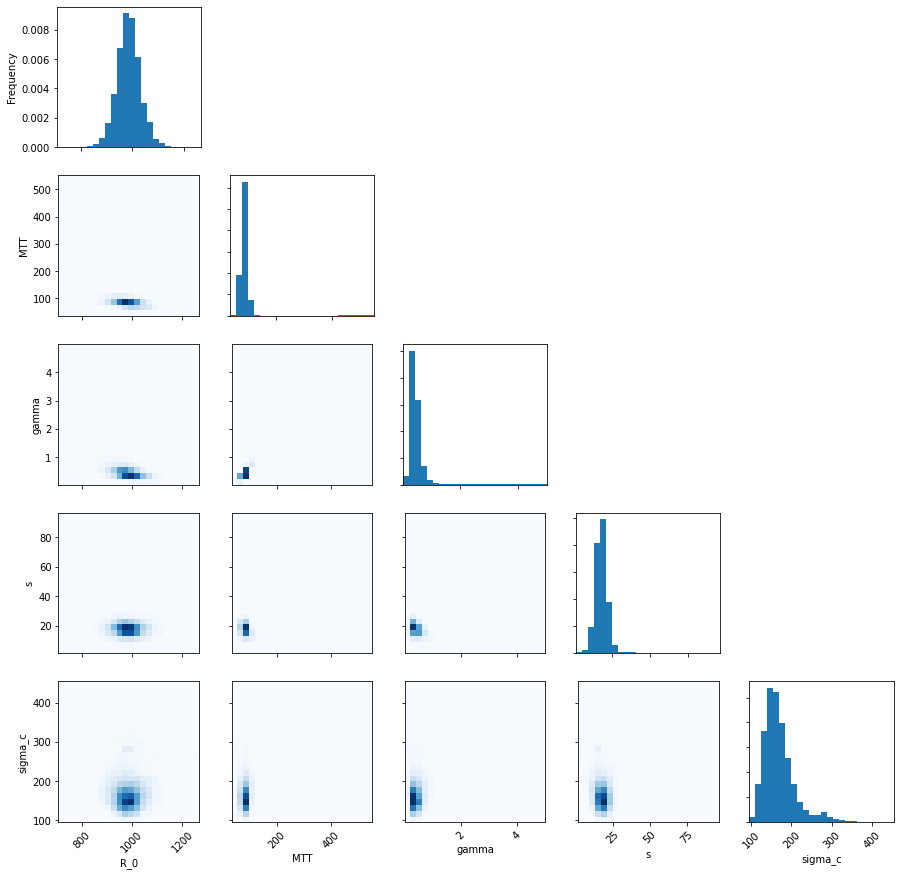

In [28]:
pints.plot.trace(samples, parameter_names=fix_names)
plt.savefig(image_file + "real_MCMC_fix23_trace.svg")
plt.show()
pints.plot.pairwise(
    np.vstack(samples[:,-num_samples:]), 
    heatmap=True,
    parameter_names=fix_names,
)
plt.savefig(image_file + "sim_MCMC_fix23_pairs.svg")
plt.show()

Fixed sigma_c and sigma_m (i.e. just eta)

In [29]:
log_likelihood = ConstantAndMultiplicativeGaussianLogLikelihood(problem, fix_noise=[150, None, 0.1])
fix_lb = np.asarray(lower_bound[:4]+lower_bound[-2:-1])
fix_ub = np.asarray(upper_bound[:4]+upper_bound[-2:-1])
log_prior = pints.UniformLogPrior(fix_lb, fix_ub)
opt_fix = opt_comb.astype(float).copy()
opt_fix = np.concatenate((opt_fix[:4], opt_fix[-2:-1]))
start_points = [
    np.exp((np.log(fix_lb)+3*np.log(opt_fix))/4), 
    opt_fix , 
    np.exp((np.log(fix_ub)+3*np.log(opt_fix))/4)]
print(start_points)

[array([5.46346427e+02, 2.40053713e+01, 1.36728770e-01, 2.59615137e+00,
       2.61052980e-01]), array([9.85434944e+02, 8.44173170e+01, 4.11929799e-01, 1.65617674e+01,
       1.66841803e+00]), array([1.72769910e+03, 1.34992123e+02, 7.68882379e-01, 2.59615137e+01,
       2.61052980e+00])]


In [30]:
num_iterations = len(opt_fix)*10000  # 10000 iterations per parameter
num_samples = len(opt_fix)*3000 # 3000 final samples per parameter

samples = MCMC_run(
    log_likelihood, 
    log_prior, 
    start_points, 
    num_iterations, 
    num_samples, 
    save_point_like='../Data_and_parameters/PD_real/MCMC_fix13_pointloglike_chain'
)

iter 	 chain 0 	 chain 1 	 chain 2 	 R_hat 		 Time
1 	 0.0     	 0.0     	 0.0     	 nan     	 0.43 seconds
20 	 0.65     	 0.4     	 0.65     	 nan     	 7.79 seconds
40 	 0.7     	 0.4     	 0.425     	 nan     	 14.63 seconds
60 	 0.7     	 0.3833     	 0.3833     	 nan     	 22.64 seconds
80 	 0.75     	 0.4125     	 0.3     	 nan     	 30.21 seconds
100 	 0.73     	 0.41     	 0.25     	 nan     	 37.16 seconds
120 	 0.75     	 0.4333     	 0.2083     	 nan     	 44.0 seconds
140 	 0.7643     	 0.4071     	 0.2     	 nan     	 50.65 seconds
150 	 0.76     	 0.4067     	 0.2     	 nan     	 53.98 seconds
160 	 0.7375     	 0.4     	 0.1875     	 nan     	 57.32 seconds
180 	 0.7389     	 0.3944     	 0.1722     	 nan     	 1 minute, 4 seconds
200 	 0.73     	 0.405     	 0.16     	 nan     	 1 minute, 11 seconds
220 	 0.7318     	 0.4455     	 0.1545     	 nan     	 1 minute, 18 seconds
240 	 0.7333     	 0.4375     	 0.15     	 nan     	 1 minute, 25 seconds
260 	 0.7308     	 0.4

/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/venv/lib/python3.8/site-packages/scipy/integrate/odepack.py:247: ODEintWarning:

Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.



1650 	 0.5927     	 0.5109     	 0.137     	 nan     	 9 minutes, 52 seconds


/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/Likelihoods.py:264: RuntimeWarning:

invalid value encountered in power



1800 	 0.5656     	 0.4783     	 0.1406     	 nan     	 10 minutes, 45 seconds


/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/PD_model.py:40: RuntimeWarning:

invalid value encountered in power



1950 	 0.5369     	 0.4518     	 0.1405     	 nan     	 11 minutes, 54 seconds


/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/Likelihoods.py:268: RuntimeWarning:

overflow encountered in square



2100 	 0.5057     	 0.4324     	 0.139     	 nan     	 13 minutes, 5 seconds
2250 	 0.4773     	 0.4147     	 0.1391     	 nan     	 14 minutes, 5 seconds
2400 	 0.4642     	 0.3987     	 0.1404     	 nan     	 14 minutes, 58 seconds
2550 	 0.4486     	 0.3863     	 0.1514     	 nan     	 15 minutes, 50 seconds
2700 	 0.4322     	 0.377     	 0.1515     	 nan     	 16 minutes, 40 seconds
2850 	 0.4228     	 0.367     	 0.1572     	 nan     	 17 minutes, 31 seconds
3000 	 0.4103     	 0.3593     	 0.1623     	 nan     	 18 minutes, 28 seconds
3150 	 0.4019     	 0.353     	 0.1676     	 nan     	 19 minutes, 30 seconds


/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/Likelihoods.py:268: RuntimeWarning:

invalid value encountered in true_divide



3300 	 0.3955     	 0.3467     	 0.1703     	 nan     	 20 minutes, 32 seconds
3450 	 0.3881     	 0.3406     	 0.167     	 nan     	 21 minutes, 34 seconds
3600 	 0.3819     	 0.3358     	 0.1689     	 nan     	 22 minutes, 32 seconds
3750 	 0.3749     	 0.3304     	 0.1688     	 nan     	 23 minutes, 27 seconds
3900 	 0.3697     	 0.3249     	 0.1687     	 nan     	 24 minutes, 22 seconds
4050 	 0.3654     	 0.3217     	 0.1694     	 nan     	 25 minutes, 17 seconds
4200 	 0.3619     	 0.3193     	 0.1736     	 nan     	 26 minutes, 13 seconds
4350 	 0.3579     	 0.3168     	 0.1752     	 nan     	 27 minutes, 10 seconds
4500 	 0.3547     	 0.3151     	 0.1793     	 nan     	 28 minutes, 7 seconds
4650 	 0.349     	 0.3129     	 0.1834     	 nan     	 29 minutes, 5 seconds
4800 	 0.3485     	 0.3096     	 0.1865     	 nan     	 29 minutes, 59 seconds
4950 	 0.3438     	 0.3053     	 0.1875     	 nan     	 30 minutes, 52 seconds
5100 	 0.3422     	 0.3012     	 0.1892     	 nan     	 

In [31]:
for chain, sample_chain in enumerate(samples):
    pints.io.save_samples('../Data_and_parameters/PD_real/MCMC_fix13_samples_chain'+"_"+str(chain), sample_chain)

samples = np.asarray(pints.io.load_samples('../Data_and_parameters/PD_real/MCMC_fix13_samples_chain', n=3))

In [32]:
fix_names = PD_param_names.copy()
fix_names = fix_names[:4]+fix_names[-2:-1]
df_summary = pandas.DataFrame(
    pints.MCMCSummary(samples[:,-num_samples:], parameter_names=fix_names).summary(), 
    columns = [
        'parameter',
        'mean',
        'std deviation',
        '2.5% quantile',
        '25% quantile',
        '50% quantile', 
        '75% quantile', 
        '97.5% quantile', 
        'rhat', 
        'ess',
    ]
)

df_summary = df_summary.round(decimals=4)

In [33]:
fig =  ff.create_table(df_summary)
fig.update_layout(
    width=1000,
    height=200,
)
fig.show()

df_summary_reduced = df_summary.drop(columns=[
    '2.5% quantile',
    '25% quantile',
    '50% quantile', 
    '75% quantile', 
    '97.5% quantile'
])

fig =  ff.create_table(df_summary_reduced)
fig.update_layout(
    width=500*5/6.0,
    height=200,
)
fig.write_image(image_file + "real_MCMC_fix13_table.svg")

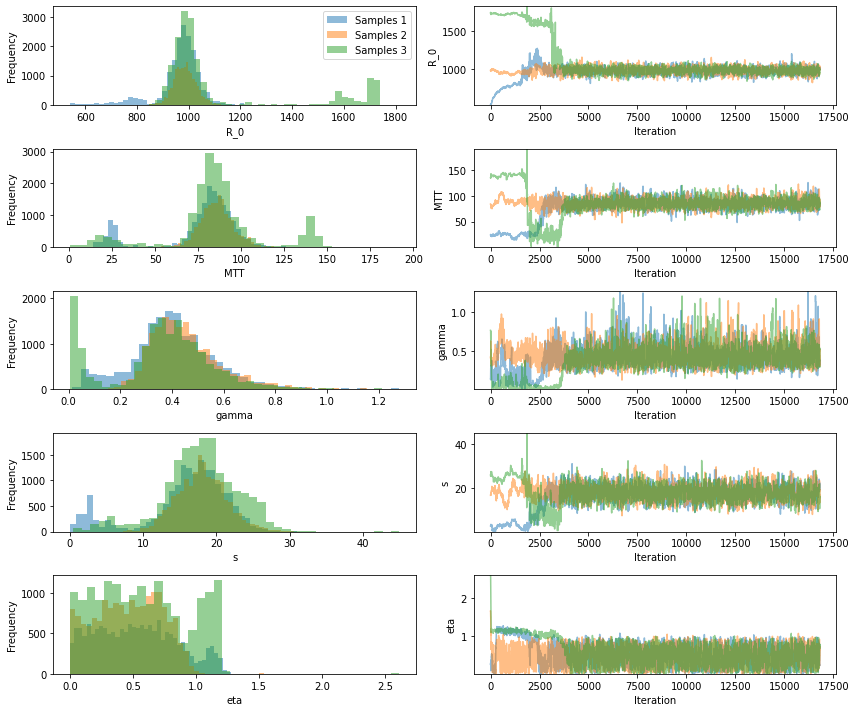

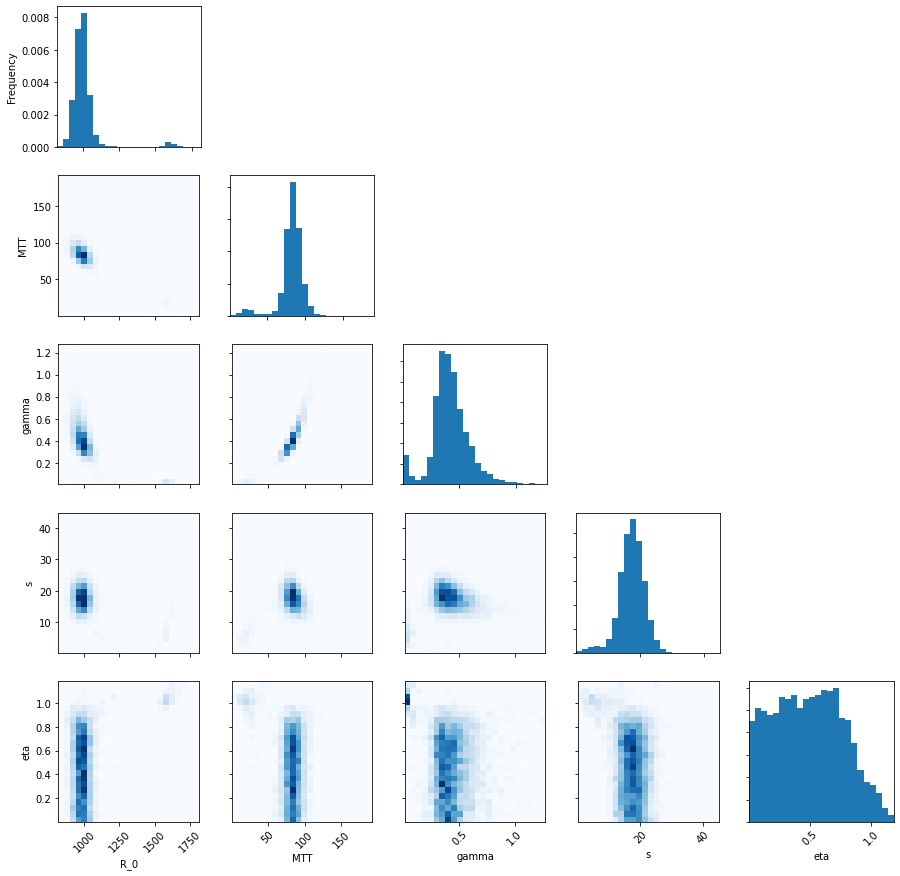

In [34]:
pints.plot.trace(samples, parameter_names=fix_names)
plt.savefig(image_file + "real_MCMC_fix13_trace.svg")
plt.show()
pints.plot.pairwise(
    np.vstack(samples[:,-num_samples:]), 
    heatmap=True,
    parameter_names=fix_names,
)
plt.savefig(image_file + "sim_MCMC_fix13_pairs.svg")
plt.show()

Fixed eta, reduced prior for sigma_c (i.e. combined noise, fixed eta)

In [35]:
log_likelihood = ConstantAndMultiplicativeGaussianLogLikelihood(problem, fix_noise=[None, 1, None])
fix_lb = np.concatenate((lower_bound.copy()[:5], lower_bound.copy()[-1:]))
fix_ub = np.concatenate((upper_bound.copy()[:5], upper_bound.copy()[-1:]))
fix_lb[4] = 7
log_prior = pints.UniformLogPrior(fix_lb, fix_ub)
opt_fix = opt_comb.astype(float).copy()
opt_fix = np.concatenate((opt_fix[:5], opt_fix[-1:]))
start_points = [
    np.exp((np.log(fix_lb)+3*np.log(opt_fix))/4), 
    opt_fix , 
    np.exp((np.log(fix_ub)+3*np.log(opt_fix))/4)]
print(start_points)

[array([5.46346427e+02, 2.40053713e+01, 1.36728770e-01, 2.59615137e+00,
       2.42513317e+01, 1.00000000e-03]), array([9.85434944e+02, 8.44173170e+01, 4.11929799e-01, 1.65617674e+01,
       3.66956661e+01, 1.00000000e-03]), array([1.72769910e+03, 1.34992123e+02, 7.68882379e-01, 2.59615137e+01,
       8.23584605e+01, 5.47722558e-03])]


In [36]:
num_iterations = len(opt_fix)*10000  # 10000 iterations per parameter
num_samples = len(opt_fix)*3000 # 3000 final samples per parameter

samples = MCMC_run(
    log_likelihood, 
    log_prior, 
    start_points, 
    num_iterations, 
    num_samples, 
    save_point_like='../Data_and_parameters/PD_real/MCMC_fix2_pointloglike_chain'
)

iter 	 chain 0 	 chain 1 	 chain 2 	 R_hat 		 Time
1 	 0.0     	 0.0     	 0.0     	 nan     	 0.45 seconds
20 	 0.5     	 0.45     	 0.45     	 nan     	 7.83 seconds
40 	 0.4     	 0.425     	 0.525     	 nan     	 16.4 seconds
60 	 0.45     	 0.35     	 0.4833     	 nan     	 24.59 seconds
80 	 0.425     	 0.375     	 0.4625     	 nan     	 34.96 seconds
100 	 0.39     	 0.41     	 0.43     	 nan     	 45.25 seconds
120 	 0.375     	 0.3833     	 0.3833     	 nan     	 55.43 seconds
140 	 0.4     	 0.3857     	 0.3714     	 nan     	 1 minute, 4 seconds
160 	 0.4375     	 0.4     	 0.3812     	 nan     	 1 minute, 12 seconds
180 	 0.45     	 0.3944     	 0.3833     	 nan     	 1 minute, 21 seconds
200 	 0.475     	 0.4     	 0.39     	 nan     	 1 minute, 29 seconds
220 	 0.4909     	 0.4136     	 0.4136     	 nan     	 1 minute, 37 seconds
240 	 0.5083     	 0.4292     	 0.4125     	 nan     	 1 minute, 45 seconds
260 	 0.5192     	 0.4423     	 0.4038     	 nan     	 1 minute, 52 

/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/Likelihoods.py:267: RuntimeWarning:

invalid value encountered in log



1980 	 0.7424     	 0.4798     	 0.3939     	 nan     	 12 minutes, 11 seconds


/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/venv/lib/python3.8/site-packages/scipy/integrate/odepack.py:247: ODEintWarning:

Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.



2160 	 0.6926     	 0.4551     	 0.3769     	 nan     	 13 minutes, 18 seconds


/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/PD_model.py:40: RuntimeWarning:

invalid value encountered in power

/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/Likelihoods.py:268: RuntimeWarning:

overflow encountered in square

/home/rumney/Documents/Myleotoxicity/Myleotoxicity-PKPD/Notebooks/Code/Likelihoods.py:268: RuntimeWarning:

invalid value encountered in true_divide



2340 	 0.6568     	 0.4329     	 0.3581     	 nan     	 14 minutes, 27 seconds
2520 	 0.6194     	 0.4155     	 0.3444     	 nan     	 15 minutes, 35 seconds
2700 	 0.5889     	 0.4007     	 0.3389     	 nan     	 16 minutes, 39 seconds
2880 	 0.5642     	 0.3875     	 0.333     	 nan     	 17 minutes, 44 seconds
3060 	 0.5438     	 0.3761     	 0.3216     	 nan     	 18 minutes, 49 seconds
3240 	 0.5262     	 0.3639     	 0.3139     	 nan     	 19 minutes, 54 seconds
3420 	 0.507     	 0.3579     	 0.3102     	 nan     	 20 minutes, 57 seconds
3600 	 0.4922     	 0.3514     	 0.3044     	 nan     	 21 minutes, 58 seconds
3780 	 0.4796     	 0.3429     	 0.3021     	 nan     	 22 minutes, 57 seconds
3960 	 0.4679     	 0.3389     	 0.3005     	 nan     	 24 minutes, 4 seconds
4140 	 0.4604     	 0.3321     	 0.2923     	 nan     	 25 minutes, 9 seconds
4320 	 0.45     	 0.3264     	 0.2914     	 nan     	 26 minutes, 11 seconds
4500 	 0.438     	 0.3196     	 0.2853     	 nan     	 27 

19980 	 0.277     	 0.2507     	 0.2387     	 1.0553     	 1 hour, 50 minutes, 54 seconds
20160 	 0.2763     	 0.2499     	 0.24     	 1.0499     	 1 hour, 51 minutes, 54 seconds
complete


In [37]:
for chain, sample_chain in enumerate(samples):
    pints.io.save_samples('../Data_and_parameters/PD_real/MCMC_fix2_samples_chain'+"_"+str(chain), sample_chain)

samples = np.asarray(pints.io.load_samples('../Data_and_parameters/PD_real/MCMC_fix2_samples_chain', n=3))

In [38]:
fix_names = PD_param_names.copy()
fix_names = fix_names[:5] + fix_names[-1:]
df_summary = pandas.DataFrame(
    pints.MCMCSummary(samples[:,-num_samples:], parameter_names=fix_names).summary(), 
    columns = [
        'parameter',
        'mean',
        'std deviation',
        '2.5% quantile',
        '25% quantile',
        '50% quantile', 
        '75% quantile', 
        '97.5% quantile', 
        'rhat', 
        'ess',
    ]
)

df_summary = df_summary.round(decimals=4)

In [39]:
fig =  ff.create_table(df_summary)
fig.update_layout(
    width=1000,
    height=200,
)
fig.show()

df_summary_reduced = df_summary.drop(columns=[
    '2.5% quantile',
    '25% quantile',
    '50% quantile', 
    '75% quantile', 
    '97.5% quantile'
])

fig =  ff.create_table(df_summary_reduced)
fig.update_layout(
    width=500*5/6.0,
    height=200,
)
fig.write_image(image_file + "real_MCMC_fix2_table.svg")

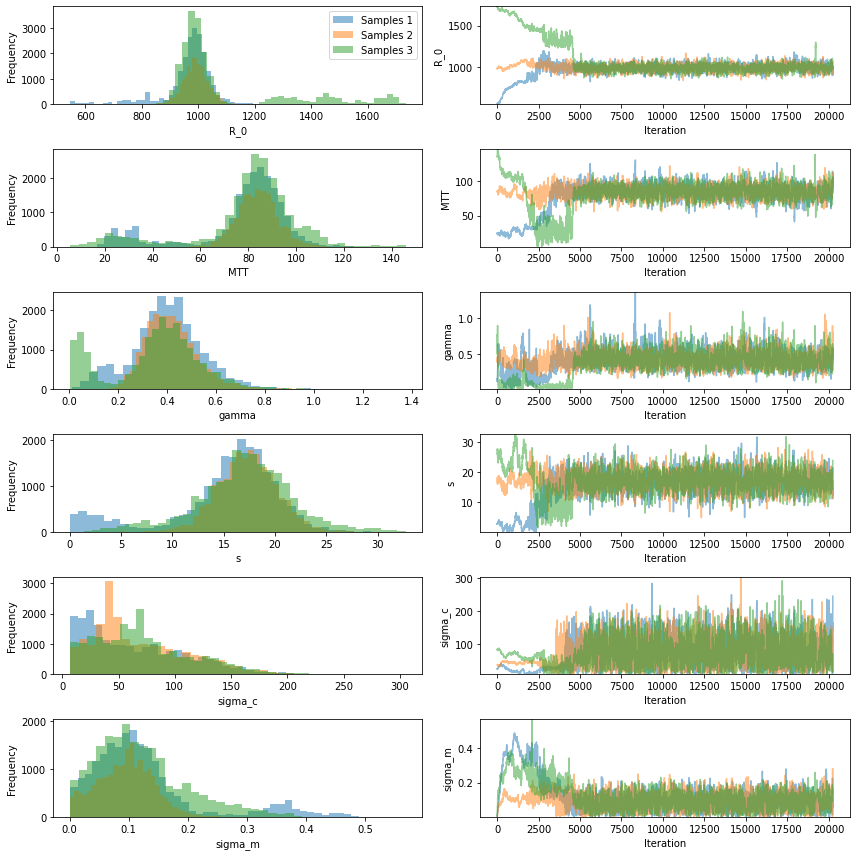

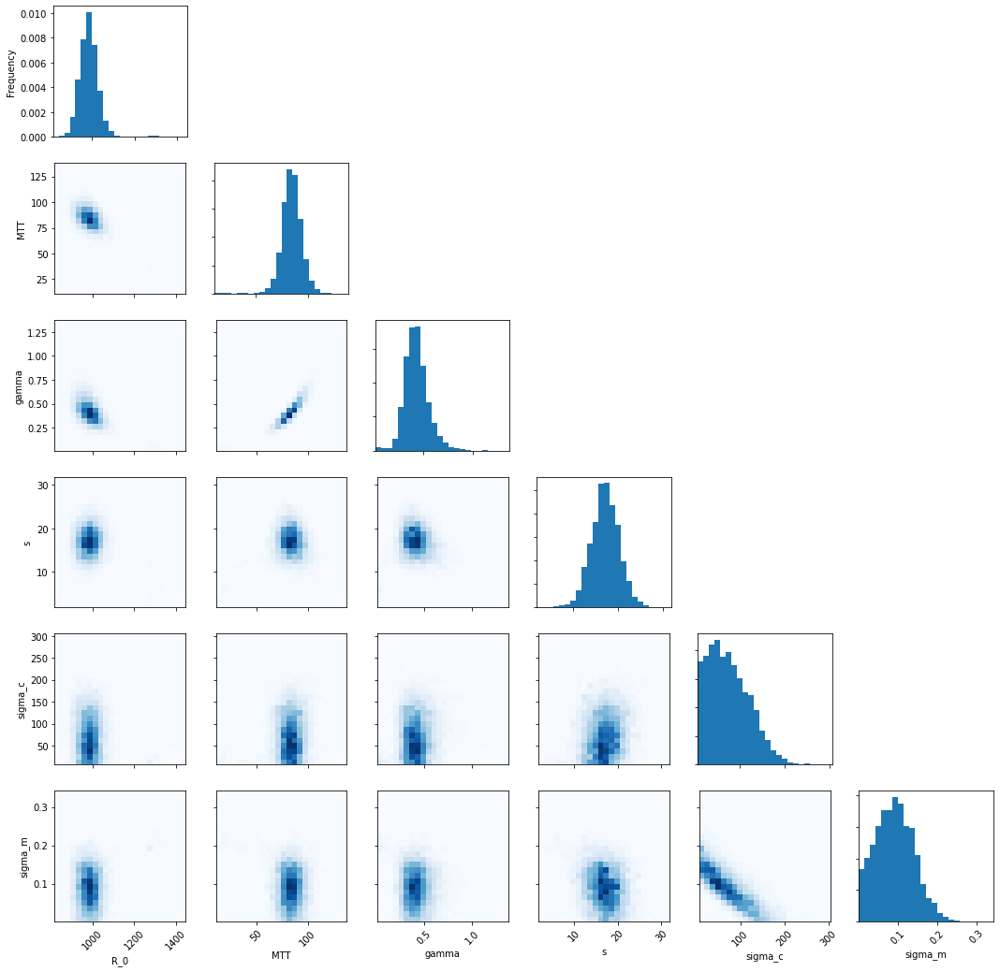

In [42]:
pints.plot.trace(samples, parameter_names=fix_names)
plt.savefig(image_file + "real_MCMC_fix2_trace.svg")
plt.show()
pints.plot.pairwise(
    np.vstack(samples[:,-int(0.9*num_samples):]), 
    heatmap=True,
    parameter_names=fix_names,
)
plt.savefig(image_file + "sim_MCMC_fix2_pairs.svg")
plt.show()

Constant

In [ ]:
# Optimise the model with respect to the data
problem = pints.SingleOutputProblem(PD_model, df['TIME'].to_numpy()-start_time, df['OBS'].to_numpy())
log_likelihood = GaussianLogLikelihood(problem)

log_prior = pints.UniformLogPrior(lower_bound[:5], upper_bound[:5])
log_posterior = pints.LogPosterior(log_likelihood, log_prior)

startpoints = [np.array(opt_point_add, dtype=float), 0.5*np.array(opt_point_add, dtype=float), 1.5*np.array(opt_point_add, dtype=float)]
num_iterations = len(lower_bound)*3000  # 3000 iterations per parameter

In [ ]:
hb_acmc_0 = pints.HaarioBardenetACMC(startpoints[0])
hb_acmc_1 = pints.HaarioBardenetACMC(startpoints[1])
hb_acmc_2 = pints.HaarioBardenetACMC(startpoints[2])

# We will need the pointwise log-likelihoods for each sample
list_pointwise_0 =[]
list_pointwise_1 =[]
list_pointwise_2 =[]

hb_acmc_0.set_initial_phase(True)
hb_acmc_1.set_initial_phase(True)
hb_acmc_2.set_initial_phase(True)

list_sample_0 =[]
list_sample_1 =[]
list_sample_2 =[]

for i in range(0,num_iterations):
    
    if i == 200:
        hb_acmc_0.set_initial_phase(False)
        hb_acmc_1.set_initial_phase(False)
        hb_acmc_2.set_initial_phase(False)

    x_0_propose = hb_acmc_0.ask()
    pointwise_x_0 = log_likelihood.create_pointwise_loglikelihoods(x_0_propose)
    lp_0 = np.sum(pointwise_x_0) + log_prior(x_0_propose)
    list_sample_0.append(hb_acmc_0.tell(lp_0))
    accept = x_0_propose == list_sample_0[-1]
    if np.all(accept):
        list_pointwise_0.append(pointwise_x_0)
    else:
        list_pointwise_0.append(list_pointwise_0[-1])
    
    x_1_propose = hb_acmc_1.ask()
    pointwise_x_1 = log_likelihood.create_pointwise_loglikelihoods(x_1_propose)
    lp_1 = np.sum(pointwise_x_1) + log_prior(x_1_propose)
    list_sample_1.append(hb_acmc_1.tell(lp_1))
    accept = x_1_propose == list_sample_1[-1]
    if np.all(accept):
        list_pointwise_1.append(pointwise_x_1)
    else:
        list_pointwise_1.append(list_pointwise_1[-1])
    
    x_2_propose = hb_acmc_2.ask()
    pointwise_x_2 = log_likelihood.create_pointwise_loglikelihoods(x_2_propose)
    lp_2 = np.sum(pointwise_x_2) + log_prior(x_2_propose)
    list_sample_2.append(hb_acmc_2.tell(lp_2))
    accept = x_2_propose == list_sample_2[-1]
    if np.all(accept):
        list_pointwise_2.append(pointwise_x_2)
    else:
        list_pointwise_2.append(list_pointwise_2[-1])
    
    if i % 100 == 0:
        print(str(i),'\t',round(hb_acmc_0.acceptance_rate(),4),'\t',round(hb_acmc_1.acceptance_rate(),4),'\t',round(hb_acmc_2.acceptance_rate(),4))
samples = np.array([list_sample_0, list_sample_1, list_sample_2])

In [ ]:
# mcmc = pints.MCMCController(log_posterior, 3, startpoints, method=pints.HaarioBardenetACMC)
# mcmc.set_max_iterations(num_iterations)
# mcmc.set_log_to_screen(True)
# samples_2 = mcmc.run()

In [ ]:
# pints.io.save_samples(
#     'Data_and_parameters/PD_real/MCMC_add_samples_dose_'+str(dose)+'_chain', 
#     samples[0], 
#     samples[1], 
#     samples[2]
# )
# pints.io.save_samples(
#     'Data_and_parameters/PD_real/MCMC_add_pointloglike_dose_'+str(dose)+'_chain', 
#     list_pointwise_0, 
#     list_pointwise_1, 
#     list_pointwise_2
# )
samples = np.asarray(pints.io.load_samples(
    'Data_and_parameters/PD_real/MCMC_add_samples_dose_'+str(dose)+'_chain', 
    n=3
))

df_summary = pandas.DataFrame(
    pints.MCMCSummary(samples, parameter_names=PD_param_names[:5]).summary(), 
    columns = [
        'parameter',
        'mean',
        'std deviation',
        '2.5% quantile',
        '25% quantile',
        '50% quantile', 
        '75% quantile', 
        '97.5% quantile', 
        'rhat', 
        'ess',
#         'ess per second'
    ]
)

df_summary = df_summary.round(decimals=4)
df_summary = pandas.DataFrame(np.insert(df_summary.values, 5, values=[PD_param_names[6]] + ['.']*9, axis=0), columns = df_summary.columns)

In [ ]:
fig =  ff.create_table(df_summary)
fig.update_layout(
    width=1000,
    height=200,
)
fig.show()

df_summary_reduced = df_summary.drop(columns=[
    '2.5% quantile',
    '25% quantile',
    '50% quantile', 
    '75% quantile', 
    '97.5% quantile'
])

fig =  ff.create_table(df_summary_reduced)
fig.update_layout(
    width=500*5/6.0,
    height=200,
)
image_name = "./Images/" + "PD_real"
fig.write_image(image_name + "_dose_" + str(dose) + "_MCMC_add_table.svg")

In [ ]:
pints.plot.trace(samples, parameter_names=PD_param_names[:5])
plt.savefig(image_name + "_dose_" + str(dose) + "_MCMC_add_trace.svg")
plt.show()
pints.plot.pairwise(
    np.vstack(samples[:,int(num_iterations/4):]), 
    heatmap=True,
#     ref_parameters=PD_actual_params[:5],
    parameter_names=PD_param_names[:5],
)
plt.savefig(image_name + "_dose_" + str(dose) + "_MCMC_add_pairs.svg")
plt.show()

Relative with no eta

In [ ]:
# Optimise the model with respect to the data
problem = pints.SingleOutputProblem(PD_model, df['TIME'].to_numpy()-start_time, df['OBS'].to_numpy())
log_likelihood = MultiplicativeGaussianLogLikelihood(problem, fix_eta=1)

unchanged_threshold = 1e-4

log_prior = pints.UniformLogPrior(lower_bound[:4]+lower_bound[6:], upper_bound[:4]+upper_bound[6:])
log_posterior = pints.LogPosterior(log_likelihood, log_prior)

startpoints = [
    np.array(opt_point_mult_noeta, dtype=float), 
    0.5*np.array(opt_point_mult_noeta, dtype=float), 
    1.5*np.array(opt_point_mult_noeta, dtype=float)
]
num_iterations = len(lower_bound)*3000  # 3000 iterations per parameter
error_measure = pints.ProbabilityBasedError(log_likelihood)

In [ ]:
hb_acmc_0 = pints.HaarioBardenetACMC(startpoints[0])
hb_acmc_1 = pints.HaarioBardenetACMC(startpoints[1])
hb_acmc_2 = pints.HaarioBardenetACMC(startpoints[2])

hb_acmc_0.set_initial_phase(True)
hb_acmc_1.set_initial_phase(True)
hb_acmc_2.set_initial_phase(True)

# We will need the pointwise log-likelihoods for each sample
list_pointwise_0 =[]
list_pointwise_1 =[]
list_pointwise_2 =[]

list_sample_0 =[]
list_sample_1 =[]
list_sample_2 =[]

for i in range(0,num_iterations):
    
    if i == 200:
        hb_acmc_0.set_initial_phase(False)
        hb_acmc_1.set_initial_phase(False)
        hb_acmc_2.set_initial_phase(False)

    x_0_propose = hb_acmc_0.ask()
    pointwise_x_0 = log_likelihood.create_pointwise_loglikelihoods(x_0_propose)
    lp_0 = np.sum(pointwise_x_0) + log_prior(x_0_propose)
    list_sample_0.append(hb_acmc_0.tell(lp_0))
    accept = x_0_propose == list_sample_0[-1]
    if np.all(accept):
        list_pointwise_0.append(pointwise_x_0)
    else:
        list_pointwise_0.append(list_pointwise_0[-1])
    
    x_1_propose = hb_acmc_1.ask()
    pointwise_x_1 = log_likelihood.create_pointwise_loglikelihoods(x_1_propose)
    lp_1 = np.sum(pointwise_x_1) + log_prior(x_1_propose)
    list_sample_1.append(hb_acmc_1.tell(lp_1))
    accept = x_1_propose == list_sample_1[-1]
    if np.all(accept):
        list_pointwise_1.append(pointwise_x_1)
    else:
        list_pointwise_1.append(list_pointwise_1[-1])
    
    x_2_propose = hb_acmc_2.ask()
    pointwise_x_2 = log_likelihood.create_pointwise_loglikelihoods(x_2_propose)
    lp_2 = np.sum(pointwise_x_2) + log_prior(x_2_propose)
    list_sample_2.append(hb_acmc_2.tell(lp_2))
    accept = x_2_propose == list_sample_2[-1]
    if np.all(accept):
        list_pointwise_2.append(pointwise_x_2)
    else:
        list_pointwise_2.append(list_pointwise_2[-1])
    
    if i % 100 == 0:
        print(str(i),'\t',round(hb_acmc_0.acceptance_rate(),4),'\t',round(hb_acmc_1.acceptance_rate(),4),'\t',round(hb_acmc_2.acceptance_rate(),4))
samples = np.array([list_sample_0, list_sample_1, list_sample_2])

In [ ]:
# pints.io.save_samples(
#     'Data_and_parameters/PD_real/MCMC_mult_noeta_samples_dose_'+str(dose)+'_chain', 
#     samples[0], 
#     samples[1], 
#     samples[2]
# )
# pints.io.save_samples(
#     'Data_and_parameters/PD_real/MCMC_mult_noeta_pointloglike_dose_'+str(dose)+'_chain', 
#     list_pointwise_0, 
#     list_pointwise_1, 
#     list_pointwise_2
# )
samples = np.asarray(pints.io.load_samples(
    'Data_and_parameters/PD_real/MCMC_mult_noeta_samples_dose_'+str(dose)+'_chain', 
    n=3
))

df_summary = pandas.DataFrame(
    pints.MCMCSummary(samples, parameter_names=PD_param_names[:4]+PD_param_names[6:]).summary(), 
    columns = [
        'parameter',
        'mean',
        'std deviation',
        '2.5% quantile',
        '25% quantile',
        '50% quantile', 
        '75% quantile', 
        '97.5% quantile', 
        'rhat', 
        'ess',
    ]
)

df_summary = df_summary.round(decimals=4)
df_summary = pandas.DataFrame(np.insert(
    df_summary.values, 
    4, 
    values=[PD_param_names[4]] + ['.']*9, 
    axis=0
), columns = df_summary.columns)

In [ ]:
fig =  ff.create_table(df_summary)
fig.update_layout(
    width=1000,
    height=200,
)
fig.show()

df_summary_reduced = df_summary.drop(columns=[
    '2.5% quantile',
    '25% quantile',
    '50% quantile', 
    '75% quantile', 
    '97.5% quantile'
])

fig =  ff.create_table(df_summary_reduced)
fig.update_layout(
    width=500*5/6.0,
    height=200,
)
image_name = "./Images/" + "PD_real"
fig.write_image(image_name + "_dose_" + str(dose) + "_MCMC_mult_noeta_table.svg")

In [ ]:
pints.plot.trace(samples, parameter_names=PD_param_names[:4]+PD_param_names[6:])
plt.savefig(image_name + "_dose_" + str(dose) + "_MCMC_mult_noeta_trace.svg")
plt.show()
pints.plot.pairwise(
    np.vstack(samples[:,9000:]), 
    heatmap=True,
#     ref_parameters=np.concatenate((PD_actual_params[:4],PD_actual_params[6:])),
    parameter_names=PD_param_names[:4]+PD_param_names[6:]
)
plt.savefig(image_name + "_dose_" + str(dose) + "_MCMC_mult_noeta_pairs.svg")
plt.show()

Combined Noise with no eta

In [ ]:
# Optimise the model with respect to the data
problem = pints.SingleOutputProblem(PD_model, df['TIME'].to_numpy()-start_time, df['OBS'].to_numpy())
log_likelihood =  ConstantAndMultiplicativeGaussianLogLikelihood(problem, fix_noise=[None, 1, None])

unchanged_threshold = 1e-4

log_prior = pints.UniformLogPrior(lower_bound[:5]+lower_bound[6:], upper_bound[:5]+upper_bound[6:])
log_posterior = pints.LogPosterior(log_likelihood, log_prior)

startpoints = [
    np.array(opt_point_comb_noeta, dtype=float), 
    0.5*np.array(opt_point_comb_noeta, dtype=float), 
    1.5*np.array(opt_point_comb_noeta, dtype=float)
]
num_iterations = len(lower_bound)*3000  # 3000 iterations per parameter

In [ ]:
hb_acmc_0 = pints.HaarioBardenetACMC(startpoints[0])
hb_acmc_1 = pints.HaarioBardenetACMC(startpoints[1])
hb_acmc_2 = pints.HaarioBardenetACMC(startpoints[2])

hb_acmc_0.set_initial_phase(True)
hb_acmc_1.set_initial_phase(True)
hb_acmc_2.set_initial_phase(True)

# We will need the pointwise log-likelihoods for each sample
list_pointwise_0 =[]
list_pointwise_1 =[]
list_pointwise_2 =[]

list_sample_0 =[]
list_sample_1 =[]
list_sample_2 =[]

for i in range(0,num_iterations):
    
    if i == 200:
        hb_acmc_0.set_initial_phase(False)
        hb_acmc_1.set_initial_phase(False)
        hb_acmc_2.set_initial_phase(False)

    x_0_propose = hb_acmc_0.ask()
    pointwise_x_0 = log_likelihood.create_pointwise_loglikelihoods(x_0_propose)
    lp_0 = np.sum(pointwise_x_0) + log_prior(x_0_propose)
    list_sample_0.append(hb_acmc_0.tell(lp_0))
    accept = x_0_propose == list_sample_0[-1]
    if np.all(accept):
        list_pointwise_0.append(pointwise_x_0)
    else:
        list_pointwise_0.append(list_pointwise_0[-1])
    
    x_1_propose = hb_acmc_1.ask()
    pointwise_x_1 = log_likelihood.create_pointwise_loglikelihoods(x_1_propose)
    lp_1 = np.sum(pointwise_x_1) + log_prior(x_1_propose)
    list_sample_1.append(hb_acmc_1.tell(lp_1))
    accept = x_1_propose == list_sample_1[-1]
    if np.all(accept):
        list_pointwise_1.append(pointwise_x_1)
    else:
        list_pointwise_1.append(list_pointwise_1[-1])
    
    x_2_propose = hb_acmc_2.ask()
    pointwise_x_2 = log_likelihood.create_pointwise_loglikelihoods(x_2_propose)
    lp_2 = np.sum(pointwise_x_2) + log_prior(x_2_propose)
    list_sample_2.append(hb_acmc_2.tell(lp_2))
    accept = x_2_propose == list_sample_2[-1]
    if np.all(accept):
        list_pointwise_2.append(pointwise_x_2)
    else:
        list_pointwise_2.append(list_pointwise_2[-1])
    
    if i % 100 == 0:
        print(
            str(i),
            '\t',
            round(hb_acmc_0.acceptance_rate(),4),
            '\t',
            round(hb_acmc_1.acceptance_rate(),4),
            '\t',
            round(hb_acmc_2.acceptance_rate(),4)
        )
samples = np.array([list_sample_0, list_sample_1, list_sample_2])

In [ ]:
# pints.io.save_samples(
#     'Data_and_parameters/PD_real/MCMC_comb_noeta_samples_dose_'+str(dose)+'_chain', 
#     samples[0], 
#     samples[1], 
#     samples[2]
# )
# pints.io.save_samples(
#     'Data_and_parameters/PD_real/MCMC_comb_noeta_pointloglike_dose_'+str(dose)+'_chain', 
#     list_pointwise_0, 
#     list_pointwise_1, 
#     list_pointwise_2
# )

samples = np.asarray(pints.io.load_samples(
    'Data_and_parameters/PD_real/MCMC_comb_noeta_samples_dose_'+str(dose)+'_chain', 
    n=3
))

df_summary = pandas.DataFrame(
    pints.MCMCSummary(samples, parameter_names=PD_param_names[:5]+PD_param_names[6:]).summary(), 
    columns = [
        'parameter',
        'mean',
        'std deviation',
        '2.5% quantile',
        '25% quantile',
        '50% quantile', 
        '75% quantile', 
        '97.5% quantile', 
        'rhat', 
        'ess',
    ]
)
df_summary = df_summary.round(decimals=4)

In [ ]:
fig =  ff.create_table(df_summary)
fig.update_layout(
    width=1000,
    height=200,
)
fig.show()

df_summary_reduced = df_summary.drop(columns=[
    '2.5% quantile',
    '25% quantile',
    '50% quantile', 
    '75% quantile', 
    '97.5% quantile'
])

fig =  ff.create_table(df_summary_reduced)
fig.update_layout(
    width=500*5/6.0,
    height=200,
)
image_name = "./Images/" + "PD_real"
fig.write_image(image_name + "_dose_" + str(dose) + "_MCMC_comb_noeta_table.svg")

In [ ]:
pints.plot.trace(samples, parameter_names=PD_param_names[:5]+PD_param_names[6:])
plt.savefig(image_name + "_dose_" + str(dose) + "_MCMC_comb_noeta_trace.svg")
plt.show()

pints.plot.pairwise(
    np.vstack(samples[:,int(num_iterations/4):]), 
    heatmap=True,
#     ref_parameters=np.concatenate((PD_actual_params[:5], PD_actual_params[6:])),
    parameter_names=PD_param_names[:5]+PD_param_names[6:],
)
plt.savefig(image_name + "_dose_" + str(dose) + "_MCMC_comb_noeta_pairs.svg")
plt.show()